
# **Türkiye Ulusal Gözlemevleri Bünyesindeki Erzurum DAG Yerleşkesi ve Antalya TUG Yerleşkesi için Gece Işıklarının Analizi**

## **Eğitim ve Uygulama Serisi - Bölüm 7: SDGSAT-1 Glimmer Verileri ile Çok Bantlı Kentsel Işık Analizleri ve Spektral Sınıflandırma**

- Bu eğitim serisi, **TÜBİTAK** 3501 Kariyer Geliştirme Programı kapsamında desteklenen **"124F297"** numaralı proje çerçevesinde geliştirilmiştir.

- **Dokümanı Hazırlayanlar: Dr. Kazım Kaba, Dr. Funda Aksoy, Doç. Dr. İlham Nasıroğlu, Fethullah Polat, Sima Aydın, Rabia Beyza Türkmen, Yusuf Sağlam, Prof. Dr. Cahit Yeşilyaprak, Prof. Dr. H. Mustafa Kandırmaz**

- Bu notebook dosyasında yer alan bazı analiz yaklaşımları, projeksiyon ve modelleme adımları **Kaba vd. (2026a)** tarafından yürütülen güncel araştırma çalışmaları temel alınarak kurgulanmıştır.

- Önceki bölümlerde, Suomi-NPP uydusunun geniş bantlı (broadband) VIIRS DNB verilerini kullanarak zaman serisi trendlerini, kentsel büyüme hızlarını ve piksel bazlı kümülatif değişimleri inceledik. Ancak VIIRS sensörünün 500 nm'nin altındaki dalga boylarına karşı kör olması (mavi ışık hassasiyetinin bulunmaması), yeryüzündeki aydınlatma teknolojilerindeki değişimleri (özellikle yüksek basınçlı sodyum lambalardan beyaz LED'lere geçişi) tam anlamıyla ayrıştırmamızı engellemektedir.

- Bu eğitim dosyasında; Birleşmiş Milletler 2030 Sürdürülebilir Kalkınma Gündemi kapsamında yörüngeye fırlatılan ilk uydu olan SDGSAT-1 uydusundaki Glimmer sensörünün çok bantlı ve yüksek çözünürlüklü (RGB ve 40 metre mekânsal çözünürlük) görüntülerini işleyeceğiz. Bu bölümde:

  1. Glimmer verilerinin VIIRS ve yer tabanlı SQM ölçümleriyle radyometrik çapraz doğrulamasını gerçekleştireceğiz.

  2. Kırmızı, yeşil, mavi bantlar ile sentezlenen Sözde-Pankromatik (Pseudo-Pan) katmanlar arasındaki spektral ilişkileri inceleyeceğiz.
 
  3. Jia vd. (2024) ve Yin vd. (2025) metodolojilerini temel alarak, Antalya ve Erzurum kentsel çekirdeklerindeki aydınlatma altyapılarını Sodyum (HPS) ve Beyaz LED (WLED) olarak mekânsal ve spektral açıdan sınıflandıracağız.
 
  4. Gözlemevlerinin (TUG ve DAG) maruz kaldığı spektral tehditleri ve OpenStreetMap (OSM) arazi kullanımı verileriyle yapılan kaynak ilişkilendirme analizlerini adım adım uygulayacağız.



## **7.1 SDGSAT-1 Glimmer Verilerinin İşlenmesi**

## **7.1.1 SDGSAT-1 Glimmer Verilerinin Koordinat Sistemi Standardizasyonu**

- SDGSAT-1 uydusunun Glimmer sensöründen elde edilen ham multispektral görüntüler, farklı projeksiyon sistemlerinde ve orijinal yörünge koordinatlarında saklanabilmektedir. Projemizdeki diğer uydu verileriyle (VIIRS) ve yer tabanlı SQM (Sky Quality Meter) ölçümleriyle ortak bir mekânsal referans sisteminde (koordinat düzleminde) çalışabilmek için, tüm Glimmer TIFF dosyalarının WGS 84 coğrafi koordinat sistemine (EPSG:4326) dönüştürülmesi gerekmektedir.

- Aşağıdaki Python kodu, büyük multispektral raster dosyalarında karşılaşılabilecek bellek (RAM) aşımı hatalarını önlemek amacıyla optimize edilmiş "gdal.Warp" fonksiyonunu kullanmaktadır. Kod, kaynak dizindeki alt klasörlerde yer alan tüm ham TIFF dosyalarını taramakta, bunları EPSG:4326 koordinat referans sistemine dönüştürmekte (reproject) ve disk alanı optimizasyonu için LZW sıkıştırma algoritması ile bloklama (tiling) yapılandırmasını uygulayarak hedef dizine kaydetmektedir.


In [1]:

"""SDGSAT-1 Glimmer EPSG:4326 Projeksiyon Dönüşüm Scripti (Cross-Platform)"""

# Gerekli modülleri içe aktarıyoruz
import glob
import os
import warnings
from osgeo import gdal
# Uyarıları kapatıyoruz ve GDAL istisnalarını (Exceptions) etkinleştiriyoruz
warnings.filterwarnings('ignore')
gdal.UseExceptions()

# AYARLAR VE DİZİNLER (İşletim Sistemine Göre Otomatik Yol Seçimi)
if os.name == 'nt':  # Windows
    base_dir = r'E:\=PROJELER\=TUBITAK_3501_2024\veri\uydu\glimmer'
else:  # Linux / macOS
    base_dir = os.path.expanduser('~/=PROJELER/=TUBITAK_3501_2024/veri/uydu/glimmer')

kaynak_dizin = os.path.join(base_dir, '=00_downloaded')
hedef_dizin = os.path.join(base_dir, '=01_epsg4326')

# Hedef klasör bilgisayarınızda yoksa otomatik olarak oluşturulur
os.makedirs(hedef_dizin, exist_ok=True)

# Kaynak dizin içerisindeki L4A alt klasörlerinde bulunan tüm TIFF dosyalarını aratıyoruz
tif_dosyalar = glob.glob(os.path.join(kaynak_dizin, '*L4A', '*.tif'))

print('=' * 80)
if not tif_dosyalar:
    print(f'[UYARI] {kaynak_dizin} altında işlenecek TIFF dosyası bulunamadı!')
else:
    print(f'Toplam {len(tif_dosyalar)} adet Glimmer TIFF dosyası EPSG:4326 dönüşümü için tespit edildi.')

    # PROJEKSİYON DÖNÜŞÜMÜ, Test amaçlı ilk 3 dosya işleniyor (Tümü için [:3] kısmını silebilirsiniz)
    for tif_dosya in tif_dosyalar[:3]:
        dosya_adi = os.path.basename(tif_dosya)
        print('-' * 80)
        print(f'İşlenen Dosya: {dosya_adi}')

        # Dosya adı ve çıktı yolu belirleme
        kok_isim, _ = os.path.splitext(dosya_adi)
        cikti_dosya_adi = f'{kok_isim}_EPSG4326.tif'
        cikti_yolu = os.path.join(hedef_dizin, cikti_dosya_adi)

        try:
            # RAM aşımına (MemoryError) karşı optimize edilmiş GDAL Warp motoru
            warp_ds = gdal.Warp(
                cikti_yolu,
                tif_dosya,
                format='GTiff',
                dstSRS='EPSG:4326',  # WGS 84 coğrafi koordinat sistemine dönüşüm
                resampleAlg=gdal.GRA_NearestNeighbour,  # Spektral DN değerlerini koruyan yöntem
                creationOptions=[
                    'COMPRESS=LZW',
                    'TILED=YES',
                    'BIGTIFF=IF_SAFER',
                ],
            )

            # GDAL dataset nesnesi kapatılarak verinin diske tam yazılması sağlanır
            warp_ds = None

            print(f'Başarıyla Kaydedildi -> {cikti_dosya_adi}')

        except Exception as e:
            print(f'[HATA] {dosya_adi} dönüştürülürken bir hata oluştu: {e}')

    print('=' * 80)
    print('Glimmer dosyalarının EPSG:4326 koordinat standardizasyonu tamamlandı.')
    print('=' * 80)


Toplam 112 adet Glimmer TIFF dosyası EPSG:4326 dönüşümü için tespit edildi.
--------------------------------------------------------------------------------
İşlenen Dosya: KX10_GIU_20250310_E31.48_N36.53_202500026362_L4A_A_LH.tif
Başarıyla Kaydedildi -> KX10_GIU_20250310_E31.48_N36.53_202500026362_L4A_A_LH_EPSG4326.tif
--------------------------------------------------------------------------------
İşlenen Dosya: KX10_GIU_20250310_E31.48_N36.53_202500026362_L4A_A_RGB.tif
Başarıyla Kaydedildi -> KX10_GIU_20250310_E31.48_N36.53_202500026362_L4A_A_RGB_EPSG4326.tif
--------------------------------------------------------------------------------
İşlenen Dosya: KX10_GIU_20250310_E31.48_N36.53_202500026362_L4A_B_LH.tif
Başarıyla Kaydedildi -> KX10_GIU_20250310_E31.48_N36.53_202500026362_L4A_B_LH_EPSG4326.tif
Glimmer dosyalarının EPSG:4326 koordinat standardizasyonu tamamlandı.



## **7.1.2 SDGSAT-1 Glimmer Radyometrik Kalibrasyonu (DN - Radyans Dönüşümü)**

- Uydu sensörlerinden elde edilen ham görüntüler, genellikle sensörün algıladığı ışık şiddetini oransal olarak kaydeden birimsiz "Sayısal Değer / Dijital Sayı (Digital Number - DN)" cinsindendir. SDGSAT-1 Glimmer görüntülerini yer tabanlı SQM ölçümlerimizle ve VIIRS NTL verileriyle doğrudan karşılaştırabilmek için bu ham DN değerlerinin mutlak fiziksel radyans birimlerine dönüştürülmesi gerekmektedir

- Bu bölümde, Sürdürülebilir Kalkınma Hedefleri için Büyük Veri Uluslararası Araştırma Merkezi (CBAS - International Research Center of Big Data for Sustainable Development Goals) tarafından yayımlanan resmi Sürüm 3.0 kalibrasyon katsayılarını kullanarak radyometrik kalibrasyon uygulayacağız. Kalibrasyon süreci, klasik uzaktan algılama dönüşüm denklemine (**L = DN × Gain + Bias**) dayanmaktadır.

- Aşağıdaki Python kodu, hem Çok Bantlı (RGB) hem de Yüksek/Düşük Hassasiyetli Pankromatik (LH) Glimmer dosyalarını otomatik olarak tanır, gdal kütüphanesi yardımıyla büyük ölçekli uydu görüntülerini bellek dostu bloklar (chunks) halinde okur, kalibrasyon formülünü uygulayarak orijinal $W/m^2/sr/μm$ fiziksel enerji birimini VIIRS standartlarına uygun olan $nW/cm^2/sr$ birimine dönüştürür ve sonucu yüksek çözünürlüklü GeoTIFF olarak kaydeder.


In [1]:

"""SDGSAT-1 Glimmer Kalibrasyon İşlemi: Ham Dijital Sayıların (DN) Fiziksel Radyansa Dönüşümü"""

# Gerekli modülleri içe aktarıyoruz
import glob
import os
import warnings
import numpy as np
from osgeo import gdal
# Uyarıları kapatıyoruz ve GDAL istisnalarını (Exceptions) etkinleştiriyoruz
warnings.filterwarnings('ignore')
gdal.UseExceptions()

# ==========================================
# FİZİKSEL BİRİM VE KALİBRASYON KATSAYILARI
# ==========================================
# Birim Dönüşüm Çarpanı: W/m2/sr/μm birimini nW/cm2/sr birimine çevirir
# (1 W = 10^9 nW ve 1 m2 = 10^4 cm2 -> 10^9 / 10^4 = 10^5 = 100000.0)
UNIT_SCALE_FACTOR = 100000.0

# CBAS Sürüm 3.0 XML meta verilerinden alınan resmi Kazanç (Gain) ve Sapma (Bias) Katsayıları
COEFFS = {
    'R': {'gain': 0.0000102744, 'bias': 0.0000099253},
    'G': {'gain': 0.0000041779, 'bias': 0.0000060840},
    'B': {'gain': 0.0000070119, 'bias': 0.0000136754},
    'PL': {'gain': 0.0000674154, 'bias': 0.0000167808},  # Düşük Hassasiyetli Pankromatik
    'PH': {'gain': 0.0000643698, 'bias': 0.0000183897},  # Yüksek Hassasiyetli Pankromatik
    'HDR': {'gain': 1.0, 'bias': 0.0},                   # Yüksek Dinamik Aralık
}

# Bant isimlerini doğrudan eşleştiriyoruz (Ters arama karmaşasını önler)
BAND_MAPPING = {'RGB': ['R', 'G', 'B'], 'LH': ['PL', 'PH', 'HDR']}

# ==========================================
# İŞLEVSEL FONKSİYONLAR
# ==========================================
def detect_file_type(filename):
    """Dosya adına göre multispektral (RGB) veya pankromatik (LH) türünü belirler."""
    fname_upper = filename.upper()
    if '_RGB' in fname_upper:
        return 'RGB'
    elif '_LH' in fname_upper:
        return 'LH'
    return None

def process_multiband_image(input_path, out_dir):
    """Verilen uydu görüntüsünü bloklar halinde okur, DN değerlerini Radyansa dönüştürür ve kaydeder."""
    filename = os.path.basename(input_path)
    ftype = detect_file_type(filename)

    # Dosya türü tanınamazsa hata yerine uyarı verip atlıyoruz
    if ftype is None:
        print(f'[UYARI] Dosya türü (RGB/LH) tespit edilemedi, atlanıyor: {filename}')
        return

    # Çıktı dosya adını güvenli şekilde oluşturuyoruz
    kok_isim, _ = os.path.splitext(filename)
    output_path = os.path.join(out_dir, f'{kok_isim}_RADIANCE.tif')
    output_name = os.path.basename(output_path)

    print('-' * 80)
    print(f'İşleniyor ({ftype}): {filename} -> {output_name}')

    try:
        # Doğrudan salt-okunur (ReadOnly) Dataset açıyoruz (Hızlı ve RAM dostu)
        src_ds = gdal.Open(input_path, gdal.GA_ReadOnly)
        width = src_ds.RasterXSize
        height = src_ds.RasterYSize
        bands_count = src_ds.RasterCount

        # Çıktı GeoTIFF dosyasını Float32 veri tipinde oluşturuyoruz
        driver = gdal.GetDriverByName('GTiff')
        out_ds = driver.Create(
            output_path,
            width,
            height,
            bands_count,
            gdal.GDT_Float32,
            options=[
                'COMPRESS=LZW',
                'TILED=YES',
                'BIGTIFF=IF_SAFER',
                'INTERLEAVE=PIXEL',
            ],
        )

        # Coğrafi referans ve projeksiyon bilgilerini aktarıyoruz
        out_ds.SetGeoTransform(src_ds.GetGeoTransform())
        out_ds.SetProjection(src_ds.GetProjection())

        # Bellek aşımını (MemoryError) önlemek için 2048x2048 pencerelerle çalışıyoruz
        block_x_size = 2048
        block_y_size = 2048

        # Ürün türüne uygun bant anahtarlarını alıyoruz
        band_keys = BAND_MAPPING.get(ftype, [])

        for b in range(1, bands_count + 1):
            src_band = src_ds.GetRasterBand(b)
            dst_band = out_ds.GetRasterBand(b)

            # Metadata ve NoData ayarları
            dst_band.SetNoDataValue(0.0)
            dst_band.SetUnitType('nW/cm2/sr')

            # Bant katsayılarını çekiyoruz
            if b <= len(band_keys):
                band_key = band_keys[b - 1]
                current_params = COEFFS[band_key]
                band_name = band_key
            else:
                current_params = {'gain': 1.0, 'bias': 0.0}
                band_name = 'Unknown'

            print(f"  -> Band {b} işleniyor ({band_name}): Gain={current_params['gain']}, Bias={current_params['bias']}")

            # Blok bazlı okuma, hesaplama ve yazma döngüsü
            for y in range(0, height, block_y_size):
                actual_y = min(block_y_size, height - y)
                for x in range(0, width, block_x_size):
                    actual_x = min(block_x_size, width - x)

                    # Ham DN verisini okuyoruz
                    data = src_band.ReadAsArray(x, y, actual_x, actual_y)
                    if data is None:
                        continue

                    # Sadece geçerli pikselleri (DN > 0) kalibre et; NoData/Arka planı 0.0 bırak
                    mask = data > 0
                    radiance_data = np.zeros_like(data, dtype=np.float32)

                    # Denklem: L = (DN * Gain + Bias) * Unit_Scale_Factor
                    radiance_data[mask] = ((data[mask].astype(np.float32) * current_params['gain']) + current_params['bias']) * UNIT_SCALE_FACTOR

                    # Hesaplanan bloğu diske yazıyoruz
                    dst_band.WriteArray(radiance_data, x, y)

            # Her bant tamamlandığında önbelleği diske yazıyoruz
            dst_band.FlushCache()

        # GDAL dosya tanıtıcılarını serbest bırakıyoruz (Dosya kilitlerini çözer)
        out_ds = None
        src_ds = None
        print(f'TAMAMLANDI: {output_name}\n')

    except Exception as e:
        print(f'[HATA] {filename} işlenirken bir sorun oluştu: {e}')

# ==========================================
# ÇALIŞTIRMA BÖLÜMÜ
# ==========================================
def main():
    print('=' * 80)
    print('SDGSAT-1 GLIMMER RADYOMETRİK KALİBRASYON BAŞLADI')
    print('=' * 80)

    # İşletim sistemine göre dizin seçimi
    if os.name == 'nt':  # Windows
        base_dir = r'E:\=PROJELER\=TUBITAK_3501_2024\veri\uydu\glimmer'
    else:  # Linux / macOS
        base_dir = os.path.expanduser('~/=PROJELER/=TUBITAK_3501_2024/veri/uydu/glimmer')

    kaynak_dizin = os.path.join(base_dir, '=01_epsg4326')
    hedef_dizin = os.path.join(base_dir, '=03_radiance')

    # Hedef klasörü güvenli şekilde oluşturuyoruz
    os.makedirs(hedef_dizin, exist_ok=True)

    # Dönüştürmek istediğimiz dosyaları buluyoruz
    files = glob.glob(os.path.join(kaynak_dizin, '*_EPSG4326.tif'))

    if not files:
        print(f'[UYARI] {kaynak_dizin} dizininde dönüştürülecek dosya bulunamadı!')
        return

    print(f'Toplam {len(files)} adet dosya kalibrasyon için bulundu.')

    # Test amaçlı ilk 4 dosya işleniyor (Tümü için [:4] dilimlemesini kaldırabilirsiniz)
    for f in files[:4]:
        process_multiband_image(f, hedef_dizin)

    print('=' * 80)
    print('Tüm kalibrasyon işlemleri başarıyla tamamlandı.')

if __name__ == '__main__':
    main()

print('=' * 100)


SDGSAT-1 GLIMMER RADYOMETRİK KALİBRASYON BAŞLADI
Toplam 112 adet dosya kalibrasyon için bulundu.
--------------------------------------------------------------------------------
İşleniyor (LH): KX10_GIU_20250310_E31.48_N36.53_202500026362_L4A_A_LH_EPSG4326.tif -> KX10_GIU_20250310_E31.48_N36.53_202500026362_L4A_A_LH_EPSG4326_RADIANCE.tif
  -> Band 1 işleniyor (PL): Gain=6.74154e-05, Bias=1.67808e-05
  -> Band 2 işleniyor (PH): Gain=6.43698e-05, Bias=1.83897e-05
  -> Band 3 işleniyor (HDR): Gain=1.0, Bias=0.0
TAMAMLANDI: KX10_GIU_20250310_E31.48_N36.53_202500026362_L4A_A_LH_EPSG4326_RADIANCE.tif

--------------------------------------------------------------------------------
İşleniyor (RGB): KX10_GIU_20250310_E31.48_N36.53_202500026362_L4A_A_RGB_EPSG4326.tif -> KX10_GIU_20250310_E31.48_N36.53_202500026362_L4A_A_RGB_EPSG4326_RADIANCE.tif
  -> Band 1 işleniyor (R): Gain=1.02744e-05, Bias=9.9253e-06
  -> Band 2 işleniyor (G): Gain=4.1779e-06, Bias=6.084e-06
  -> Band 3 işleniyor (B): Gain


## **7.1.3 SDGSAT-1 Glimmer Görüntülerinin Mozaiklenmesi ve Coğrafi Kesimi (Maskeleme)**

- SDGSAT-1 uydusu, yeryüzünü yörünge geçişlerine bağlı olarak parçalı gridler halinde kaydetmektedir. Bir önceki adımda radyometrik kalibrasyonu tamamlanarak spektral radyans birimine ($nW/cm^2/sr$) dönüştürülen çok bantlı (RGB) Glimmer görüntü parçalarının, mekânsal analizlere uygun bütüncül bir harita katmanına dönüştürülmesi gerekmektedir.

- Bu doğrultuda geliştirilen Python tabanlı iş akışında, rasterio ve geopandas kütüphanelerinin gelişmiş bellek yönetimi mimarisinden yararlanılarak çalışma alanlarımız olan Antalya ve Erzurum illeri için ardışık ve tam otomatik bir veri işleme hattı kurgulanmıştır. Önceki adımda radyansa dönüştürülen görüntüler Antalya ve Erzurum'u kapsayacak şekilde alt dizinlere ayrılmıştır. Süreç şu teknik aşamalardan oluşmaktadır:

  1. Koordinat Referans Sistemi (CRS) Senkronizasyonu: GADM veri tabanından temin edilen il sınır vektörleri (Shapefile) ile uydu gridlerinin koordinat sistemleri karşılaştırılmakta; olası projeksiyon uyuşmazlıkları vektör verisinin raster referans sistemine (WGS84 - EPSG:4326) dinamik olarak dönüştürülmesiyle (to_crs) giderilmektedir.

  2. Mozaikleme (Merging): İlgili ile ait parçalı raster gridleri, piksel koordinatları ve afin dönüşüm matrisleri üzerinden üst üste bindirilerek kesintisiz ve tek bir mozaik raster katmanına birleştirilmektedir.
 
  3. Coğrafi Maskeleme (Clipping): Yüksek çözünürlüklü ve çok bantlı mozaik verilerin fiziksel diske yazılıp tekrar okunması ciddi bir G/Ç (I/O) gecikmesine ve bellek aşımı (MemoryError) riskine yol açmaktadır. Bu darboğazı engellemek amacıyla mozaik veri, "rasterio.io.MemoryFile" yapısı ile doğrudan RAM üzerinde sanal bir veri setine aktarılmakta; il sınır geometrisine göre maskelenerek sınır dışındaki pikseller temizlenmekte (nodata=0) ve gereksiz çerçeve boşlukları kırpılmaktadır (crop=True).
 
  4. CBS Optimizasyonu ve Sıkıştırma: Kesilen nihai veriler diske kaydedilirken depolama alanını minimize etmek ve Coğrafi Bilgi Sistemleri (CBS) yazılımlarında hızlı görselleştirme sağlamak amacıyla şu gelişmiş parametreler uygulanmıştır:
 
     - LZW & Predictor 3: Sürekli/ondalıklı (floating-point) radyans verilerinde kayıpsız en yüksek sıkıştırma oranını yakalamak için fark alma tabanlı Predictor 3 ve Level 9 LZW algoritması kullanılmıştır.
     - Bloklama (Tile - 256×256): Veri şeritler yerine 256×256 piksellik bloklar halinde kaydedilerek hızlı okuma performansı elde edilmiştir.
     - BigTIFF Desteği: Büyük çalışma alanlarında 4 GB dosya boyutu sınırına takılmamak için dinamik BigTIFF formatı etkinleştirilmiştir.

- Geliştirilen bu modüler yapı sayesinde Antalya ve Erzurum illerine ait Glimmer gece ışığı verileri, minimum donanım yükü ile yüksek hızda, kayıpsız ve doğrudan mekânsal analize hazır standart GeoTIFF formatında üretilmiştir.


In [1]:

"""Glimmer Gridleri: Mozaikleme (Mosaic) ve Vektör Sınırı ile Kesme (Clipping)
--------------------------------------------------------------------------
Bu script, belirlenen iller (Antalya ve Erzurum) için:
1. İlgili klasördeki parçalı GeoTIFF uydu gridlerini bulur.
2. Vektör (Shapefile) ve Raster projeksiyon sistemlerini (CRS) eşitler.
3. Raster parçalarını tek bir mozaik (bütünleşik) görüntüde birleştirir.
4. Bellek (RAM) üzerinde il sınırına göre maskeleyerek (keserek) kırpar.
5. Yüksek sıkıştırma (LZW + Predictor 3) ve Tiled yapısı ile diske kaydeder.
"""

# Gerekli modülleri içe aktarıyoruz
import glob
import os
import warnings
import geopandas as gpd
import rasterio
from rasterio.io import MemoryFile
from rasterio.mask import mask
from rasterio.merge import merge
from shapely.geometry import mapping
# Uyarıları kapatıyoruz
warnings.filterwarnings('ignore')

def process_region(region_name, input_folder, output_folder, shp_path):
    """Belirtilen bir il/bölge için raster verilerini mozaikler,
    vektör sınırına göre keser ve optimize edilmiş TIFF olarak kaydeder.
    """
    print(f"\n{'='*60}")
    print(f'>>> [{region_name.upper()}] İŞLEMİ BAŞLATILIYOR...')
    print(f"{'='*60}")

    # -------------------------------------------------------------------------
    # 1. DOSYA VE VEKTÖR DOĞRULAMA
    # -------------------------------------------------------------------------
    if not os.path.exists(shp_path):
        print(f"[HATA] Sınır vektör dosyası bulunamadı: {shp_path}")
        print(f'[{region_name}] adımı atlanıyor.\n')
        return

    # Klasör içindeki hedef formatta olan (*_RGB_EPSG4326_RADIANCE.tif) tüm dosyaları listeler
    file_list = glob.glob(os.path.join(input_folder, '*_RGB_EPSG4326_RADIANCE.tif'))

    # Zaten üretilmiş nihai dosyaların listeye tekrar girmesini engelliyoruz
    file_list = [f for f in file_list if '_MERGED_CLIPPED' not in f]

    if not file_list:
        print(f"UYARI: '{input_folder}' dizininde kriterlere uygun raster bulunamadı!")
        print(f'[{region_name}] adımı atlanıyor.\n')
        return

    print(f'-> Toplam {len(file_list)} adet raster parçası bulundu.')

    # Çıktı dosya adının belirlenmesi
    first_filename = os.path.basename(file_list[0])
    base_name, _ = os.path.splitext(first_filename)
    output_filename = f'{base_name}_MERGED_CLIPPED.tif'
    output_file = os.path.join(output_folder, output_filename)

    src_files_to_mosaic = []

    try:
        # ---------------------------------------------------------------------
        # 2. VEKTÖR VE RASTER VERİLERİNİN OKUNMASI
        # ---------------------------------------------------------------------
        print(f'-> Vektör verisi okunuyor: {os.path.basename(shp_path)}')
        gdf = gpd.read_file(shp_path)

        print('-> Raster dosyaları okunuyor...')
        for fp in file_list:
            src = rasterio.open(fp)
            src_files_to_mosaic.append(src)

        # CRS Uyuşmazlığı Kontrolü
        raster_crs = src_files_to_mosaic[0].crs
        if gdf.crs != raster_crs:
            print(
                f'-> Projeksiyon senkronize ediliyor: {gdf.crs} -> {raster_crs}'
            )
            gdf = gdf.to_crs(raster_crs)

        # Geçerli geometrileri GeoJSON formatına çevir
        shapes = [mapping(geom) for geom in gdf.geometry if geom is not None]

        # ---------------------------------------------------------------------
        # 3. MOZAİKLEME (MERGE) İŞLEMİ
        # ---------------------------------------------------------------------
        print('-> Parçalı rasterlar mozaikleniyor (merge)...')
        mosaic_data, out_transform = merge(
            src_files_to_mosaic, nodata=0.0
        )  # Float NoData

        # Diske yazılacak nihai dosya için metadata
        out_meta = src_files_to_mosaic[0].meta.copy()
        out_meta.update({
            'driver': 'GTiff',
            'height': mosaic_data.shape[1],
            'width': mosaic_data.shape[2],
            'transform': out_transform,
            'count': mosaic_data.shape[0],
            'dtype': mosaic_data.dtype,
            'nodata': 0.0,
            # --- Sıkıştırma ve CBS Optimizasyonları ---
            'compress': 'lzw',
            'predictor': 3,  # Float32 veriler için Floating Point Predictor
            'tiled': True,
            'blockxsize': 256,
            'blockysize': 256,
            'bigtiff': 'IF_SAFER',
        })

        # ---------------------------------------------------------------------
        # 4. BELLEK İÇİ KESME (IN-MEMORY CLIPPING)
        # ---------------------------------------------------------------------
        print('-> RAM üzerinde vektör sınırına göre maskeleme yapılıyor...')

        # Geçici RAM dosyası için yalın metadata (Sıkıştırma ve Predictor KAPALI olmalıdır)
        mem_meta = {
            'driver': 'GTiff',
            'height': mosaic_data.shape[1],
            'width': mosaic_data.shape[2],
            'transform': out_transform,
            'count': mosaic_data.shape[0],
            'dtype': mosaic_data.dtype,
            'nodata': 0.0,
        }

        with MemoryFile() as memfile:
            with memfile.open(**mem_meta) as mem_dataset:
                mem_dataset.write(mosaic_data)

                # Maskeleme ve kırpma (crop=True)
                out_image, clipped_transform = mask(
                    mem_dataset, shapes, crop=True, nodata=0.0
                )

                # Kesim sonrası küçülen boyutları nihai metadataya aktar
                out_meta.update({
                    'height': out_image.shape[1],
                    'width': out_image.shape[2],
                    'transform': clipped_transform,
                })

        # ---------------------------------------------------------------------
        # 5. NİHAİ DOSYAYI DİSKE YAZMA
        # ---------------------------------------------------------------------
        os.makedirs(output_folder, exist_ok=True)

        print('-> Optimize edilmiş GeoTIFF diske yazılıyor...')
        with rasterio.open(output_file, 'w', **out_meta) as dest:
            dest.write(out_image)

        file_size_mb = os.path.getsize(output_file) / (1024 * 1024)
        print(f'-> BAŞARILI! Dosya kaydedildi: {output_file}')
        print(f'-> Çıktı Dosya Boyutu: {file_size_mb:.2f} MB')

    except Exception as e:
        print(f'-> HATA: [{region_name}] işlenirken bir sorun oluştu -> {e}')

    finally:
        # ---------------------------------------------------------------------
        # 6. DOSYA KİLİTLERİNİ TEMİZLEME
        # ---------------------------------------------------------------------
        for src in src_files_to_mosaic:
            src.close()

# =============================================================================
# ÇALIŞTIRMA BLOĞU (MAIN)
# =============================================================================
if __name__ == '__main__':
    # İşletim sistemine göre dizin tespiti
    if os.name == 'nt':  # Windows
        base_dir = r'E:\=PROJELER\=TUBITAK_3501_2024'
    else:  # Linux / macOS
        base_dir = os.path.expanduser('~/=PROJELER/=TUBITAK_3501_2024')

    glimmer_radiance_dir = os.path.join(
        base_dir, 'veri', 'uydu', 'glimmer', '=03_radiance'
    )
    vector_dir = os.path.join(base_dir, 'veri', 'vektor')

    tasks = [
        {
            'name': 'Antalya',
            'input_folder': os.path.join(glimmer_radiance_dir, '20250926_Antalya'),
            'output_folder': os.path.join(glimmer_radiance_dir, '20250926_Antalya'),
            'shp_path': os.path.join(vector_dir, 'gadm41_ANT_shp', 'gadm41_ANT.shp'),
        },
        {
            'name': 'Erzurum',
            'input_folder': os.path.join(glimmer_radiance_dir, '20250912_Erzurum'),
            'output_folder': os.path.join(glimmer_radiance_dir, '20250912_Erzurum'),
            'shp_path': os.path.join(vector_dir, 'gadm41_ERZ_shp', 'gadm41_ERZ.shp'),
        },
    ]

    print('İşlemler başlatılıyor...')

    for current_task in tasks:
        process_region(
            region_name=current_task['name'],
            input_folder=current_task['input_folder'],
            output_folder=current_task['output_folder'],
            shp_path=current_task['shp_path'],
        )

    print(f"\n{'='*60}")
    print('TÜM İLLER İÇİN İŞLEMLER TAMAMLANDI!')
    print(f"{'='*60}")


İşlemler başlatılıyor...

>>> [ANTALYA] İŞLEMİ BAŞLATILIYOR...
-> Toplam 2 adet raster parçası bulundu.
-> Vektör verisi okunuyor: gadm41_ANT.shp
-> Raster dosyaları okunuyor...
-> Parçalı rasterlar mozaikleniyor (merge)...
-> RAM üzerinde vektör sınırına göre maskeleme yapılıyor...
-> Optimize edilmiş GeoTIFF diske yazılıyor...
-> BAŞARILI! Dosya kaydedildi: E:\=PROJELER\=TUBITAK_3501_2024\veri\uydu\glimmer\=03_radiance\20250926_Antalya\KX10_GIU_20250926_E31.53_N37.30_202500100669_L4A_A_RGB_EPSG4326_RADIANCE_MERGED_CLIPPED.tif
-> Çıktı Dosya Boyutu: 12.44 MB

>>> [ERZURUM] İŞLEMİ BAŞLATILIYOR...
-> Toplam 6 adet raster parçası bulundu.
-> Vektör verisi okunuyor: gadm41_ERZ.shp
-> Raster dosyaları okunuyor...
-> Parçalı rasterlar mozaikleniyor (merge)...
-> RAM üzerinde vektör sınırına göre maskeleme yapılıyor...
-> Optimize edilmiş GeoTIFF diske yazılıyor...
-> BAŞARILI! Dosya kaydedildi: E:\=PROJELER\=TUBITAK_3501_2024\veri\uydu\glimmer\=03_radiance\20250912_Erzurum\KX10_GIU_20250912


## **7.2 SDGSAT-1 Glimmer RGB Verilerinin Doğrulanması (Validasyonu)**

- Uzaktan algılama çalışmalarında yeni nesil bir sensörden elde edilen verilerin güvenilirliği, verilerin hem yer tabanlı doğrudan ölçümlerle (in-situ ground truth) hem de doğruluğu kanıtlanmış bağımsız uydu ürünleriyle (cross-sensor validation) test edilmesini gerektirir. Bu kapsamda, kalibrasyonu ve coğrafi maskelemesi tamamlanan SDGSAT-1 Glimmer verilerinin doğrulama süreci iki temel aşamada gerçekleştirilecektir:

  1. Yer Tabanlı Doğrulama: Antalya ve Erzurum illerinden toplanan SQM gökyüzü parlaklık ölçümleri ile Glimmer gece ışığı radyansı arasındaki ilişkinin incelenmesi.

  2. Çapraz Sensör Doğrulaması: Küresel standart kabul edilen Suomi-NPP/VIIRS VNP46A2 (NASA Black Marble) uydu ürünü ile mekânsal korelasyon ve tutarlılık analizi.

## **7.2.1 SDGSAT-1 Glimmer Verilerinin SQM Yer Ölçümleri ile Doğrulanması**

- SQM cihazları, gökyüzü parlaklığını $mag/arcsec^2$ biriminde yüksek hassasiyetle ölçen yer tabanlı fotometrik sensörlerdir. Yeryüzünden gökyüzüne yansıyan ve saçılan ışık miktarı (Glimmer yukarı yönlü radyans verisi) ile atmosfer tabanında ölçülen gökyüzü parlaklığı (SQM verisi) arasında doğrudan fiziksel bir korelasyon bulunmaktadır.

- SDGSAT-1 uydu ölçümleri ile Antalya ve Erzurum yer ölçümlerinde kaydedilen SQM gece gök parlaklığı verileri filtrelenmiştir.

- Ölçüm noktalarının coğrafi koordinatlarına karşılık gelen Glimmer radyans değerleri piksel bazında çıkarılmış, astronomik kadir ölçeğindeki gökyüzü parlaklığı ile uzaydan algılanan ışık yoğunluğu arasındaki logaritmik ilişki regresyon modelleriyle test edilmiştir.


- Bu eğitim dokümanında kullanılan Glimmer ve VIIRS verileri **"gece-isiklari-analizi/veri/glimmer"** dizininde ve SQM verileri **"gece-isiklari-analizi/veri/sqm"** dizininde paylaşılmıştır.



>>> [ANTALYA] GLIMMER ve SQM VALIDASYON ANALİZİ BAŞLATILIYOR
-> Kullanılan Raster: KX10_GIU_20250926_E31.53_N37.30_202500100669_L4A_A_RGB_EPSG4326_RADIANCE_MERGED_CLIPPED.tif
-> Başarıyla eşleşen ölçüm sayısı (N): 48


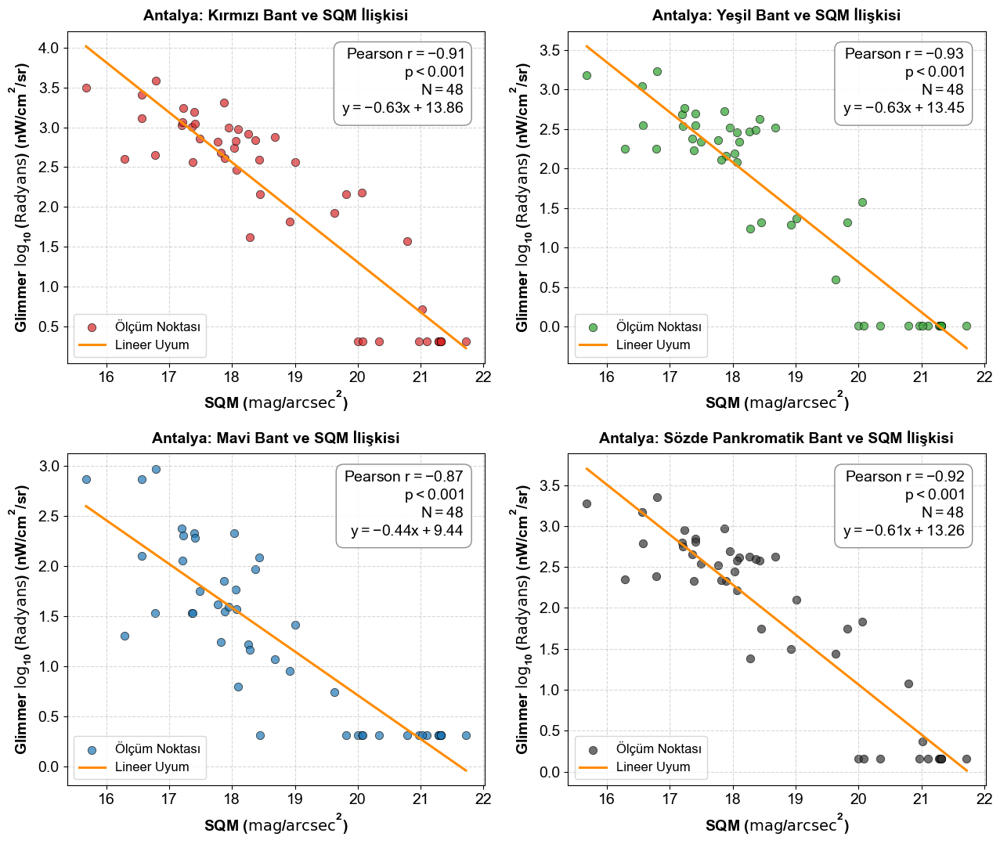

-> Grafik başarıyla kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_01_glimmer_vs_sqm_validation_Antalya.png

>>> [ERZURUM] GLIMMER ve SQM VALIDASYON ANALİZİ BAŞLATILIYOR
-> Kullanılan Raster: KX10_GIU_20250912_E40.29_N41.18_202500096198_L4A_A_RGB_EPSG4326_RADIANCE_MERGED_CLIPPED.tif
-> Başarıyla eşleşen ölçüm sayısı (N): 61


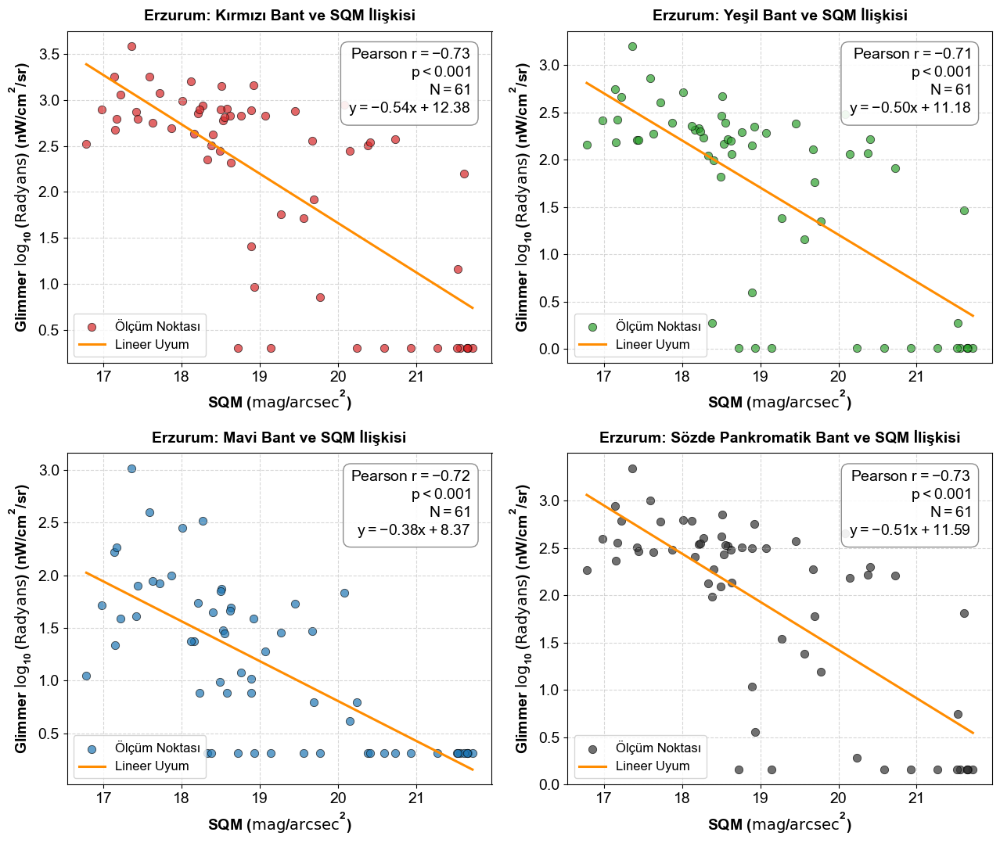

-> Grafik başarıyla kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_01_glimmer_vs_sqm_validation_Erzurum.png

TÜM ŞEHİRLER İÇİN GLIMMER vs SQM VALIDASYONU TAMAMLANDI!


In [1]:

"""SDGSAT-1 Glimmer ve Yer Tabanlı SQM Ölçümleri Korelasyon ve Regresyon Analizi
----------------------------------------------------------------------
Bu script;
1. Belirtilen klasörlerdeki Glimmer (*_MERGED_CLIPPED.tif) rasterlarını okur.
2. SQM ölçüm noktalarının (Lat, Lon) koordinatlarını alır.
3. Glimmer RGB bantlarından piksel değerlerini çeker ve Pseudo-Pankromatik bandı hesaplar:
   Pseudo-Pan = (0.2989 * R) + (0.5870 * G) + (0.1140 * B)
4. SQM logaritmik bir büyüklük (mag/arcsec^2) olduğu için uydu radyansına log10 dönüşümü uygular.
5. Pearson korelasyon katsayısı (r) ve 1. derece regresyon doğrusunu hesaplar.
6. Sonuçları Antalya ve Erzurum için sırasıyla 2x2 yüksek çözünürlüklügrafik olarak kaydeder.
"""

# Gerekli modülleri içe aktarıyoruz
import glob
import os
import warnings
import geopandas as gpd
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio
from scipy.stats import pearsonr
# Uyarıları kapatıyoruz
warnings.filterwarnings('ignore')

# -----------------------------------------------------------------------------
# GRAFİK VE YAZI TİPİ AYARLARI
# -----------------------------------------------------------------------------
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans', 'Liberation Sans', 'Helvetica', 'sans-serif'],
    'mathtext.fontset': ('dejavusans'),
    'mathtext.default': ('regular'),
    'font.size': 14,
    'axes.labelsize': 14,
    'axes.titlesize': 14,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 12,
    'figure.titlesize': 16,
})

def validate_glimmer_with_sqm(
    city_name, raster_folder, sqm_txt_path, output_dir
):
    """Belirli bir şehir için Glimmer rasterı ile SQM ölçümlerini doğrular ve grafik üretir."""
    print(f"\n{'='*65}")
    print(f'>>> [{city_name.upper()}] GLIMMER ve SQM VALIDASYON ANALİZİ BAŞLATILIYOR')
    print(f"{'='*65}")

    # 1. RASTER DOSYASINI BULMA
    # Klasör içerisindeki _MERGED_CLIPPED.tif dosyasını arar
    tif_candidates = glob.glob(os.path.join(raster_folder, "*_MERGED_CLIPPED.tif"))
    
    if not tif_candidates:
        print(f"[HATA] '{raster_folder}' dizininde uygun .tif dosyası bulunamadı!")
        return

    raster_path = tif_candidates[0]
    print(f'-> Kullanılan Raster: {os.path.basename(raster_path)}')

    # 2. SQM METİN DOSYASINI OKUMA VE DOĞRULAMA
    if not os.path.exists(sqm_txt_path):
        print(f'[HATA] SQM veri dosyası bulunamadı: {sqm_txt_path}')
        return

    try:
        df = pd.read_csv(sqm_txt_path, sep='\t')
        df.columns = [c.strip() for c in df.columns]
    except Exception as e:
        print(f'[HATA] Metin dosyası okunamadı: {e}')
        return

    req_cols = {
        'Enlem (Derece)': 'lat',
        'Boylam (Derece)': 'lon',
        'Ortalama_MPSAS (mag/arcsec^2)': 'sqm',
    }

    for col in req_cols.keys():
        if col not in df.columns:
            print(f"[HATA] Gerekli sütun '{col}' metin dosyasında bulunamadı!")
            return

    # Sütunları yeniden adlandır ve eksik değerleri temizle
    df = df.rename(columns=req_cols)[['lat', 'lon', 'sqm']]
    df = df.dropna(subset=['lat', 'lon', 'sqm']).reset_index(drop=True)
    df['sqm'] = pd.to_numeric(df['sqm'], errors='coerce')
    df = df.dropna(subset=['sqm']).reset_index(drop=True)

    # 3. NOKTA VERİLERİNİ OLUŞTURMA VE RASTERDAN ÖRNEKLEME
    gdf = gpd.GeoDataFrame(
        df, geometry=gpd.points_from_xy(df.lon, df.lat), crs='EPSG:4326'
    )

    results = []
    try:
        with rasterio.open(raster_path) as src:
            # Projeksiyon uyumsuzluğu varsa dönüştür
            if gdf.crs != src.crs:
                print(f'-> Projeksiyon dönüşümü: {gdf.crs} -> {src.crs}')
                gdf = gdf.to_crs(src.crs)

            coords = [(geom.x, geom.y) for geom in gdf.geometry]
            sampled_values = list(src.sample(coords))

            for i, val in enumerate(sampled_values):
                try:
                    r_val = float(val[0])
                    g_val = float(val[1])
                    b_val = float(val[2])

                    # Pseudo-Pankromatik bant türetimi
                    pan_val = ((0.2989 * r_val) + (0.5870 * g_val) + (0.1140 * b_val))

                    # Sıfır ve gürültü/negatif radyans değerlerini filtrele
                    if (pan_val > 0.001 and r_val > 0 and g_val > 0 and b_val > 0):
                        results.append({
                            'SQM': float(df.iloc[i]['sqm']),
                            'Red': r_val,
                            'Green': g_val,
                            'Blue': b_val,
                            'Pseudo-Pan': pan_val,
                        })
                except (IndexError, ValueError, TypeError):
                    continue

    except Exception as e:
        print(f'[HATA] Raster okuma/örnekleme hatası: {e}')
        return

    res_df = pd.DataFrame(results)

    if len(res_df) < 5:
        print(f'[UYARI] {city_name} için yeterli çakışan geçerli veri noktası bulunamadı (N={len(res_df)}).')
        return

    print(f'-> Başarıyla eşleşen ölçüm sayısı (N): {len(res_df)}')

    # 4. LOGARİTMİK DÖNÜŞÜM (Log10 Radiance)
    # SQM logaritmik (astronomik kadir) ölçekte olduğundan uydu radyansının da log10'u alınır
    for band in ['Red', 'Green', 'Blue', 'Pseudo-Pan']:
        res_df[f'Log_{band}'] = np.log10(res_df[band])

    # 5. GÖRSELLEŞTİRME VE REGRESYON (2x2 Subplots)
    fig, axs = plt.subplots(2, 2, figsize=(13, 11))
    axs = axs.flatten()

    bands = ['Red', 'Green', 'Blue', 'Pseudo-Pan']
    colors = ['#d62728', '#2ca02c', '#1f77b4', '#333333']  # Kırmızı, Yeşil, Mavi, Koyu Gri

    band_tr_names = {
        'Red': 'Kırmızı Bant',
        'Green': 'Yeşil Bant',
        'Blue': 'Mavi Bant',
        'Pseudo-Pan': 'Sözde Pankromatik Bant',
    }

    for i, band in enumerate(bands):
        ax = axs[i]
        tr_label = band_tr_names[band]

        x = res_df['SQM'].values
        y = res_df[f'Log_{band}'].values

        # Pearson Korelasyonu
        r_val, p_val = pearsonr(x, y)

        # 1. Derece Lineer Regresyon (y = mx + b)
        slope, intercept = np.polyfit(x, y, 1)
        x_line = np.linspace(min(x), max(x), 100)
        y_line = slope * x_line + intercept

        # Saçılım (Scatter) ve Regresyon Doğrusu
        ax.scatter(x, y, color=colors[i], alpha=0.70, s=55, edgecolors='k', linewidth=0.6, label='Ölçüm Noktası')
        ax.plot(x_line, y_line, color='darkorange', linewidth=2.2, linestyle='-', label='Lineer Uyum')

        # Eksen ve Başlıklar
        ax.set_title(f'{city_name}: {tr_label} ve SQM İlişkisi', fontweight='bold', pad=10)
        ax.set_xlabel(r'SQM ($\text{mag}/\text{arcsec}^2$)', fontweight='bold')
        ax.set_ylabel(r"Glimmer $\log_{10}(\text{Radyans})$ ($nW/cm^{2}/sr$)", fontweight='bold')
        ax.grid(True, linestyle='--', alpha=0.5)
        ax.legend(loc='lower left', frameon=True)

        # İstatistik Bilgi Kutusu (Düzeltilmiş p-değeri mantığı)
        p_str = (r'p < 0.001' if p_val < 0.001 else rf'p = {p_val:.3f}')
        stats_text = (
            rf'Pearson $r = {r_val:.2f}$' + '\n'
            rf'${p_str}$' + '\n'
            rf'$N = {len(res_df)}$' + '\n'
            rf'$y = {slope:.2f}x + {intercept:.2f}$'
        )
        props = dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9, edgecolor='gray')
        ax.text(0.95, 0.95, stats_text, transform=ax.transAxes, verticalalignment='top', horizontalalignment='right', bbox=props)

    plt.tight_layout()

    # 6. GRAFİĞİ KAYDETME
    os.makedirs(output_dir, exist_ok=True)
    output_fig_path = os.path.join(output_dir, f'SONUC_RAPORU_GIU_01_glimmer_vs_sqm_validation_{city_name}.png')
    plt.savefig(output_fig_path, dpi=500, bbox_inches='tight')
    plt.show()
    plt.close(fig)  # Bellek temizliği
    print(f'-> Grafik başarıyla kaydedildi:\n   {output_fig_path}')

# =============================================================================
# ÇALIŞTIRMA BLOĞU (ANTALYA VE ERZURUM)
# =============================================================================
if __name__ == '__main__':
    # İşletim sistemine göre dizin tespiti
    if os.name == 'nt':  # Windows
        base_dir = r'E:\=PROJELER\=TUBITAK_3501_2024'
        target_output_dir = r'C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer'
    else:  # Linux / macOS
        base_dir = os.path.expanduser('~/=PROJELER/=TUBITAK_3501_2024')
        target_output_dir = os.path.expanduser('~/ATASAM/=3501_2024/==notebooks/=cikti/glimmer')

    glimmer_radiance_dir = os.path.join(base_dir, 'veri', 'uydu', 'glimmer', '=03_radiance')
    sqm_base_dir = os.path.join(base_dir, 'veri', 'sqm', 'SQM_VERI_2025')

    tasks = [
        {
            'name': 'Antalya',
            'raster_folder': os.path.join(glimmer_radiance_dir, '20250926_Antalya'),
            'sqm_txt': os.path.join(sqm_base_dir, 'SQM_DUZENLI_VERI_ANTALYA.txt'),
        },
        {
            'name': 'Erzurum',
            'raster_folder': os.path.join(glimmer_radiance_dir, '20250912_Erzurum'),
            'sqm_txt': os.path.join(sqm_base_dir, 'SQM_DUZENLI_VERI_ERZURUM.txt'),
        },
    ]

    for task in tasks:
        validate_glimmer_with_sqm(
            city_name=task['name'],
            raster_folder=task['raster_folder'],
            sqm_txt_path=task['sqm_txt'],
            output_dir=target_output_dir,
        )

    print(f"\n{'='*65}")
    print('TÜM ŞEHİRLER İÇİN GLIMMER vs SQM VALIDASYONU TAMAMLANDI!')
    print(f"{'='*65}")



## **7.2.2 VIIRS VNP46A2 Referans Verilerinin Hazırlanması**

- Çapraz sensör doğrulamasında (validasyonunda) bağımsız referans veri seti olarak kullanılan NASA Black Marble (VNP46A2) ürünü; günlük bazda üretilen, ay ışığı etkisinden (BRDF modeli ile) ve atmosferik bozulmalardan arındırılmış 500 metre mekânsal çözünürlüklü gece radyans verisini ($nW/cm^2/sr$) sunmaktadır.

- Glimmer uydu geçiş tarihleriyle zamansal olarak eşleşen VIIRS verilerinin hazırlanması sürecinde şu adımlar izlenmiştir:

  1. Zaman Eşleştirmesi ve Veri Temini: Glimmer görüntülerinin çekim tarihleri (YYYYMMDD) hem standart hem de NASA'nın kullandığı Jülyen gün (AYYYYDOY) formatına dönüştürülerek arşivden aynı geceye ait Türkiye geneli VNP46A2 GeoTIFF dosyaları filtrelenmiştir.

  2. Coğrafi Maskeleme ve Sıkıştırma: Ayıklanan VNP46A2 görüntüleri, GADM veri tabanından alınan il sınırları (Shapefile) temel alınarak Antalya ve Erzurum çalışma alanlarına göre tam sınır geometrisiyle kırpılmıştır (clipping/masking). Çıktılar, kayıpsız LZW sıkıştırma algoritması, ve 256×256 bloklama (tiling) yapısıyla analiz dizinine aktarılmıştır.


In [1]:

"""Glimmer Tarihleriyle Eşleşen VIIRS VNP46A2 Görüntülerini Bulma ve Kesme (Clipping)
----------------------------------------------------------------------------------
1. Glimmer klasörlerini (örn: 20250310_Antalya, 20251020_Erzurum) tarar.
2. Tarih bilgisini hem standart (20250310) hem de Jülyen formatına (A2025069) çevirir.
3. VIIRS klasöründeki Türkiye GeoTIFF dosyaları içinden eşleşeni bulur.
4. İlgili ilin (Antalya veya Erzurum) Shapefile vektörü ile keser (Mask).
5. Sıkıştırılmış (LZW + Predictor) GeoTIFF olarak hedef dizine kaydeder.
"""

# Gerekli modülleri içe aktarıyoruz
from datetime import datetime
import glob
import os
import re
import warnings
import geopandas as gpd
import rasterio
from rasterio.mask import mask
from shapely.geometry import mapping
# Uyarıları kapatıyoruz
warnings.filterwarnings('ignore')

# =============================================================================
# 1. DİZİN VE DOSYA YOLLARI KONFİGÜRASYONU (Platform Bağımsız)
# =============================================================================
if os.name == 'nt':  # Windows
    base_dir = r'E:\=PROJELER\=TUBITAK_3501_2024'
else:  # Linux / macOS
    base_dir = os.path.expanduser('~/=PROJELER/=TUBITAK_3501_2024')

# Glimmer klasörlerinin bulunduğu ana dizin
glimmer_base_dir = os.path.join(base_dir, 'veri', 'uydu', 'glimmer', '=03_radiance')

# VIIRS Türkiye GeoTIFF dosyalarının bulunduğu klasör
viirs_source_dir = os.path.join(base_dir, 'veri', 'uydu', 'viirs_ntl', 'TifFiles', 'VNP46A2', '2025')

# Kesilen VIIRS çıktılarının kaydedileceği hedef dizin
output_dir = os.path.join(base_dir, 'veri', 'uydu', 'glimmer', '==viirs_vnp46a2')

# Şehir sınır vektörleri (Shapefile)
vector_base_dir = os.path.join(base_dir, 'veri', 'vektor')
shp_paths = {'antalya': os.path.join(vector_base_dir, 'gadm41_ANT_shp', 'gadm41_ANT.shp'),
             'erzurum': os.path.join(vector_base_dir, 'gadm41_ERZ_shp', 'gadm41_ERZ.shp'),
            }

# =============================================================================
# 2. YARDIMCI FONKSİYONLAR
# =============================================================================
def find_matching_viirs_file(viirs_dir, date_obj):
    """Belirli bir tarih için VIIRS klasöründeki dosyayı arar.
    NASA Jülyen formatı (A2025069) veya Standart format (20250310 / 2025-03-10 / 2025_03_10) ile eşleştirir.
    """
    if not os.path.exists(viirs_dir):
        return None

    julian_str = f"A{date_obj.year}{date_obj.strftime('%j')}"  # Örn: A2025069
    std_date_str = date_obj.strftime('%Y%m%d')  # Örn: 20250310
    iso_date_str = date_obj.strftime('%Y-%m-%d')  # Örn: 2025-03-10 (Düzeltildi)
    us_date_str = date_obj.strftime('%Y_%m_%d')  # Örn: 2025_03_10

    # Olası tüm tarih format kalıpları
    patterns = [julian_str, std_date_str, iso_date_str, us_date_str]

    for root, _, files in os.walk(viirs_dir):
        for fname in files:
            if fname.lower().endswith(('.tif', '.tiff')):
                # Türkiye mozaik dosyası ve ilgili tarih deseni içeriyor mu?
                if any(p in fname for p in patterns) and (
                    'turkiye' in fname.lower() or 'ntl' in fname.lower()
                ):
                    return os.path.join(root, fname)

    return None

def clip_raster_with_shp(raster_path, shp_path, out_file):
    """Raster dosyasını vektör geometrisi ile keser ve LZW sıkıştırma ile diske yazar."""
    gdf = gpd.read_file(shp_path)

    with rasterio.open(raster_path) as src:
        # CRS senkronizasyonu
        if gdf.crs != src.crs:
            gdf = gdf.to_crs(src.crs)

        # Boş olmayan geometrileri hazırla
        shapes = [mapping(geom) for geom in gdf.geometry if geom is not None]

        # Kırpma (Mask) işlemi
        nodata_val = src.nodata if src.nodata is not None else 0.0
        out_image, out_transform = mask(src, shapes, crop=True, nodata=nodata_val)

        # Veri tipine göre Predictor seçimi (Float için 3, Int için 2)
        is_float = 'float' in str(out_image.dtype).lower()
        predictor_val = 3 if is_float else 2

        out_meta = src.meta.copy()
        out_meta.update({
            'driver': 'GTiff',
            'height': out_image.shape[1],
            'width': out_image.shape[2],
            'transform': out_transform,
            'nodata': nodata_val,
            'compress': 'lzw',
            'predictor': predictor_val,
            'tiled': True,
            'blockxsize': 256,
            'blockysize': 256,
            'bigtiff': 'IF_SAFER',
        })

        with rasterio.open(out_file, 'w', **out_meta) as dest:
            dest.write(out_image)

# =============================================================================
# 3. ANA İŞ AKIŞI (BATCH PROCESSING)
# =============================================================================
def main():
    os.makedirs(output_dir, exist_ok=True)

    print(f"{'='*70}")
    print('GLIMMER - VIIRS VNP46A2 EŞLEŞTİRME VE KESME İŞLEMİ BAŞLATILIYOR')
    print(f"{'='*70}\n")

    if not os.path.exists(glimmer_base_dir):
        print(f"[HATA] Glimmer ana dizini bulunamadı: '{glimmer_base_dir}'")
        return

    # Glimmer klasörlerini listele (örn: 20250310_Antalya)
    glimmer_folders = [
        f
        for f in os.listdir(glimmer_base_dir)
        if os.path.isdir(os.path.join(glimmer_base_dir, f)) and '_' in f
    ]

    if not glimmer_folders:
        print(f"[HATA] '{glimmer_base_dir}' dizininde 'YYYYMMDD_Sehir' formatında klasör bulunamadı.")
        return

    print(f'Toplam {len(glimmer_folders)} adet Glimmer klasörü tespit edildi:\n')

    success_count = 0

    for folder_name in sorted(glimmer_folders):
        print(f'-> İnceleniyor: {folder_name}')

        # Regex: 8 haneli tarih + alt çizgi + Şehir ismi
        match = re.search(r'(\d{8})_([a-zA-ZçğıöşüÇĞİÖŞÜ]+)', folder_name)
        if not match:
            print(f'   [ATLANDI] Klasör adı formatı uymuyor: {folder_name}')
            continue

        date_str, city_raw = match.groups()
        city_key = city_raw.lower()

        try:
            date_obj = datetime.strptime(date_str, '%Y%m%d')
        except ValueError:
            print(f'   [HATA] Geçersiz tarih formatı: {date_str}')
            continue

        # Şehir eşleştirme
        if 'ant' in city_key:
            city_name = 'Antalya'
            target_shp = shp_paths['antalya']
        elif 'erz' in city_key:
            city_name = 'Erzurum'
            target_shp = shp_paths['erzurum']
        else:
            print(f'   [ATLANDI] Tanımlanamayan şehir: {city_raw}')
            continue

        if not os.path.exists(target_shp):
            print(f'   [HATA] Shapefile dosyası bulunamadı: {target_shp}')
            continue

        # VIIRS dosyasını bul
        matched_viirs = find_matching_viirs_file(viirs_source_dir, date_obj)

        if not matched_viirs:
            julian_str = f"A{date_obj.year}{date_obj.strftime('%j')}"
            print(f"   [BULUNAMADI] {date_str} ({julian_str}) tarihli VIIRS görüntüsü '{viirs_source_dir}' içinde bulunamadı.")
            continue

        print(f'   Eşleşen VIIRS Dosyası : {os.path.basename(matched_viirs)}')
        print(f'   Kullanılan Sınır      : {city_name} Shapefile')

        # Çıktı dosya adı oluşturma
        output_filename = f'VNP46A2_{date_str}_{city_name}_CLIPPED.tif'
        output_filepath = os.path.join(output_dir, output_filename)

        try:
            clip_raster_with_shp(matched_viirs, target_shp, output_filepath)
            file_size_mb = os.path.getsize(output_filepath) / (1024 * 1024)
            print(f'   [BAŞARILI] Kaydedildi -> {output_filename} ({file_size_mb:.2f} MB)\n')
            success_count += 1
        except Exception as e:
            print(f'   [HATA] Kesme sırasında sorun oluştu: {e}\n')

    print(f"{'='*70}")
    print(f'İŞLEM TAMAMLANDI: {success_count}/{len(glimmer_folders)} dosya başarıyla kesildi.')
    print(f'Çıktı Klasörü: {output_dir}')
    print(f"{'='*70}")

if __name__ == '__main__':
    main()


GLIMMER - VIIRS VNP46A2 EŞLEŞTİRME VE KESME İŞLEMİ BAŞLATILIYOR

Toplam 10 adet Glimmer klasörü tespit edildi:

-> İnceleniyor: 20250310_Antalya
   Eşleşen VIIRS Dosyası : VNP46A2.A2025069.Gap_Filled_DNB_BRDF-Corrected_NTL.tif
   Kullanılan Sınır      : Antalya Shapefile
   [BAŞARILI] Kaydedildi -> VNP46A2_20250310_Antalya_CLIPPED.tif (0.51 MB)

-> İnceleniyor: 20250830_Antalya
   Eşleşen VIIRS Dosyası : VNP46A2.A2025242.Gap_Filled_DNB_BRDF-Corrected_NTL.tif
   Kullanılan Sınır      : Antalya Shapefile
   [BAŞARILI] Kaydedildi -> VNP46A2_20250830_Antalya_CLIPPED.tif (0.52 MB)

-> İnceleniyor: 20250907_Erzurum
   Eşleşen VIIRS Dosyası : VNP46A2.A2025250.Gap_Filled_DNB_BRDF-Corrected_NTL.tif
   Kullanılan Sınır      : Erzurum Shapefile
   [BAŞARILI] Kaydedildi -> VNP46A2_20250907_Erzurum_CLIPPED.tif (0.17 MB)

-> İnceleniyor: 20250912_Erzurum
   Eşleşen VIIRS Dosyası : VNP46A2.A2025255.Gap_Filled_DNB_BRDF-Corrected_NTL.tif
   Kullanılan Sınır      : Erzurum Shapefile
   [BAŞARILI] Kayded


## **7.2.3 SDGSAT-1 Glimmer ve VIIRS VNP46A2 Çapraz Sensör Korelasyon Analizi**

- SDGSAT-1 Glimmer sensörü, 40 m mekânsal çözünürlüğü ve çok bantlı (Kırmızı, Yeşil, Mavi) yapısıyla yeryüzündeki yapay ışık kaynaklarını yüksek detayda kaydederken; VIIRS DNB sensörü 500 m çözünürlükte geniş bantlı (pankromatik) bir radyans ölçümü sağlamaktadır. Farklı mekânsal, spektral ve radyometrik karakteristiklere sahip bu iki uydu verisinin tutarlılığını test etmek amacıyla Antalya ve Erzurum illeri özelinde piksel tabanlı çapraz sensör korelasyon ve regresyon analizi yürütülmüştür. Analiz sürecinde uygulanan metodolojik adımlar şunlardır:

- Mekânsal Ölçekleme: 40 m'lik yüksek çözünürlüklü Glimmer pikselleri ile 500 m'lik VIIRS piksellerinin mekânsal uyumsuzluğunu gidermek için Glimmer verileri, piksel alan ortalaması (Resampling.average) yöntemiyle VIIRS grid geometrisine indirgenmiştir (downsampling). Bu yöntem, bir VIIRS hücresine (500×500 $m^2$) denk gelen yaklaşık 156 adet Glimmer alt pikselinin ortalamasını hesaplayarak, uzaydan algılanan toplam radyansın fiziksel olarak korunmasını sağlamıştır.

- Spektral Harmonizasyon ve Yapay Pankromatik Bant (Pseudo-Pan): VIIRS DNB'nin geniş spektral aralığı (500–900 nm) ile Glimmer'ın multispektral yapısını karşılaştırabilmek adına; Glimmer'ın Kırmızı (R), Yeşil (G) ve Mavi (B) bantlarının yanı sıra, insan gözünün aydınlatma duyarlılığını ve standart parlaklık ağırlıklarını temel alan Yapay Pankromatik (Pseudo-Panchromatic) bant türetilmiştir (Wang vd., 2024):

  $Yapay Pankromatik=0.2989×Kırmızı+0.5870×Yeşil+0.1140×Mavi$

- Arka Plan Gürültü Filtrelemesi: Her iki veri setindeki yapay ışıktan yoksun kırsal/karanlık alanları, su kütlelerini ve atmosferik arka plan gürültülerini elemek amacıyla $0.5$ $nW/cm^2/sr$ eşik değerinin altındaki pikseller maskelenerek analiz dışı bırakılmıştır.

- Yoğunluk Dağılımı ve İstatistiksel Modelleme: İki sensör arasındaki ilişki; on binlerce pikselin üst üste binmesini engelleyerek veri yoğunluğunu görselleştiren yoğunluk grafikleri (Hexagonal Binning - Hexbin), 1:1 Referans Doğrusu ve 1. Derece Lineer Regresyon ($y=mx+b$) modelleri ile değerlendirilmiştir. Sensörler arası uyum; Pearson korelasyon katsayısı (r), Kök Ortalama Kare Hata (RMSE) ve örneklem boyutu (N) metrikleriyle doğrulanmıştır.



>>> [ANTALYA] ÇAPRAZ SENSÖR ANALİZİ BAŞLATILIYOR...
   -> Glimmer Dosyası : KX10_GIU_20250926_E31.53_N37.30_202500100669_L4A_A_RGB_EPSG4326_RADIANCE_MERGED_CLIPPED.tif
   -> VIIRS Dosyası   : VNP46A2_20250926_Antalya_CLIPPED.tif
1. VIIRS verisi (Referans) yükleniyor...
   VIIRS Matris Boyutu: (320, 817)
2. Glimmer bantları okunuyor ve hesaplanıyor...
3. Yeniden Örnekleme (Resampling) ve İstatistiksel Modelleme...
   -> İşleniyor: Kırmızı Bant...
   -> İşleniyor: Yeşil Bant...
   -> İşleniyor: Mavi Bant...
   -> İşleniyor: Sözde Pankromatik Bant...


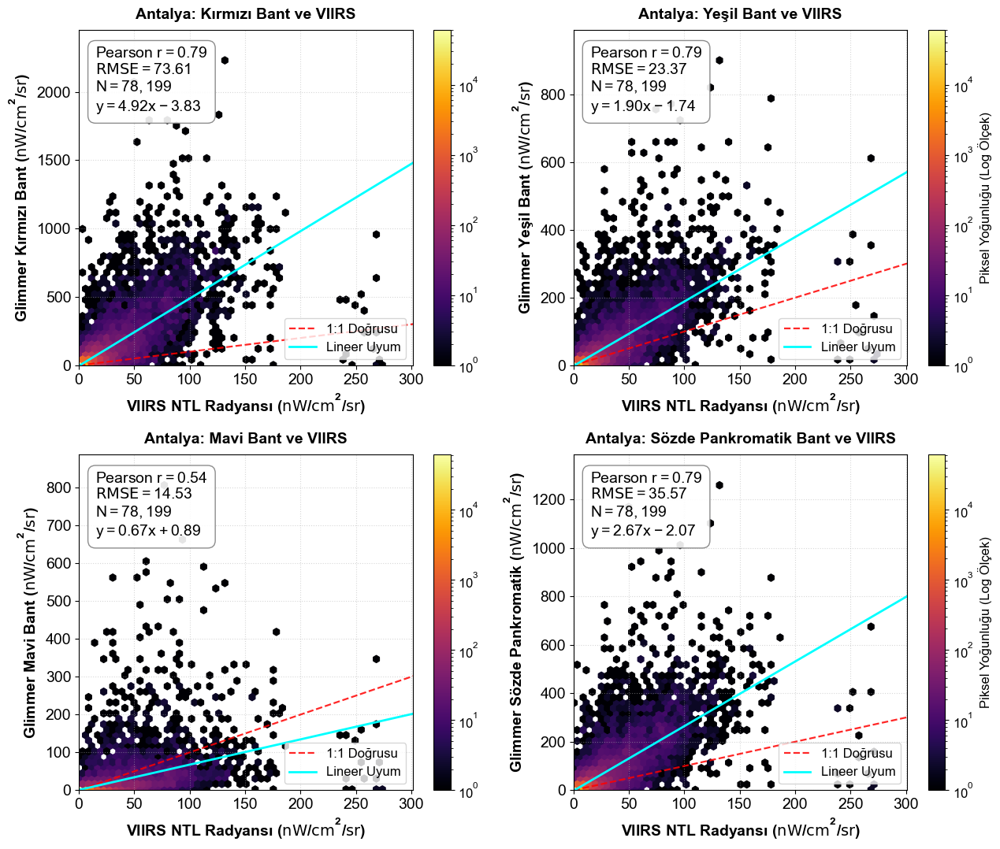

-> Grafik başarıyla kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_02_glimmer_vs_viirs_Antalya.png

>>> [ERZURUM] ÇAPRAZ SENSÖR ANALİZİ BAŞLATILIYOR...
   -> Glimmer Dosyası : KX10_GIU_20250912_E40.29_N41.18_202500096198_L4A_A_RGB_EPSG4326_RADIANCE_MERGED_CLIPPED.tif
   -> VIIRS Dosyası   : VNP46A2_20250912_Erzurum_CLIPPED.tif
1. VIIRS verisi (Referans) yükleniyor...
   VIIRS Matris Boyutu: (438, 560)
2. Glimmer bantları okunuyor ve hesaplanıyor...
3. Yeniden Örnekleme (Resampling) ve İstatistiksel Modelleme...
   -> İşleniyor: Kırmızı Bant...
   -> İşleniyor: Yeşil Bant...
   -> İşleniyor: Mavi Bant...
   -> İşleniyor: Sözde Pankromatik Bant...


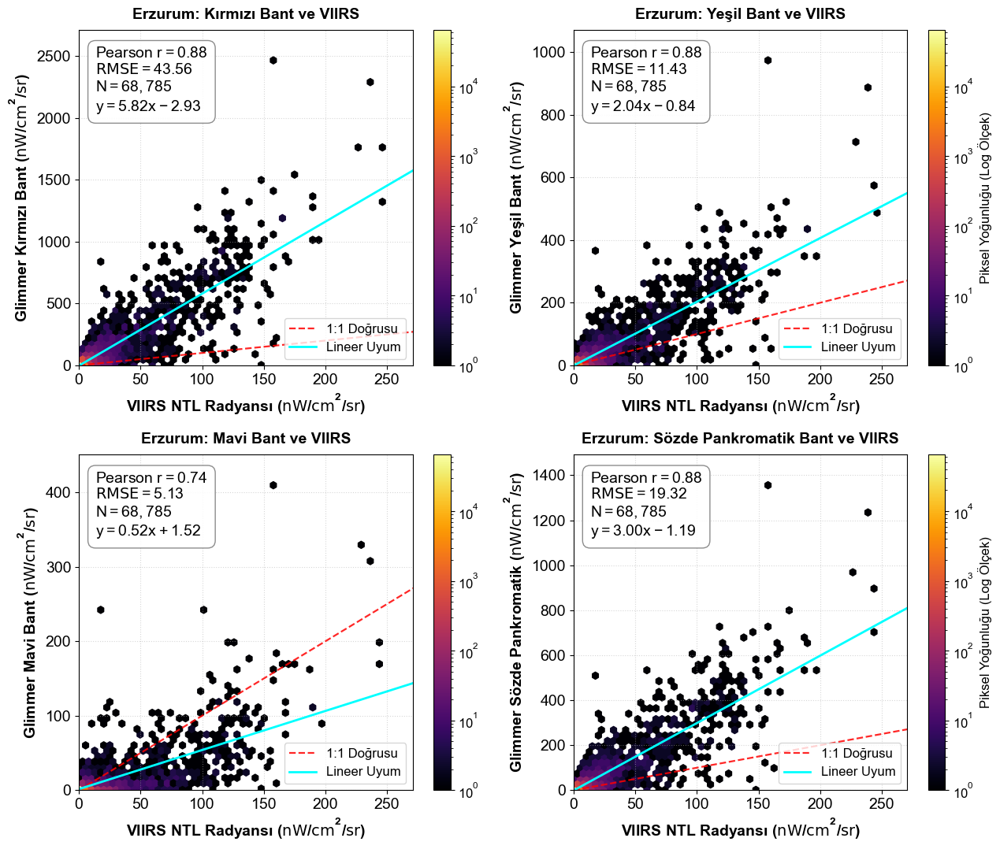

-> Grafik başarıyla kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_02_glimmer_vs_viirs_Erzurum.png

TÜM ŞEHİRLER İÇİN ANALİZLER TAMAMLANDI!
Grafikler kaydedildi -> C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer


In [1]:

"""KORELASYON VE REGRESYON: Glimmer vs VIIRS NTL (Antalya & Erzurum)
-----------------------------------------------------------------
- Glimmer (40m) -> VIIRS (500m) indirgemesinde alan ortalaması (Resampling.average) kullanılır.
- 0.1 altındaki gürültü ve sıfır pikselleri elenir.
- Antalya ve Erzurum için 2x2 Hexbin yoğunluk ve regresyon grafikleri sırayla üretilir.
"""

# Gerekli modülleri içe aktarıyoruz
import glob
import os
import warnings
import matplotlib.pyplot as plt
import numpy as np
import rasterio
from rasterio.warp import Resampling, reproject
from scipy.stats import pearsonr
# Uyarıları kapatıyoruz
warnings.filterwarnings('ignore')

# =============================================================================
# GRAFİK VE YAZI TİPİ AYARLARI
# =============================================================================
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans', 'Liberation Sans', 'Helvetica', 'sans-serif'],
    'mathtext.fontset': ('dejavusans'),
    'mathtext.default': ('regular'),
    'font.size': 14,
    'axes.labelsize': 14,
    'axes.titlesize': 14,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 12,
    'figure.titlesize': 16,
})

def resample_band_to_reference(
    src_band, src_transform, src_crs, dst_shape, dst_transform, dst_crs
):
    """Görüntüyü NoData değerlerini dışlayarak VIIRS gridine (500m) alan ortalaması (average) ile indirger."""
    resampled = np.zeros(dst_shape, dtype=np.float32)
    reproject(
        source=src_band,
        destination=resampled,
        src_transform=src_transform,
        src_crs=src_crs,
        dst_transform=dst_transform,
        dst_crs=dst_crs,
        src_nodata=0.0,  # Sınır dışı pikseller ortalamayı bozmasın
        dst_nodata=0.0,
        resampling=Resampling.average,
    )
    return resampled

def coklu_bant_analizi(
    glimmer_fp, viirs_fp, city_name, output_dir, noise_threshold=0.5
):
    """Belirtilen şehir için Glimmer vs VIIRS analizini yapar ve grafiği kaydeder."""
    glimmer_dosya_adi = os.path.basename(glimmer_fp)
    viirs_dosya_adi = os.path.basename(viirs_fp)

    print(f"\n{'='*70}")
    print(f'>>> [{city_name.upper()}] ÇAPRAZ SENSÖR ANALİZİ BAŞLATILIYOR...')
    print(f'   -> Glimmer Dosyası : {glimmer_dosya_adi}')
    print(f'   -> VIIRS Dosyası   : {viirs_dosya_adi}')
    print(f"{'='*70}")

    if not os.path.exists(glimmer_fp) or not os.path.exists(viirs_fp):
        print(f'[HATA] Dosyalardan biri bulunamadı!\n Glimmer: {glimmer_fp}\n VIIRS  : {viirs_fp}')
        return

    # 1. VIIRS VERİSİ (REFERANS) YÜKLENİYOR
    print('1. VIIRS verisi (Referans) yükleniyor...')
    with rasterio.open(viirs_fp) as src_viirs:
        viirs_data = src_viirs.read(1).astype('float32')
        viirs_data = np.nan_to_num(viirs_data, nan=0.0)

        dst_transform = src_viirs.transform
        dst_crs = src_viirs.crs
        dst_shape = viirs_data.shape
        print(f'   VIIRS Matris Boyutu: {dst_shape}')

    # 2. GLIMMER BANTLARI OKUNUYOR VE HESAPLANIYOR
    print('2. Glimmer bantları okunuyor ve hesaplanıyor...')
    with rasterio.open(glimmer_fp) as src_glimmer:
        src_transform = src_glimmer.transform
        src_crs = src_glimmer.crs

        R = src_glimmer.read(1).astype('float32')
        G = src_glimmer.read(2).astype('float32')
        B = src_glimmer.read(3).astype('float32')

        # Wang et al. (2024) Pseudo-Pan (Sözde Pankromatik) Hesabı
        PAN = (0.2989 * R) + (0.5870 * G) + (0.1140 * B)

    unit_str = r'($\text{nW}/\text{cm}^{2}/\text{sr}$)'
    bands_dict = {
        'Kırmızı Bant': (R, f'Glimmer Kırmızı Bant {unit_str}'),
        'Yeşil Bant': (G, f'Glimmer Yeşil Bant {unit_str}'),
        'Mavi Bant': (B, f'Glimmer Mavi Bant {unit_str}'),
        'Sözde Pankromatik Bant': (PAN, f'Glimmer Sözde Pankromatik {unit_str}'),
    }

    # 3. RESAMPLING VE İSTATİSTİKSEL ANALİZ (4 GRAFİK İÇİN)
    print('3. Yeniden Örnekleme (Resampling) ve İstatistiksel Modelleme...')
    fig, axs = plt.subplots(2, 2, figsize=(13, 11))
    axs = axs.flatten()

    v_flat = viirs_data.flatten()

    for i, (title, (band_data, ylabel)) in enumerate(bands_dict.items()):
        print(f'   -> İşleniyor: {title}...')

        # Resampling (Piksel Alan Ortalaması)
        resampled_band = resample_band_to_reference(
            band_data,
            src_transform,
            src_crs,
            dst_shape,
            dst_transform,
            dst_crs,
        )
        g_flat = resampled_band.flatten()

        # Maskeleme (Gürültü ve NoData Temizliği)
        valid_mask = ((v_flat > noise_threshold) & (g_flat > noise_threshold) & (~np.isnan(v_flat)) & (~np.isnan(g_flat)))
        v_valid = v_flat[valid_mask]
        g_valid = g_flat[valid_mask]

        if len(v_valid) < 10:
            print(f'   [UYARI] {title} için yeterli geçerli veri bulunamadı!')
            continue

        # İstatistikler (NumPy ile hızlı hesaplama)
        r_val, _ = pearsonr(v_valid, g_valid)
        rmse = np.sqrt(np.mean((v_valid - g_valid) ** 2))
        slope, intercept = np.polyfit(v_valid, g_valid, 1)

        # Çizim (Hexbin Logaritmik Yoğunluk)
        ax = axs[i]
        hb = ax.hexbin(v_valid, g_valid, gridsize=50, cmap='inferno', mincnt=1, bins='log')

        # İstatistik Bilgi Kutusu
        sign_str = '+' if intercept >= 0.0 else '-'
        stats_text = (
            rf'Pearson $r = {r_val:.2f}$' + '\n'
            rf'$\text{{RMSE}} = {rmse:.2f}$' + '\n'
            rf'$N = {len(v_valid):,}$' + '\n'
            rf'$y = {slope:.2f}x {sign_str} {abs(intercept):.2f}$'
        )

        props = dict(boxstyle='round,pad=0.5', facecolor='white', alpha=0.9, edgecolor='gray')
        ax.text(0.05, 0.95, stats_text, transform=ax.transAxes, verticalalignment='top', bbox=props)

        # 1:1 Referans Doğrusu
        max_lim = max(np.max(v_valid), np.max(g_valid))
        ax.plot([0, max_lim], [0, max_lim], 'r--', alpha=0.85, linewidth=1.6, label='1:1 Doğrusu')

        # Regresyon Doğrusu
        x_vals = np.array([0, max_lim])
        y_vals = slope * x_vals + intercept
        ax.plot(x_vals, y_vals, color='cyan', linewidth=2.0, label='Lineer Uyum')

        # Eksen ve Başlıklar
        ax.set_title(f'{city_name}: {title} ve VIIRS', fontweight='bold', pad=10)
        ax.set_xlabel(rf'VIIRS NTL Radyansı {unit_str}', fontweight='bold')
        ax.set_ylabel(ylabel, fontweight='bold')
        ax.set_xlim(0, np.max(v_valid) * 1.1)
        ax.set_ylim(0, np.max(g_valid) * 1.1)
        
        ax.grid(True, linestyle=':', alpha=0.5)

        # Renk Çubuğu (Colorbar)
        cb = plt.colorbar(hb, ax=ax)
        cb.ax.tick_params(labelsize=12)
        if i % 2 == 1:
            cb.set_label('Piksel Yoğunluğu (Log Ölçek)', fontsize=12)

        ax.legend(loc='lower right', frameon=True)

    plt.tight_layout()

    # 4. GRAFİĞİ KAYDETME
    os.makedirs(output_dir, exist_ok=True)
    output_img = os.path.join(output_dir, f'SONUC_RAPORU_GIU_02_glimmer_vs_viirs_{city_name}.png')
    plt.savefig(output_img, dpi=500, bbox_inches='tight')
    plt.show()
    plt.close(fig)
    print(f'-> Grafik başarıyla kaydedildi:\n   {output_img}')

# =============================================================================
# ÇALIŞTIRMA BLOĞU (ANTALYA VE ERZURUM)
# =============================================================================
if __name__ == '__main__':
    if os.name == 'nt':  # Windows
        base_dir = r'E:\=PROJELER\=TUBITAK_3501_2024'
        target_output_dir = r'C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer'
    else:  # Linux / macOS
        base_dir = os.path.expanduser('~/=PROJELER/=TUBITAK_3501_2024')
        target_output_dir = os.path.expanduser('~/ATASAM/=3501_2024/==notebooks/=cikti/glimmer')

    glimmer_base_dir = os.path.join(base_dir, 'veri', 'uydu', 'glimmer', '=03_radiance')
    viirs_clipped_dir = os.path.join(base_dir, 'veri', 'uydu', 'glimmer', '==viirs_vnp46a2')

    tasks = [
        {
            'name': 'Antalya',
            'glimmer_folder': os.path.join(glimmer_base_dir, '20250926_Antalya'),
            'viirs_search_pattern': os.path.join(viirs_clipped_dir, '*20250926_Antalya*.tif'),
        },
        {
            'name': 'Erzurum',
            'glimmer_folder': os.path.join(glimmer_base_dir, '20250912_Erzurum'),
            'viirs_search_pattern': os.path.join(viirs_clipped_dir, '*20250912_Erzurum*.tif'),
        },
    ]

    for task in tasks:
        # Glimmer rasterını ara
        glimmer_candidates = glob.glob(os.path.join(task['glimmer_folder'], '*_MERGED_CLIPPED.tif'))

        if not glimmer_candidates:
            glimmer_candidates = glob.glob(os.path.join(task['glimmer_folder'], '*.tif'))
            
        # VIIRS rasterını ara
        viirs_candidates = glob.glob(task['viirs_search_pattern'])
        
        if glimmer_candidates and viirs_candidates:
            coklu_bant_analizi(
                glimmer_fp=glimmer_candidates[0],
                viirs_fp=viirs_candidates[0],
                city_name=task['name'],
                output_dir=target_output_dir,
                noise_threshold=0.5,
            )
        else:
            print(f"\n[UYARI] [{task['name']}] için eşleşen dosyalar bulunamadı!")
            if not glimmer_candidates:
                print(f' - Glimmer raster bulunamadı: {task["glimmer_folder"]}')
            if not viirs_candidates:
                print(f' - VIIRS raster bulunamadı: {task["viirs_search_pattern"]}')

    print(f"\n{'='*70}")
    print('TÜM ŞEHİRLER İÇİN ANALİZLER TAMAMLANDI!')
    print(f'Grafikler kaydedildi -> {target_output_dir}')
    print(f"{'='*70}")



## **7.2.4 SDGSAT-1 Glimmer (RGB) ve VIIRS VNP46A2 Gece Işıklarının Mekânsal ve Görsel Karşılaştırması**

- Bir önceki bölümde yürütülen istatistiksel korelasyon analizleri, SDGSAT-1 Glimmer ile VIIRS VNP46A2 verileri arasında yüksek bir radyometrik tutarlılık olduğunu kanıtlamıştır. Bu aşamada, iki sensörün sunduğu mekânsal detay ve spektral ayırt etme yeteneklerini doğrudan ortaya koymak amacıyla, Antalya (26 Eylül 2025) ve Erzurum (12 Eylül 2025) çalışma alanları için eş zamanlı görüntüler üzerinden 2×2 mekânsal karşılaştırma panelleri üretilmiştir.

- Görselleştirme sürecinde geliştirilen Python tabanlı algoritmada şu teknik optimizasyonlar uygulanmıştır:

  1. Sensörler arası zamansal kaymaları ve mevsimsel aydınlatma farklılıklarını ortadan kaldırmak amacıyla, Glimmer geçiş günleriyle birebir aynı takvim gününe ait VIIRS VNP46A2 görüntüleri işlenmiştir.

  2. Gece ışıklarının aşırı sağa çarpık (geniş dinamik aralıklı) yapısını dengelemek amacıyla $0.1 - 10$ $nW/cm^2/sr$ aralığında logaritmik renk normalizasyonu (LogNorm) uygulanmıştır. Gürültü tabanını ve sensör parlama hatalarını ayıklamak için bu sınırlar piksellerin %2 ile %99 yüzdelik dilimleri üzerinden dinamik olarak belirlenmiştir.
 
  3. GADM il sınır vektörleri (geometry_mask) kullanılarak şehir sınırlarının dışındaki alanlar beyaz arka plan ile maskelenmiş; sınır içindeki ışıksız dağlık alanlar ve bulut boşlukları ise doğal gece karanlığını temsil edecek şekilde homojen siyah olarak görselleştirilmiştir.



>>> [ANTALYA] GÖRSELLEŞTİRME HARİTASI ÜRETİLİYOR...
-> Glimmer Dosyası : KX10_GIU_20250926_E31.53_N37.30_202500100669_L4A_A_RGB_EPSG4326_RADIANCE_MERGED_CLIPPED.tif
-> VIIRS Dosyası   : VNP46A2_20250926_Antalya_CLIPPED.tif


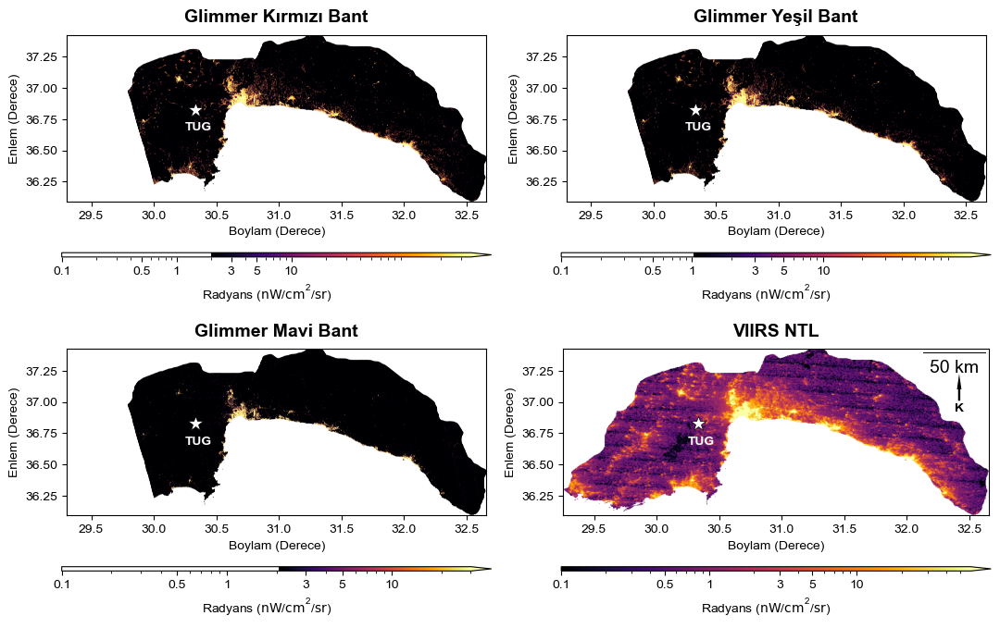

-> Başarılı! Harita kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_03_glimmer_vs_viirs_gorsel_karsilastirma_Antalya.png

>>> [ERZURUM] GÖRSELLEŞTİRME HARİTASI ÜRETİLİYOR...
-> Glimmer Dosyası : KX10_GIU_20250912_E40.29_N41.18_202500096198_L4A_A_RGB_EPSG4326_RADIANCE_MERGED_CLIPPED.tif
-> VIIRS Dosyası   : VNP46A2_20250912_Erzurum_CLIPPED.tif


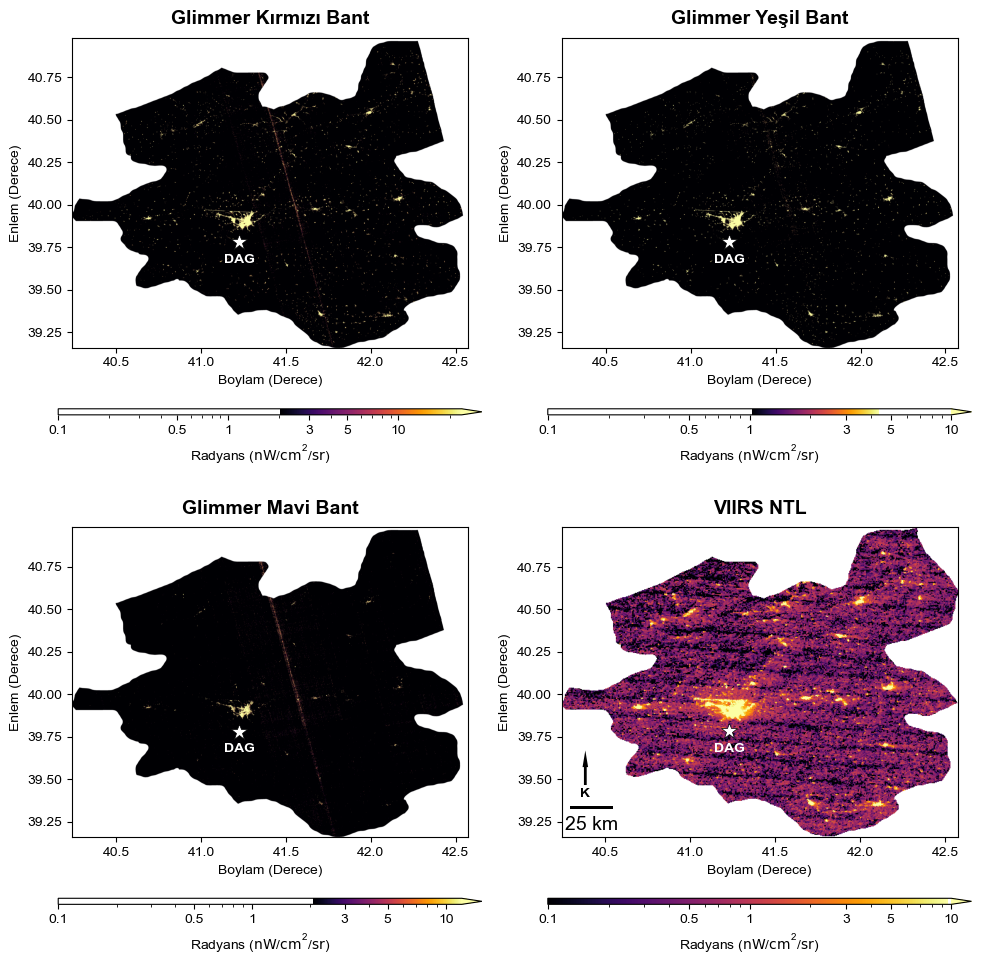

-> Başarılı! Harita kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_03_glimmer_vs_viirs_gorsel_karsilastirma_Erzurum.png

TÜM HARİTALAR KUSURSUZ ŞEKİLDE ÜRETİLDİ!
Kaydedilen Klasör: C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer


In [1]:

"""SDGSAT-1 Glimmer (RGB) ve VIIRS NTL 2x2 Mekânsal Karşılaştırma Haritaları (Cross-Platform)
------------------------------------------------------------------------------------------
- Glimmer ve VIIRS görüntülerini aynı tarih üzerinden otomatik eşleştirir.
- Glimmer haritaları: Orijinal dinamik persentil (nanpercentile) ile siyah/parlak kontrastında.
- VIIRS NTL haritası: Shapefile maskesi ile bulutlu/dağlık beyaz nan değerler kaldırılmış ve tam siyah yapılmış.
- Antalya (TUG) ve Erzurum (DAG) için sırayla üretilir.
"""

# Gerekli modülleri içe aktarıyoruz
import glob
import os
import re
import warnings
import geopandas as gpd
import matplotlib.pyplot as plt
from matplotlib.colors import LogNorm
from matplotlib_scalebar.scalebar import ScaleBar
import numpy as np
import rasterio
from rasterio.features import geometry_mask
# Uyarıları kapatıyoruz
warnings.filterwarnings('ignore')

# =============================================================================
# GRAFİK VE YAZI TİPİ AYARLARI
# =============================================================================
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans', 'Liberation Sans', 'Helvetica','sans-serif'],
    'mathtext.fontset': 'dejavusans',
    'mathtext.default': 'regular',
    'font.size': 14,
    'axes.labelsize': 14,
    'axes.titlesize': 14,
    'xtick.labelsize': 10,
    'ytick.labelsize': 10,
    'legend.fontsize': 12,
    'figure.titlesize': 16,
})

# =============================================================================
# HARİTA GÖRSELLEŞTİRME FONKSİYONU
# =============================================================================
def visualize_2x2_comparison(config, output_dir):
    city_name = config['name']
    glimmer_fp = config['glimmer_path']
    viirs_fp = config['viirs_path']
    shp_path = config['shp_path']

    print(f"\n{'='*70}")
    print(f'>>> [{city_name.upper()}] GÖRSELLEŞTİRME HARİTASI ÜRETİLİYOR...')
    print(f"{'='*70}")
    print(f'-> Glimmer Dosyası : {os.path.basename(glimmer_fp)}')
    print(f'-> VIIRS Dosyası   : {os.path.basename(viirs_fp)}')

    plot_data = {}

    # 1. Glimmer Bantlarını Oku
    with rasterio.open(glimmer_fp) as src:
        R = src.read(1).astype('float32')
        G = src.read(2).astype('float32')
        B = src.read(3).astype('float32')
        glimmer_extent = [
            src.bounds.left,
            src.bounds.right,
            src.bounds.bottom,
            src.bounds.top,
        ]
        plot_data['Glimmer Kırmızı Bant'] = R
        plot_data['Glimmer Yeşil Bant'] = G
        plot_data['Glimmer Mavi Bant'] = B

    # 2. VIIRS Verisini ve Shapefile Maskesini Oku
    gdf = gpd.read_file(shp_path)
    with rasterio.open(viirs_fp) as src_v:
        V = src_v.read(1).astype('float32')
        viirs_extent = [
            src_v.bounds.left,
            src_v.bounds.right,
            src_v.bounds.bottom,
            src_v.bounds.top,
        ]

        # VIIRS için gerçek il sınır dışı maskesi üret
        if gdf.crs != src_v.crs:
            gdf_viirs = gdf.to_crs(src_v.crs)
        else:
            gdf_viirs = gdf
        viirs_outside_mask = geometry_mask(
            gdf_viirs.geometry,
            transform=src_v.transform,
            out_shape=V.shape,
            invert=False,
        )
        plot_data['VIIRS NTL'] = V

    # 3. 2x2 Grid Çizimi
    fig, axs = plt.subplots(2, 2, figsize=config['figsize'], facecolor='white')
    axs = axs.flatten()

    titles = [
        'Glimmer Kırmızı Bant',
        'Glimmer Yeşil Bant',
        'Glimmer Mavi Bant',
        'VIIRS NTL',
    ]

    for i, ax in enumerate(axs):
        t = titles[i]
        data = plot_data[t].copy()

        # --- HER İKİ VERİ İÇİN AYRI ÖZEL İŞLEME ---
        if 'VIIRS' in t:
            # VIIRS İÇİN: Şehir içindeki bulutlu/boş pikselleri siyaha çek, sadece sınır dışını beyaz yap
            data[(data <= 0.05) | (data >= 500)] = 0.01
            data[viirs_outside_mask] = np.nan
            current_extent = viirs_extent

            vmin = 0.1
            vmax = np.nanpercentile(data[data > 0.05], 99)
            if np.isnan(vmax) or vmax <= vmin:
                vmax = vmin + 10

        else:
            # GLIMMER İÇİN: Orijinal çalışan mantık
            data[data <= 0] = np.nan
            current_extent = glimmer_extent

            try:
                vmin = np.nanpercentile(data, 2)
                vmax = np.nanpercentile(data, 99)
            except Exception:
                vmin, vmax = 0.1, 10

            if np.isnan(vmin) or vmin <= 0:
                vmin = 0.1
            if np.isnan(vmax) or vmax <= vmin:
                vmax = vmin + 10

        # Renk paletinde NaN (sınır dışı) pikselleri BEYAZ yap
        current_cmap = plt.cm.inferno.copy()
        current_cmap.set_bad(color='white')

        # Haritayı Çiz
        im = ax.imshow(
            data,
            cmap=current_cmap,
            norm=LogNorm(vmin=vmin, vmax=vmax),
            extent=current_extent,
            origin='upper',
        )

        ax.set_title(titles[i], fontweight='bold', pad=10)
        ax.set_xlabel('Boylam (Derece)', fontsize=10)
        ax.set_ylabel('Enlem (Derece)', fontsize=10)

        # Renk Çubuğu (Horizontal Colorbar)
        cbar = plt.colorbar(
            im,
            ax=ax,
            extend='max',
            orientation='horizontal',
            shrink=1.0,
            aspect=config['cbar_aspect'],
            pad=config['cbar_pad'],
        )
        levels = [0.1, 0.5, 1, 3, 5, 10]
        cbar.set_ticks(levels)
        cbar.set_ticklabels([f'{x:g}' for x in levels])
        cbar.set_label(r'Radyans ($\text{nW}/\text{cm}^{2}/\text{sr}$)', fontsize=10)
        cbar.ax.tick_params(labelsize=10)

        # Gözlemevi Noktası ve Yazısı (TUG / DAG)
        obs_x, obs_y = config['obs_coords']
        txt_x, txt_y = config['obs_text_coords']
        ax.plot(obs_x, obs_y, 'w*', markersize=12, zorder=10, markeredgecolor='k', markeredgewidth=0.5)
        ax.text(txt_x, txt_y, config['obs_name'], color='white', fontweight='bold', fontsize=10, zorder=10)
        ax.grid(False)

    # 4. Kuzey Oku ve Ölçek Çubuğu
    last_ax = axs[-1]
    nx, ny, nlen = config['arrow_params']
    last_ax.annotate('K', xy=(nx, ny), xytext=(nx, ny - nlen), color='black',
                     arrowprops=dict(facecolor='black', edgecolor='none', width=config['arrow_width'], headwidth=config['arrow_headwidth'], alpha=1.0,),
                     ha='center', va='center', xycoords=last_ax.transAxes, fontweight='bold', fontsize=10)

    scalebar = ScaleBar(100, 'km', location=config['scalebar_loc'], pad=0.1, border_pad=0.1, color='black', box_color='none')
    last_ax.add_artist(scalebar)

    plt.tight_layout()

    # 5. Kaydetme
    os.makedirs(output_dir, exist_ok=True)
    out_file = os.path.join(output_dir, f'SONUC_RAPORU_GIU_03_glimmer_vs_viirs_gorsel_karsilastirma_{city_name}.png')
    plt.savefig(out_file, dpi=500, bbox_inches='tight', facecolor='white')
    plt.show()
    plt.close(fig)
    print(f'-> Başarılı! Harita kaydedildi:\n   {out_file}')

# =============================================================================
# ÇALIŞTIRMA BLOĞU (ANTALYA VE ERZURUM)
# =============================================================================
if __name__ == '__main__':
    # AYARLAR VE DİZİNLER (İşletim Sistemine Göre Otomatik Yol Seçimi)
    if os.name == 'nt':  # Windows
        base_dir = r'E:\=PROJELER\=TUBITAK_3501_2024'
        target_output_dir = r'C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer'
    else:  # Linux / macOS
        base_dir = os.path.expanduser('~/=PROJELER/=TUBITAK_3501_2024')
        target_output_dir = os.path.expanduser('~/ATASAM/=3501_2024/==notebooks/=cikti/glimmer')

    glimmer_base_dir = os.path.join(base_dir, 'veri', 'uydu', 'glimmer', '=03_radiance')
    viirs_clipped_dir = os.path.join(base_dir, 'veri', 'uydu', 'glimmer', '==viirs_vnp46a2')
    vector_base_dir = os.path.join(base_dir, 'veri', 'vektor')

    tasks = [
        {
            'name': 'Antalya',
            'glimmer_folder': os.path.join(glimmer_base_dir, '20250926_Antalya'),
            'shp_path': os.path.join(vector_base_dir, 'gadm41_ANT_shp', 'gadm41_ANT.shp'),
            'obs_name': 'TUG',
            'obs_coords': (30.335311, 36.824305),
            'obs_text_coords': (30.25, 36.66),
            'figsize': (11, 7),
            'cbar_aspect': 100,
            'cbar_pad': 0.20,
            'scalebar_loc': 'upper right',
            'arrow_params': (0.93, 0.85, 0.21),
            'arrow_width': 1.7,
            'arrow_headwidth': 3.5,
        },
        {
            'name': 'Erzurum',
            'glimmer_folder': os.path.join(glimmer_base_dir, '20250912_Erzurum'),
            'shp_path': os.path.join(vector_base_dir, 'gadm41_ERZ_shp', 'gadm41_ERZ.shp'),
            'obs_name': 'DAG',
            'obs_coords': (41.226446, 39.780950),
            'obs_text_coords': (41.138, 39.66),
            'figsize': (10, 10),
            'cbar_aspect': 70,
            'cbar_pad': 0.14,
            'scalebar_loc': 'lower left',
            'arrow_params': (0.06, 0.28, 0.14),
            'arrow_width': 2.0,
            'arrow_headwidth': 4.0,
        },
    ]

    for task in tasks:
        # 1. Glimmer dosyasını bul
        glimmer_candidates = glob.glob(os.path.join(task['glimmer_folder'], '*_MERGED_CLIPPED.tif'))
        if not glimmer_candidates:
            glimmer_candidates = glob.glob(os.path.join(task['glimmer_folder'], '*.tif'))

        if not glimmer_candidates:
            print(f"\n[UYARI] [{task['name']}] için Glimmer dosyası bulunamadı -> {task['glimmer_folder']}")
            continue

        glimmer_file = glimmer_candidates[0]

        # 2. Glimmer klasör veya dosya adından tarihi (YYYYMMDD) ayıkla (Örn: 20250926)
        date_match = re.search(r'(202\d{5})', os.path.basename(task['glimmer_folder'])) or re.search(r'(202\d{5})', os.path.basename(glimmer_file))

        # 3. Aynı tarihli ve aynı şehir isimli VIIRS dosyasını bul
        if date_match:
            target_date = date_match.group(1)
            viirs_candidates = glob.glob(os.path.join(viirs_clipped_dir, f"*{target_date}*{task['name']}*.tif"))
            if not viirs_candidates:
                viirs_candidates = glob.glob(os.path.join(viirs_clipped_dir, f"*{task['name']}*{target_date}*.tif"))
        else:
            viirs_candidates = glob.glob(os.path.join(viirs_clipped_dir, f"*{task['name']}*.tif"))

        if glimmer_candidates and viirs_candidates:
            task['glimmer_path'] = glimmer_file
            task['viirs_path'] = viirs_candidates[0]

            visualize_2x2_comparison(task, target_output_dir)
        else:
            print(f"\n[UYARI] [{task['name']}] için eşleşen aynı tarihli dosyalar bulunamadı!")
            if not viirs_candidates:
                print(f" - Eşleşen VIIRS bulunamadı ({target_date if date_match else ''} {task['name']}) -> {viirs_clipped_dir}")

    print(f"\n{'='*70}")
    print('TÜM HARİTALAR KUSURSUZ ŞEKİLDE ÜRETİLDİ!')
    print(f'Kaydedilen Klasör: {target_output_dir}')
    print(f"{'='*70}")



## **7.3 SDGSAT-1 Glimmer Çok Bantlı Gece Işıkları ile Kentsel Aydınlatma Türlerinin Sınıflandırılması**

- Geleneksel gece ışığı uyduları (DMSP-OLS, Suomi-NPP VIIRS DNB), geniş bantlı pankromatik (tek kanallı) sensörler kullandıkları için sokak aydınlatmasındaki teknolojik dönüşümü (geleneksel yüksek basınçlı sodyum lambalardan modern beyaz LED'lere geçişi) spektral olarak ayırt edemezler.

- Kasım 2021'de fırlatılan SDGSAT-1 uydusu, bünyesindeki Glimmer algılayıcısı ile 40 metre mekânsal çözünürlükte çok bantlı (Kırmızı, Yeşil, Mavi - RGB) gece görüntüleri sunarak uzaktan algılamada yeni bir çığır açmıştır.

- Bu eğitim serisinin bu bölümünün temel amaçları şunlardır:

  1. Kalibre edilmiş SDGSAT-1 Glimmer RGB radyans görüntülerinden yararlanarak kentsel aydınlatma armatürlerini Sodyum Buharlı (HPS), Beyaz LED (WLED) ve Kırmızı/Sıcak LED (RLED) sınıflarına ayırmak.

  2. Zemin gürültüsü ile gerçek aydınlatılmış alanları dinamik istatistiksel eşikleme ile ayrıştırmak.
 
  3. Sınıflandırma çıktılarını CBS yazılımlarında (QGIS, ArcGIS vb.) doğrudan kullanılabilecek standart GeoTIFF formatında kaydetmek.
 
  4. Hem il genelini hem de astronomik gözlemevlerini (TUG ve DAG) kapsayan çift panelli tematik haritaları üretmek.



>>> [ANTALYA] AYDINLATMA SINIFLANDIRMASI VE HARİTALANDIRMA BAŞLATILIYOR
-> Hesaplanan Aydınlatma Eşiği (T): 34.1830 nW/(cm²·sr)
-> Toplam Aydınlatılmış Piksel Sayısı : 410,081
   - Beyaz LED (WLED)                 : 39,284 (9.58%)
   - Sodyum Buharlı (HPS / Diğer)     : 347,268 (84.68%)
   - Kırmızı / Sıcak LED (RLED)       : 23,529 (5.74%)
-> Sınıflandırılmış GeoTIFF kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_04_Antalya_lamba_siniflandirma_zoom.tif


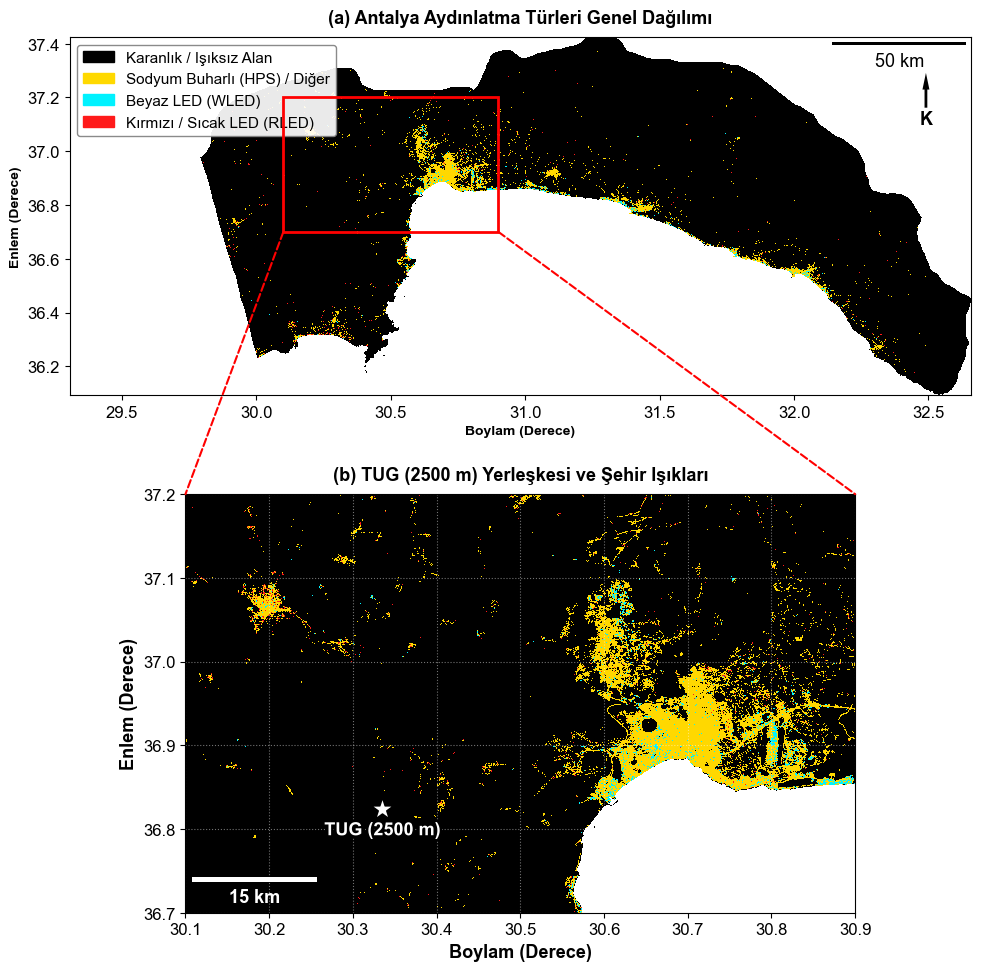

-> Başarılı! Harita kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_04_Antalya_lamba_siniflandirma_zoom.png

>>> [ERZURUM] AYDINLATMA SINIFLANDIRMASI VE HARİTALANDIRMA BAŞLATILIYOR
-> Hesaplanan Aydınlatma Eşiği (T): 14.1054 nW/(cm²·sr)
-> Toplam Aydınlatılmış Piksel Sayısı : 139,929
   - Beyaz LED (WLED)                 : 6,246 (4.46%)
   - Sodyum Buharlı (HPS / Diğer)     : 113,067 (80.80%)
   - Kırmızı / Sıcak LED (RLED)       : 20,616 (14.73%)
-> Sınıflandırılmış GeoTIFF kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_04_Erzurum_lamba_siniflandirma_zoom.tif


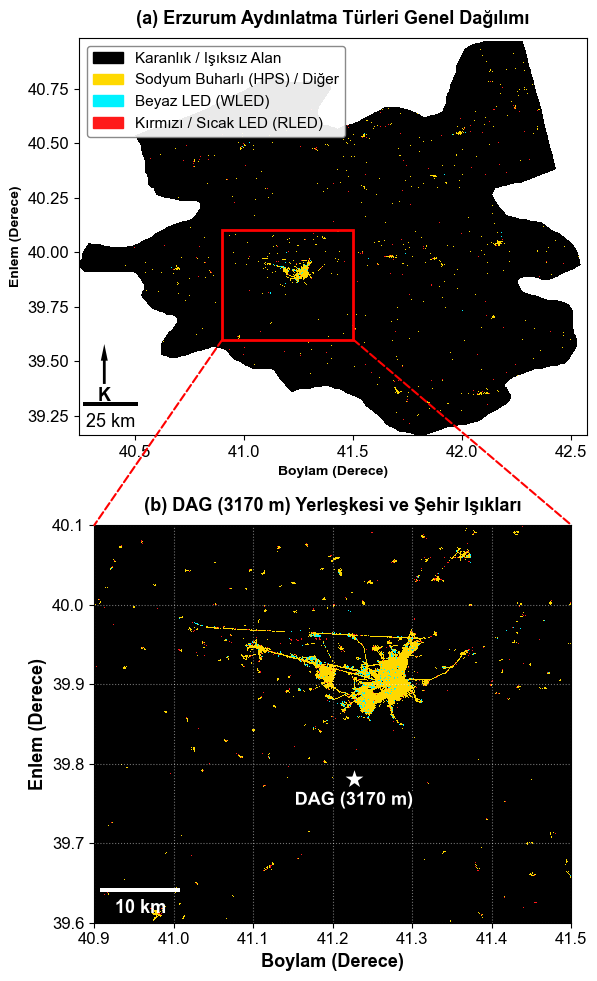

-> Başarılı! Harita kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_04_Erzurum_lamba_siniflandirma_zoom.png

TÜM İLLER İÇİN AYDINLATMA SINIFLANDIRMASI VE HARİTALAR TAMAMLANDI!
Çıktı Klasörü: C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer


In [1]:

"""SDGSAT-1 Glimmer Kentsel Aydınlatmanın Spektral Sınıflandırması
----------------------------------------------------------------------------------
Bu script;
1. 3 bantlı (Kırmızı, Yeşil, Mavi) Glimmer radyans GeoTIFF görüntüsünü okur.
2. Gri tonlama parlaklık formülü ile aydınlık/karanlık alanları dinamik eşikler:
   L_total = (0.2989 * R) + (0.5870 * G) + (0.1140 * B)
   Eşik (T) = Ortalama + (0.5 * Standart Sapma)
3. Aydınlatılmış piksellerde Mavi/Yeşil ve Kırmızı/Yeşil oranlarını analiz ederek:
   - Sodyum Buharlı / Konvansiyonel Lambalar (HPS)
   - Beyaz LED (WLED: B/G > 0.57)
   - Kırmızı / Sıcak LED (RLED: R/G > 9.0) sınıflarını belirler.
4. Sınıflandırılmış tematik katmanı LZW sıkıştırmalı tek bantlı GeoTIFF (.tif) olarak kaydeder.
5. İki panelli yüksek çözünürlüklü harita üretir:
   - Üst Panel: İl geneli sınıflandırma haritası
   - Alt Panel: Gözlemevi (TUG/DAG) ve şehir merkezini gösteren bağlantılı yakınlaştırma (zoom) paneli.
"""

# Gerekli modülleri içe aktarıyoruz
import glob
import os
import warnings
import matplotlib.patches as mpatches
from matplotlib.patches import ConnectionPatch, Rectangle
import matplotlib.patheffects as pe
import matplotlib.pyplot as plt
from matplotlib_scalebar.scalebar import ScaleBar
import numpy as np
import rasterio
# Uyarıları kapatıyoruz
warnings.filterwarnings('ignore')

# =============================================================================
# GLOBAL GRAFİK VE YAZI TİPİ AYARLARI
# =============================================================================
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans', 'Liberation Sans', 'Helvetica', 'sans-serif'],
    'mathtext.fontset': 'dejavusans',
    'mathtext.default': 'regular',
    'font.size': 13,
    'axes.labelsize': 13,
    'axes.titlesize': 13,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 11,
    'figure.titlesize': 15,
})

# =============================================================================
# SINIFLANDIRMA VE HARİTA ÜRETİM FONKSİYONU
# =============================================================================
def classify_and_map_city_lighting(
    input_path, output_png, city_name, zoom_bbox, obs_coords, obs_name
):
    """Belirtilen şehir için Glimmer verilerini spektral olarak sınıflandırır,
    GeoTIFF ve 2 panelli zoom haritası olarak kaydeder.
    """
    print(f"\n{'='*75}")
    print(f'>>> [{city_name.upper()}] AYDINLATMA SINIFLANDIRMASI VE HARİTALANDIRMA BAŞLATILIYOR')
    print(f"{'='*75}")

    if not os.path.exists(input_path):
        print(f'[HATA] Girdi dosyası bulunamadı -> {input_path}')
        return

    try:
        # ---------------------------------------------------------------------
        # A) RASTER VERİSİNİN OKUNMASI VE METADATA ALINMASI
        # ---------------------------------------------------------------------
        with rasterio.open(input_path) as src:
            meta = src.meta.copy()
            bounds = src.bounds
            # Harita sınırları [Min_Boylam, Max_Boylam, Min_Enlem, Max_Enlem]
            extent = [bounds.left, bounds.right, bounds.bottom, bounds.top]

            # Bantları float32 olarak oku
            red = src.read(1).astype(np.float32)
            green = src.read(2).astype(np.float32)
            blue = src.read(3).astype(np.float32)

            # Sınır dışı NoData maskesi (Tüm bantların sıfır olduğu alanlar)
            nodata_mask = (red == 0) & (green == 0) & (blue == 0)

            # -----------------------------------------------------------------
            # B) AYDINLIK / KARANLIK EŞİKLEME (Dinamik İstatistiksel Eşik)
            # -----------------------------------------------------------------
            # Standart NTSC parlaklık (Luminance) formülü
            brightness = (0.2989 * red) + (0.5870 * green) + (0.1140 * blue)

            # Sadece il sınırı içindeki geçerli pikseller
            valid_pixels = brightness[~nodata_mask]
            if valid_pixels.size == 0:
                print(f'[HATA] {city_name} için geçerli veri pikseli bulunamadı!')
                return

            # Dinamik Eşik: Ortalama + (0.5 * Standart Sapma)
            threshold = np.mean(valid_pixels) + (0.5 * np.std(valid_pixels))
            threshold = max(threshold, 0.05)
            print(f'-> Hesaplanan Aydınlatma Eşiği (T): {threshold:.4f} nW/(cm²·sr)')

            # -----------------------------------------------------------------
            # C) HİYERARŞİK SPEKTRAL SINIFLANDIRMA (HPS, WLED, RLED)
            # -----------------------------------------------------------------
            # 0: Sınır Dışı, 1: Karanlık Alan, 2: HPS, 3: WLED, 4: RLED
            classified = np.zeros_like(brightness, dtype=np.uint8)
            classified[~nodata_mask] = 1

            # Eşik değerini geçen aydınlatılmış pikseller
            light_mask = (brightness > threshold) & (~nodata_mask)
            classified[light_mask] = 2  # Varsayılan: HPS

            # Sıfıra bölme hatalarını engellemek için epsilon
            np.seterr(divide='ignore', invalid='ignore')
            epsilon = 1e-9
            bg = blue / (green + epsilon)  # Mavi / Yeşil Oranı
            rg = red / (green + epsilon)  # Kırmızı / Yeşil Oranı

            # Mavi bileşeni yüksek olan modern beyaz LED'ler (B/G > 0.57)
            classified[(bg > 0.57) & light_mask] = 3

            # Kırmızı bileşeni aşırı baskın olan özel/dekoratif LED'ler (R/G > 9.0)
            classified[(rg > 9.0) & light_mask] = 4
            np.seterr(all='warn')

            # Alan İstatistikleri Özeti
            total_lit = np.sum(light_mask)
            wled_cnt = np.sum(classified == 3)
            hps_cnt = np.sum(classified == 2)
            rled_cnt = np.sum(classified == 4)
            print(f'-> Toplam Aydınlatılmış Piksel Sayısı : {total_lit:,}')
            print(f'   - Beyaz LED (WLED)                 : {wled_cnt:,} ({(wled_cnt/total_lit)*100:.2f}%)')
            print(f'   - Sodyum Buharlı (HPS / Diğer)     : {hps_cnt:,} ({(hps_cnt/total_lit)*100:.2f}%)')
            print(f'   - Kırmızı / Sıcak LED (RLED)       : {rled_cnt:,} ({(rled_cnt/total_lit)*100:.2f}%)')

            # -----------------------------------------------------------------
            # D) SINIFLANDIRILMIŞ GEOTIFF DOSYASININ DİSKE YAZILMASI
            # -----------------------------------------------------------------
            output_tif = output_png.replace('.png', '.tif')
            meta.update({
                'driver': 'GTiff',
                'count': 1,
                'dtype': 'uint8',
                'compress': 'lzw',
                'nodata': 0,
            })
            with rasterio.open(output_tif, 'w', **meta) as dst:
                dst.write(classified, 1)
            print(f'-> Sınıflandırılmış GeoTIFF kaydedildi:\n   {output_tif}')

            # -----------------------------------------------------------------
            # E) GÖRSELLEŞTİRME İÇİN RGBA RENK DİZİSİ OLUŞTURMA
            # -----------------------------------------------------------------
            rgba = np.zeros((src.height, src.width, 4), dtype=np.float32)

            c_white = [1.0, 1.0, 1.0]  # 0: Sınır Dışı (Beyaz)
            c_black = [0.0, 0.0, 0.0]  # 1: Karanlık Alanlar (Siyah)
            c_hps = [1.0, 0.85, 0.0]  # 2: HPS / Sodyum (Altın Sarısı / Turuncu)
            c_wled = [0.0, 0.95, 1.0]  # 3: Beyaz LED (Cyan)
            c_rled = [1.0, 0.10, 0.1]  # 4: Kırmızı LED (Kırmızı)

            rgba[classified == 0, :3] = c_white
            rgba[classified == 0, 3] = 1.0
            rgba[classified == 1, :3] = c_black
            rgba[classified == 1, 3] = 1.0
            rgba[classified == 2, :3] = c_hps
            rgba[classified == 2, 3] = 1.0
            rgba[classified == 3, :3] = c_wled
            rgba[classified == 3, 3] = 1.0
            rgba[classified == 4, :3] = c_rled
            rgba[classified == 4, 3] = 1.0

            # -----------------------------------------------------------------
            # F) 2 PANELLİ ÇİFT HARİTA ÇİZİMİ (Genel Görünüm + Zoom Odak Paneli)
            # -----------------------------------------------------------------
            fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(10, 10), facecolor='white')

            # === PANEL 1: İL GENEL GÖRÜNÜMÜ ===
            ax1.imshow(rgba, extent=extent, interpolation='none', origin='upper')
            ax1.set_title(f'(a) {city_name} Aydınlatma Türleri Genel Dağılımı', fontweight='bold', pad=10)
            ax1.set_xlabel('Boylam (Derece)', fontsize=10, fontweight='bold')
            ax1.set_ylabel('Enlem (Derece)', fontsize=10, fontweight='bold')

            # Zoom Alanı Çerçevesi (Kırmızı Kutu)
            z_min_lon, z_min_lat, z_max_lon, z_max_lat = zoom_bbox
            rect_w = z_max_lon - z_min_lon
            rect_h = z_max_lat - z_min_lat
            rect = Rectangle((z_min_lon, z_min_lat), rect_w, rect_h, linewidth=2.0, edgecolor='red', facecolor='none',zorder=10)
            ax1.add_patch(rect)

            # Lejant
            patches = [
                mpatches.Patch(color=c_black, label='Karanlık / Işıksız Alan'),
                mpatches.Patch(color=c_hps, label='Sodyum Buharlı (HPS) / Diğer'),
                mpatches.Patch(color=c_wled, label='Beyaz LED (WLED)'),
                mpatches.Patch(color=c_rled, label='Kırmızı / Sıcak LED (RLED)')
            ]
            ax1.legend(handles=patches, loc='upper left', frameon=True, framealpha=0.92, edgecolor='gray')

            # Ölçek Çubuğu ve Kuzey Oku (Üst Panel)
            if city_name == 'Antalya':
                ax1.annotate('K', xy=(0.95, 0.90), xytext=(0.95, 0.77), color='black',
                             arrowprops=dict(facecolor='black', edgecolor='none', width=2.0, headwidth=5.0),
                             ha='center', va='center', xycoords=ax1.transAxes, fontweight='bold')

                scalebar1 = ScaleBar(100, 'km', location='upper right', pad=0.15, border_pad=0.15, color='black', box_color='none')

            elif city_name == 'Erzurum':
                ax1.annotate('K', xy=(0.05, 0.23), xytext=(0.05, 0.1), color='black',
                             arrowprops=dict(facecolor='black', edgecolor='none', width=2.0, headwidth=5.0),
                             ha='center', va='center', xycoords=ax1.transAxes, fontweight='bold')

                scalebar1 = ScaleBar(100, 'km', location='lower left', pad=0.15, border_pad=0.15, color='black', box_color='none')

            ax1.add_artist(scalebar1)

            # === PANEL 2: GÖZLEMEVİ VE ŞEHİR MERKEZİ ZOOM PANELİ ===
            ax2.imshow(rgba, extent=extent, interpolation='none', origin='upper')
            ax2.set_xlim(z_min_lon, z_max_lon)
            ax2.set_ylim(z_min_lat, z_max_lat)
            ax2.set_title(f'(b) {obs_name} Yerleşkesi ve Şehir Işıkları', fontweight='bold', pad=10)
            ax2.set_xlabel('Boylam (Derece)', fontweight='bold')
            ax2.set_ylabel('Enlem (Derece)', fontweight='bold')
            ax2.grid(True, linestyle=':', alpha=0.45, color='white')
            
            # Gözlemevi Konumu (Yıldız ve Konturlu Yazı)
            obs_lat, obs_lon = obs_coords
            ax2.scatter(obs_lon, obs_lat, s=300, c='white', marker='*', edgecolors='black', linewidth=1.2, zorder=20)
            ax2.text(obs_lon, obs_lat - 0.015, f'{obs_name}', color='white', fontweight='bold',
                     ha='center', va='top', path_effects=[pe.withStroke(linewidth=3.5, foreground='black')])

            # Ölçek Çubuğu (Alt Panel)
            scalebar2 = ScaleBar(100, 'km', location='lower left', pad=0.2, border_pad=0.2, color='white', box_color='none', font_properties={'weight': 'bold'})
            ax2.add_artist(scalebar2)

            # === İKİ PANEL ARASI BAĞLANTI ÇİZGİLERİ ===
            con1 = ConnectionPatch(xyA=(z_min_lon, z_min_lat), xyB=(0, 1),
                                   coordsA='data', coordsB='axes fraction',
                                   axesA=ax1, axesB=ax2, color='red', linestyle='--', linewidth=1.5)
            con2 = ConnectionPatch(xyA=(z_max_lon, z_min_lat), xyB=(1, 1),
                                   coordsA='data', coordsB='axes fraction',
                                   axesA=ax1, axesB=ax2, color='red', linestyle='--', linewidth=1.5)
            fig.add_artist(con1)
            fig.add_artist(con2)

            # -----------------------------------------------------------------
            # G) ÇIKTI GRAFİĞİNİ KAYDETME
            # -----------------------------------------------------------------
            plt.tight_layout()
            plt.savefig(output_png, dpi=500, bbox_inches='tight', facecolor='white')
            plt.show()
            plt.close(fig)  # Bellek temizliği
            print(f'-> Başarılı! Harita kaydedildi:\n   {output_png}')

    except Exception as e:
        import traceback

        traceback.print_exc()
        print(f'[{city_name}] İşlem Hatası: {e}')

# =============================================================================
# ÇALIŞTIRMA BLOĞU (ANTALYA VE ERZURUM)
# =============================================================================
if __name__ == '__main__':
    # AYARLAR VE DİZİNLER (İşletim Sistemine Göre Otomatik Yol Yönetimi)
    if os.name == 'nt':  # Windows
        base_dir = r'E:\=PROJELER\=TUBITAK_3501_2024'
        target_output_dir = r'C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer'
    else:  # Linux / macOS
        base_dir = os.path.expanduser('~/=PROJELER/=TUBITAK_3501_2024')
        target_output_dir = os.path.expanduser('~/ATASAM/=3501_2024/==notebooks/=cikti/glimmer')

    os.makedirs(target_output_dir, exist_ok=True)
    glimmer_base_dir = os.path.join(base_dir, 'veri', 'uydu', 'glimmer', '=03_radiance')

    tasks = [
        {
            'name': 'Antalya',
            'glimmer_folder': os.path.join(glimmer_base_dir, '20250926_Antalya'),
            'obs_name': 'TUG (2500 m)',
            'obs_coords': (36.824305, 30.335311),  # (Enlem, Boylam)
            'zoom_bbox': [30.10, 36.70, 30.90, 37.20],  # [Min_Lon, Min_Lat, Max_Lon, Max_Lat]
        },
        {
            'name': 'Erzurum',
            'glimmer_folder': os.path.join(glimmer_base_dir, '20250912_Erzurum'),
            'obs_name': 'DAG (3170 m)',
            'obs_coords': (39.780950, 41.226446),  # (Enlem, Boylam)
            'zoom_bbox': [40.90, 39.60, 41.50, 40.10],  # [Min_Lon, Min_Lat, Max_Lon, Max_Lat]
        },
    ]

    for task in tasks:
        candidates = glob.glob(os.path.join(task['glimmer_folder'], '*_MERGED_CLIPPED.tif'))
        if not candidates:
            candidates = glob.glob(os.path.join(task['glimmer_folder'], '*.tif'))
            
        if candidates:
            input_raster = candidates[0]
            output_png = os.path.join(target_output_dir, f"SONUC_RAPORU_GIU_04_{task['name']}_lamba_siniflandirma_zoom.png")

            classify_and_map_city_lighting(
                input_path=input_raster,
                output_png=output_png,
                city_name=task['name'],
                zoom_bbox=task['zoom_bbox'],
                obs_coords=task['obs_coords'],
                obs_name=task['obs_name'],
            )
        else:
            print(f"\n[UYARI] [{task['name']}] için uygun raster dosyası bulunamadı -> {task['glimmer_folder']}")

    print(f"\n{'='*75}")
    print('TÜM İLLER İÇİN AYDINLATMA SINIFLANDIRMASI VE HARİTALAR TAMAMLANDI!')
    print(f'Çıktı Klasörü: {target_output_dir}')
    print(f"{'='*75}")



## **7.3.1 Astronomik Gözlemevleri Çevresinde Mekânsal Tampon (Buffer) Analizi ve Mesafeye Bağlı Işık Dağılımı**

- Sınıflandırılan kentsel aydınlatma verilerinin astronomik gözlem kalitesi üzerindeki etkisini sadece toplam alan bazında değil, gözlemevlerine olan mekânsal mesafe ve yönelim bağlamında da değerlendirmek gerekmektedir. Şehir merkezlerinden gökyüzüne yayılan yapay ışık kubbeleri, mesafenin karesiyle ters orantılı olarak azalsa da kısa dalga boylu mavi ışıkların atmosferik saçılımı onlarca kilometre ötedeki gözlemevi zenitini dahi aydınlatabilmektedir.

- Bu doğrultuda, TUG (Bakırlıtepe, 2500 m) ve DAG (Karakaya Tepesi, 3170 m) yerleşkeleri merkez alınarak, ışık kirliliğinin gözlemevlerine olan mesafeye bağlı kademeli baskısını modellemek amacıyla üç eş merkezli mekânsal tampon bölge kurgulanmıştır:

  1. 0 – 10 km (Çekirdek Koruma Alanı): Gözlemevinin doğrudan optik görüş alanı içinde kalan, her türlü yapay aydınlatmadan mutlak suretle arındırılması gereken en kritik yakın çevredir.

  2. 10 – 25 km (Orta Mesafe Geçiş Kuşağı): Kırsal yerleşimlerin, dağ tesislerinin (Saklıkent, Konaklı) ve tali ulaşım yollarının yer aldığı; yerel ışık sızıntılarının gözlem ufkunu doğrudan etkilediği ara geçiş bölgesidir.
 
  3. 25 – 50 km (Bölgesel Işık Kubbesi Etki Alanı): Antalya ve Erzurum şehir merkezlerinin, sanayi bölgelerinin ve yoğun kıyı turizm koridorlarının bulunduğu, bölgesel yapay gök parlaklığını besleyen ana emisyon kaynağı kuşağıdır.



>>> [TUG (ANTALYA - 2500 M)] MEKÂNSAL TAMPON BÖLGE ANALİZİ BAŞLATILIYOR
  -> 0–10 km tampon halkası tamamlandı. (Toplam Alan: 314.88 km²)
  -> 10–25 km tampon halkası tamamlandı. (Toplam Alan: 1,653.03 km²)
  -> 25–50 km tampon halkası tamamlandı. (Toplam Alan: 5,903.77 km²)

>>> [DAG (ERZURUM - 3170 M)] MEKÂNSAL TAMPON BÖLGE ANALİZİ BAŞLATILIYOR
  -> 0–10 km tampon halkası tamamlandı. (Toplam Alan: 314.84 km²)
  -> 10–25 km tampon halkası tamamlandı. (Toplam Alan: 1,653.1 km²)
  -> 25–50 km tampon halkası tamamlandı. (Toplam Alan: 5,903.86 km²)

-> Detaylı CSV İstatistik Tablosu Kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_05_tampon_analizi_istatistikleri.csv

=== MEKÂNSAL TAMPON BÖLGE ÖZET TABLOSU ===
             Gözlemevi Tampon Kuşağı  Toplam Kuşak Alanı (km²)  Karanlık / Işıksız Alanı (km²)  Sodyum Buharlı (HPS) / Diğer Alanı (km²)  Beyaz LED (WLED) Alanı (km²)  Kırmızı / Sıcak LED (RLED) Alanı (km²)
TUG (Antalya - 2500 m)  

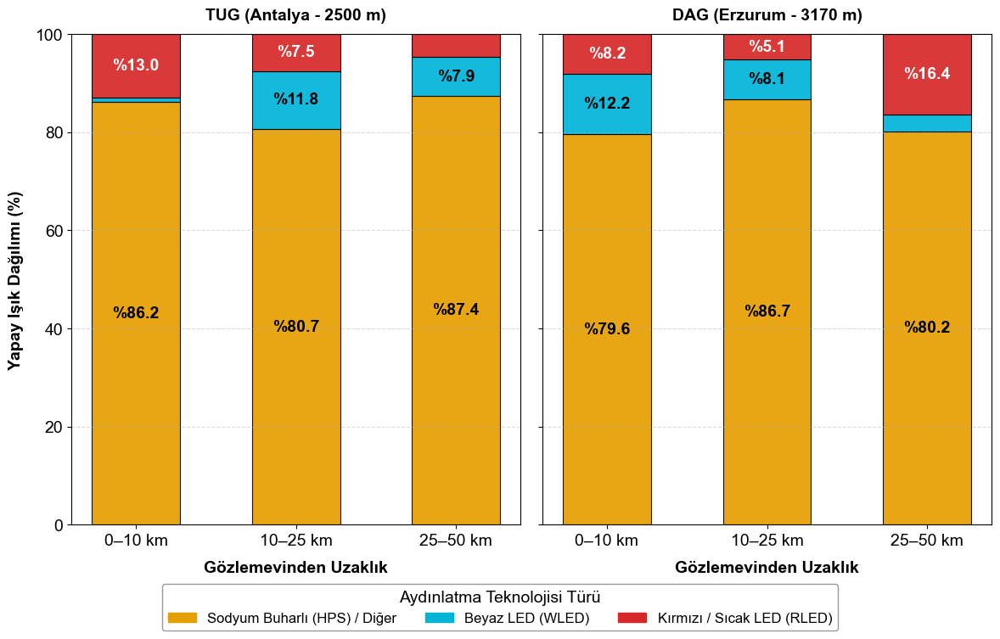

-> Başarılı! Karşılaştırma grafiği kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_05_tampon_analizi_grafigi.png

TÜM GÖZLEMEVLERİ İÇİN TAMPON BÖLGE ANALİZİ TAMAMLANDI!
Çıktı Dizini: C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer


In [1]:

"""SDGSAT-1 Glimmer Mekânsal Tampon Analizi (Spatial Buffer Analysis)
------------------------------------------------------------------
Bu script;
1. TUG (Antalya) ve DAG (Erzurum) gözlemevi yerleşkelerini merkez alarak 3 eş merkezli
   tampon bölge oluşturur:
   - 0–10 km  : Çekirdek Koruma Alanı
   - 10–25 km : Orta Mesafe Geçiş Kuşağı
   - 25–50 km : Bölgesel Işık Kubbesi Etki Alanı
2. Her bir tampon halkası içinde kalan aydınlatma teknolojilerini (HPS, WLED, RLED)
   ve karanlık alanları Haversine küresel mesafe formülü ile hesaplar.
3. Mesafeye bağlı yapay ışık kompozisyonundaki spektral değişimi analiz eder.
4. Sonuçları detaylı bir CSV tablosu ve bar grafik olarak kaydeder.
"""

# Gerekli modülleri içe aktarıyoruz
import glob
import os
import warnings
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio
# Uyarıları kapatıyoruz
warnings.filterwarnings('ignore')

# =============================================================================
# 2. GLOBAL GRAFİK VE YAZI TİPİ AYARLARI
# =============================================================================
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans', 'Liberation Sans', 'Helvetica', 'sans-serif'],
    'mathtext.fontset': 'dejavusans',
    'mathtext.default': 'regular',
    'font.size': 14,
    'axes.labelsize': 14,
    'axes.titlesize': 14,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 12,
    'figure.titlesize': 16,
})

# =============================================================================
# 3. SABİTLER VE TANIMLAMALAR
# =============================================================================
# İncelenecek Eş Merkezli Tampon Halkaları (Mesafe Dilimleri - km)
BUFFER_ZONES = [
    (0, 10),  # 0-10 km: Çekirdek Koruma Alanı
    (10, 25),  # 10-25 km: Orta Kuşak
    (25, 50),  # 25-50 km: Bölgesel Etki Alanı
]

# Sınıf İsimleri ve Renkleri (Sınıflandırma haritasıyla birebir uyumlu)
CLASS_INFO = {
    1: {'name': 'Karanlık / Işıksız', 'color': '#000000'},
    2: {'name': 'Sodyum Buharlı (HPS) / Diğer', 'color': '#E69F00'},  # Altın Sarısı / Amber
    3: {'name': 'Beyaz LED (WLED)', 'color': '#00B4D8'},              # Cyan / Mavi
    4: {'name': 'Kırmızı / Sıcak LED (RLED)', 'color': '#D62828'}     # Kırmızı
}

# =============================================================================
# 4. YARDIMCI MATEMATİKSEL VE COĞRAFİ FONKSİYONLAR
# =============================================================================
def haversine_distance_matrix(lat_grid, lon_grid, center_lat, center_lon):
    """Küre üzerindeki iki nokta arasındaki büyük daire mesafesini (Haversine formülü)
    kullanarak gözlemevinden tüm piksellere olan mesafeyi (km) hesaplar.
    """
    R = 6371.0  # Dünya'nın ortalama yarıçapı (km)
    dlat = np.radians(lat_grid - center_lat)
    dlon = np.radians(lon_grid - center_lon)

    a = (np.sin(dlat / 2.0) ** 2 + np.cos(np.radians(center_lat)) * np.cos(np.radians(lat_grid)) * np.sin(dlon / 2.0) ** 2)
    c = 2.0 * np.arctan2(np.sqrt(a), np.sqrt(1.0 - a))
    return R * c

def calculate_pixel_area_km2(transform, center_lat):
    """WGS84 (EPSG:4326) koordinat sisteminde enleme bağlı olarak daralan meridyen
    açıklığını düzelterek tek bir pikselin gerçek yüzölçümünü (km²) hesaplar.
    """
    res_x_deg = transform.a
    res_y_deg = abs(transform.e)
    lat_rad = np.radians(center_lat)

    # 1 derece enlem ~ 111.32 km, 1 derece boylam ~ 111.32 * cos(enlem) km
    pixel_width_km = res_x_deg * 111.32 * np.cos(lat_rad)
    pixel_height_km = res_y_deg * 111.32
    return pixel_width_km * pixel_height_km

# =============================================================================
# 5. TAMPON ANALİZİ HESAPLAMA FONKSİYONU
# =============================================================================
def analyze_observatory_buffers(obs_name, data_info):
    """Belirtilen gözlemevi için sınıflandırılmış GeoTIFF katmanını okur,
    0-10, 10-25 ve 25-50 km halkalarındaki lamba alanı istatistiklerini hesaplar.
    """
    print(f"\n{'='*70}")
    print(f'>>> [{obs_name.upper()}] MEKÂNSAL TAMPON BÖLGE ANALİZİ BAŞLATILIYOR')
    print(f"{'='*70}")

    tif_path = data_info['tif']
    center_lat, center_lon = data_info['coords']

    if not os.path.exists(tif_path):
        print(f'[HATA] Sınıflandırılmış GeoTIFF bulunamadı: {tif_path}')
        return []

    results = []

    with rasterio.open(tif_path) as src:
        transform = src.transform
        width = src.width
        height = src.height

        # Piksel koordinat gridinin üretilmesi
        cols, rows = np.meshgrid(np.arange(width, dtype=np.float32), np.arange(height, dtype=np.float32))
        lon_grid = transform.c + (cols * transform.a) + (rows * transform.b)
        lat_grid = transform.f + (cols * transform.d) + (rows * transform.e)

        # Bellek optimizasyonu için düzleştirilmiş (1D) dizilere dönüştürme
        data_flat = src.read(1).flatten()
        lat_flat = lat_grid.flatten()
        lon_flat = lon_grid.flatten()

        # Kullanılmayan büyük 2D matrisleri bellekten temizle
        del cols, rows, lat_grid, lon_grid

        # Gözlemevinden her piksele olan mesafelerin ve piksel alanının hesaplanması
        dist_matrix = haversine_distance_matrix(lat_flat, lon_flat, center_lat, center_lon)
        px_area = calculate_pixel_area_km2(transform, center_lat)

        # Her bir mesafe halkası için istatistikleri topla
        for min_r, max_r in BUFFER_ZONES:
            zone_label = f'{min_r}–{max_r} km'

            # İlgili mesafe halkası içindeki pikselleri maskele
            mask = (dist_matrix > min_r) & (dist_matrix <= max_r)
            zone_pixels = data_flat[mask]

            if zone_pixels.size == 0:
                continue

            unique, counts = np.unique(zone_pixels, return_counts=True)
            stats = dict(zip(unique, counts))
            total_area_in_zone = round(zone_pixels.size * px_area, 2)

            zone_stats = {
                'Gözlemevi': obs_name,
                'Tampon Kuşağı': zone_label,
                'Toplam Kuşak Alanı (km²)': total_area_in_zone,
            }

            # Her aydınlatma sınıfının alanını (km²) ekle
            for cls_id, cls_data in CLASS_INFO.items():
                count = stats.get(cls_id, 0)
                area = count * px_area
                zone_stats[f"{cls_data['name']} Alanı (km²)"] = round(area, 4)

            results.append(zone_stats)
            print(f'  -> {zone_label} tampon halkası tamamlandı. (Toplam Alan: {total_area_in_zone:,} km²)')

    return results

# =============================================================================
# 6. GRAFİK ÇİZİM FONKSİYONU
# =============================================================================
def plot_buffer_analysis_turkish(df, output_path):
    """Her iki gözlemevi için mesafeye bağlı lamba kompozisyonunu
    yan yana 1x2 bar grafik (stacked bar) olarak çizer.
    """
    plot_data = df.copy()

    # Sadece aydınlatılmış (Lit) toplam alanı hesapla
    plot_data['Toplam Işıklı Alan'] = (
        plot_data['Sodyum Buharlı (HPS) / Diğer Alanı (km²)']
        + plot_data['Beyaz LED (WLED) Alanı (km²)']
        + plot_data['Kırmızı / Sıcak LED (RLED) Alanı (km²)']
    )

    # Aydınlatılmış alan içindeki teknoloji yüzdelerini hesapla
    for cls_name in ['Sodyum Buharlı (HPS) / Diğer', 'Beyaz LED (WLED)', 'Kırmızı / Sıcak LED (RLED)']:
        col_name = f'{cls_name} Alanı (km²)'
        plot_data[f'{cls_name} (%)'] = (plot_data[col_name] / plot_data['Toplam Işıklı Alan']) * 100
        plot_data[f'{cls_name} (%)'] = plot_data[f'{cls_name} (%)'].fillna(0)

    # 1x2 Alt Grafik Alanı Oluştur
    fig, axes = plt.subplots(1, 2, figsize=(12, 7), sharey=True, facecolor='white')

    obs_list = plot_data['Gözlemevi'].unique()
    zones = plot_data['Tampon Kuşağı'].unique()
    bar_width = 0.55

    # Lejant Elemanları
    legend_patches = [
        mpatches.Patch(color=CLASS_INFO[2]['color'], label='Sodyum Buharlı (HPS) / Diğer'),
        mpatches.Patch(color=CLASS_INFO[3]['color'], label='Beyaz LED (WLED)'),
        mpatches.Patch(color=CLASS_INFO[4]['color'], label='Kırmızı / Sıcak LED (RLED)')
    ]

    for idx, obs in enumerate(obs_list):
        ax = axes[idx]
        subset = plot_data[plot_data['Gözlemevi'] == obs]
        bottom = np.zeros(len(zones))

        for cls_name in ['Sodyum Buharlı (HPS) / Diğer', 'Beyaz LED (WLED)', 'Kırmızı / Sıcak LED (RLED)']:
            cls_key = [k for k, v in CLASS_INFO.items() if v['name'] == cls_name][0]
            color = CLASS_INFO[cls_key]['color']
            values = subset[f'{cls_name} (%)'].values

            # Yığılmış çubukları ekle
            rects = ax.bar(zones, values, bar_width, bottom=bottom, color=color, edgecolor='black', linewidth=0.8, alpha=0.92)

            # %5'nın üzerindeki dilimlerin üzerine oranını yaz
            for r, val, b in zip(rects, values, bottom):
                if val >= 5.0:
                    text_color = 'white' if color == '#D62828' else 'black'
                    ax.text(r.get_x() + r.get_width() / 2.0, b + val / 2.0, f'%{val:.1f}',
                            ha='center', va='center', color=text_color, fontweight='bold', fontsize=14)
            bottom += values

        ax.set_title(f'{obs}', fontweight='bold', pad=12)
        ax.set_xlabel('Gözlemevinden Uzaklık', fontweight='bold', labelpad=10)
        ax.set_ylim(0, 100)
        ax.grid(axis='y', linestyle='--', alpha=0.45)

        # Sadece ilk (sol) grafiğe Y ekseni etiketi ekle
        if idx == 0:
            ax.set_ylabel('Yapay Işık Dağılımı (%)', fontweight='bold', labelpad=10)

    # Ortak Alt Lejant
    fig.legend(
        handles=legend_patches,
        loc='lower center',
        bbox_to_anchor=(0.5, -0.09),
        ncol=3,
        title='Aydınlatma Teknolojisi Türü',
        title_fontsize=14,
        fontsize=12,
        frameon=True,
        facecolor='white',
        edgecolor='gray',
    )

    plt.tight_layout()
    plt.subplots_adjust(bottom=0.1)

    plt.savefig(output_path, dpi=500, bbox_inches='tight', facecolor='white')
    plt.show()
    plt.close(fig)
    print(f'-> Başarılı! Karşılaştırma grafiği kaydedildi:\n   {output_path}')

# =============================================================================
# 7. ÇALIŞTIRMA BLOĞU (ANTALYA VE ERZURUM)
# =============================================================================
if __name__ == '__main__':
    # İşletim sistemine göre dizin tespiti
    if os.name == 'nt':  # Windows
        base_dir = r'E:\=PROJELER\=TUBITAK_3501_2024'
        target_output_dir = r'C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer'
    else:  # Linux / macOS
        base_dir = os.path.expanduser('~/=PROJELER/=TUBITAK_3501_2024')
        target_output_dir = os.path.expanduser('~/ATASAM/=3501_2024/==notebooks/=cikti/glimmer')

    os.makedirs(target_output_dir, exist_ok=True)

    # Sınıflandırılmış GeoTIFF yolları
    ant_tif = os.path.join(target_output_dir, 'SONUC_RAPORU_GIU_04_Antalya_lamba_siniflandirma_zoom.tif')
    erz_tif = os.path.join(target_output_dir, 'SONUC_RAPORU_GIU_04_Erzurum_lamba_siniflandirma_zoom.tif')
    
    observatories = {
        'TUG (Antalya - 2500 m)': {
            'coords': (36.824305, 30.335311),  # (Enlem, Boylam)
            'tif': ant_tif,
        },
        'DAG (Erzurum - 3170 m)': {
            'coords': (39.780950, 41.226446),  # (Enlem, Boylam)
            'tif': erz_tif,
        },
    }

    all_results = []

    for obs_name, info in observatories.items():
        res = analyze_observatory_buffers(obs_name, info)
        all_results.extend(res)

    if all_results:
        df_results = pd.DataFrame(all_results)

        # 1. Detaylı İstatistik Tablosunu CSV Olarak Kaydet
        csv_out = os.path.join(target_output_dir, 'SONUC_RAPORU_GIU_05_tampon_analizi_istatistikleri.csv')
        df_results.to_csv(csv_out, index=False, encoding='utf-8-sig')
        print(f'\n-> Detaylı CSV İstatistik Tablosu Kaydedildi:\n   {csv_out}')

        # 2. Konsola Özeti Yazdır
        print('\n=== MEKÂNSAL TAMPON BÖLGE ÖZET TABLOSU ===')
        print(df_results.to_string(index=False))

        # 3. Grafiği Çiz ve Kaydet
        png_out = os.path.join(target_output_dir, 'SONUC_RAPORU_GIU_05_tampon_analizi_grafigi.png')
        plot_buffer_analysis_turkish(df_results, png_out)

    print(f"\n{'='*70}")
    print('TÜM GÖZLEMEVLERİ İÇİN TAMPON BÖLGE ANALİZİ TAMAMLANDI!')
    print(f'Çıktı Dizini: {target_output_dir}')
    print(f"{'='*70}")



## **7.4 SDGSAT-1 Glimmer ile Atmosferik Saçılma Riski ve Gözlemevi Tehdit Modellemesi**

- Astronomik gözlemevlerinin gökyüzü kalitesi, yalnızca yerleşkeye ulaşan doğrudan ışık miktarıyla değil; onlarca kilometre uzaktaki şehirlerden atmosfere yayılan ve havada saçılan yapay ışık kubbeleriyle bozulmaktadır.

- Bu saçılma mekanizması iki temel fiziksel kurala dayanır:

  1. Ters Kare Yasası ($1/d^2$): Bir ışık kaynağının gözlemevine olan mesafesi (d) arttıkça, oluşturduğu aydınlatma etkisi mesafenin karesiyle ters orantılı olarak azalır.

  2. Rayleigh Saçılma Yasası ($λ^{-4}$): Işığın atmosferdeki hava molekülleri tarafından saçılma şiddeti, dalga boyunun dördüncü kuvvetiyle ters orantılıdır. Bu durum; kısa dalga boylu mavi ışıkların ($~400-500$ nm), uzun dalga boylu sarı/kırmızı ışıklara ($~580–700$ nm) kıyasla atmosferde $3-4$ kat daha fazla saçılmasına yol açar.
 
- Modern şehirlerde geleneksel sarı renkli sodyum buharlı (HPS) lambalardan, mavi dalga boyu açısından zengin Beyaz LED'lere (WLED) geçiş; toplam ışık akısı aynı kalsa dahi gözlemevleri üzerindeki yapay gökyüzü parlaklığını çarpan etkisiyle artırmaktadır.



>>> [ANTALYA] ATMOSFERİK SAÇILMA RİSKİ ANALİZİ BAŞLATILIYOR
-> Glimmer Dosyası : KX10_GIU_20250926_E31.53_N37.30_202500100669_L4A_A_RGB_EPSG4326_RADIANCE_MERGED_CLIPPED.tif
-> Hedef Gözlemevi : TUG (Rakım: 2500 m)
-> [Antalya] Toplam Kümülatif Saçılma Risk Skoru: 55,786.93


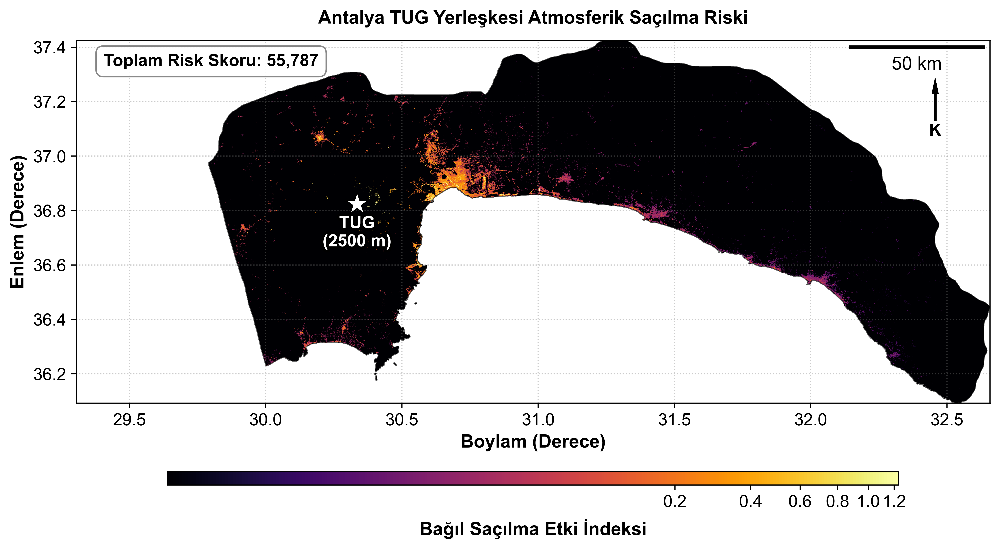

-> Başarılı! Harita kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_06_sacilma_riski_Antalya.png

>>> [ERZURUM] ATMOSFERİK SAÇILMA RİSKİ ANALİZİ BAŞLATILIYOR
-> Glimmer Dosyası : KX10_GIU_20250912_E40.29_N41.18_202500096198_L4A_A_RGB_EPSG4326_RADIANCE_MERGED_CLIPPED.tif
-> Hedef Gözlemevi : DAG (Rakım: 3170 m)
-> [Erzurum] Toplam Kümülatif Saçılma Risk Skoru: 74,168.16


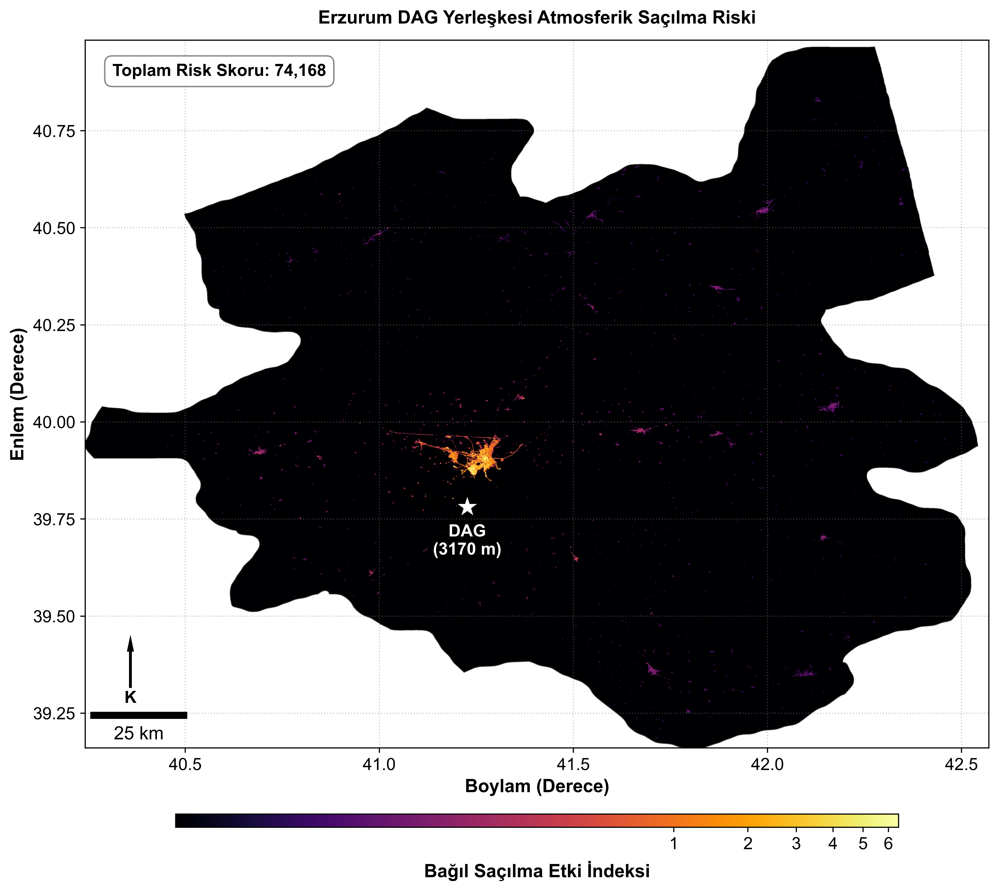

-> Başarılı! Harita kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_06_sacilma_riski_Erzurum.png

TÜM GÖZLEMEVLERİ İÇİN ATMOSFERİK SAÇILMA RİSKİ ANALİZİ TAMAMLANDI!
Özet Kümülatif Risk Skorları:
  * Antalya: 55,786.93
  * Erzurum: 74,168.16
Kaydedilen Klasör: C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer


In [1]:

"""SDGSAT-1 Glimmer Atmosferik Saçılma Riski ve Gözlemevi Tehdit Modellemesi
-------------------------------------------------------------------------
Bu script;
1. Glimmer RGB radyans verisini okur ve yapay pankromatik parlaklığı hesaplar.
2. Spektral oranlar (B/G ve R/G) ile aydınlatma teknolojilerini (HPS, WLED, RLED) sınıflandırır.
3. Rayleigh saçılma fiziğine (λ^-4) dayalı spektral saçılma ağırlıklarını atar:
   - Beyaz LED (WLED): W = 2.5 (Mavi tepe noktası ~450 nm nedeniyle aşırı saçılır)
   - Sodyum Buharlı (HPS): W = 1.0 (Referans baz değer)
   - Kırmızı LED (RLED): W = 0.4 (Uzun dalga boyu nedeniyle minimum saçılma)
4. Haversine formülü ile gözlemevinden her piksele olan jeodezik mesafeyi (km) hesaplar.
5. Göreceli Saçılma Etki İndeksini (RSI = (L * W) / d^2) ve kümülatif Toplam Risk Skorunu üretir.
6. Sönük ışık kubbelerini belirginleştiren Gama Düzeltmeli (PowerNorm, gamma=0.2) haritalar oluşturup kaydeder.
"""

# Gerekli modülleri içe aktarıyoruz
import glob
import os
import warnings
import matplotlib
import matplotlib.patheffects as pe
import matplotlib.pyplot as plt
from matplotlib.colors import PowerNorm
from matplotlib_scalebar.scalebar import ScaleBar
import numpy as np
import rasterio
# Uyarıları kapatıyoruz
warnings.filterwarnings('ignore')

# =============================================================================
# GLOBAL GRAFİK VE YAZI TİPİ AYARLARI
# =============================================================================
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans', 'Liberation Sans', 'Helvetica', 'sans-serif'],
    'mathtext.fontset': 'dejavusans',
    'mathtext.default': 'regular',
    'font.size': 13,
    'axes.labelsize': 13,
    'axes.titlesize': 13,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.titlesize': 15,
})

# =============================================================================
# 2. SABİTLER VE SPEKTRAL SAÇILMA AĞIRLIKLARI
# =============================================================================
# Spektral Saçılma Katsayıları (W_class - Rayleigh Saçılma Modeli)
# Sınıf 0: NoData (0.0), Sınıf 1: Karanlık (0.0), Sınıf 2: HPS (1.0), Sınıf 3: WLED (2.5), Sınıf 4: RLED (0.4)
SCATTERING_WEIGHTS = {
    0: 0.0,  # Sınır dışı
    1: 0.0,  # Karanlık zemin
    2: 1.0,  # Sodyum Buharlı / Standart referans
    3: 2.5,  # Beyaz LED (Mavi ışık atmosferde ~2.5 kat daha fazla saçılır)
    4: 0.4,  # Kırmızı/Sıcak LED (Uzun dalga boyu, düşük saçılma)
}

# =============================================================================
# 3. YARDIMCI MATEMATİKSEL FONKSİYONLAR
# =============================================================================
def haversine_distance_matrix(lat_grid, lon_grid, center_lat, center_lon):
    """Küre üzerindeki iki nokta arasındaki büyük daire mesafesini (Haversine formülü)
    kullanarak gözlemevinden tüm piksellere olan mesafeyi (km) matris olarak hesaplar.
    """
    R = 6371.0  # Dünya'nın ortalama yarıçapı (km)
    dlat = np.radians(lat_grid - center_lat)
    dlon = np.radians(lon_grid - center_lon)

    a = (np.sin(dlat / 2.0) ** 2 + np.cos(np.radians(center_lat)) * np.cos(np.radians(lat_grid)) * np.sin(dlon / 2.0) ** 2)
    c = 2.0 * np.arctan2(np.sqrt(a), np.sqrt(1.0 - a))
    return R * c

# =============================================================================
# 4. SAÇILMA RİSKİ HESAPLAMA VE HARİTALANDIRMA FONKSİYONU
# =============================================================================
def calculate_scattering_risk_gamma(city_name, info, output_png):
    """Glimmer RGB verisinden anlık sınıflandırma yapar, mesafeye bağlı saçılma riskini
    hesaplar ve Gama düzeltmeli tematik harita üretir.
    """
    print(f"\n{'='*75}")
    print(f'>>> [{city_name.upper()}] ATMOSFERİK SAÇILMA RİSKİ ANALİZİ BAŞLATILIYOR')
    print(f"{'='*75}")
    print(f"-> Glimmer Dosyası : {os.path.basename(info['rgb_tif'])}")
    print(f"-> Hedef Gözlemevi : {info['obs_name']} (Rakım: {info['elevation']})")

    if not os.path.exists(info['rgb_tif']):
        print(f"[HATA] Glimmer raster dosyası bulunamadı -> {info['rgb_tif']}")
        return None

    try:
        # ---------------------------------------------------------------------
        # A) RASTER VERİSİNİN VE KOORDİNAT GRİDİNİN OKUNMASI
        # ---------------------------------------------------------------------
        with rasterio.open(info['rgb_tif']) as src_rgb:
            height, width = src_rgb.height, src_rgb.width
            transform = src_rgb.transform

            # Koordinat matrislerini üret
            cols, rows = np.meshgrid(np.arange(width, dtype=np.float32), np.arange(height, dtype=np.float32))
            lon_grid = transform.c + (cols * transform.a) + (rows * transform.b)
            lat_grid = transform.f + (cols * transform.d) + (rows * transform.e)

            # 3 bantlı RGB veya tek bantlı durum kontrolü
            if src_rgb.count >= 3:
                red = src_rgb.read(1).astype(np.float32)
                green = src_rgb.read(2).astype(np.float32)
                blue = src_rgb.read(3).astype(np.float32)
                # Standart parlaklık (Luminance) hesabı
                radiance = ((0.2989 * red) + (0.5870 * green) + (0.1140 * blue))
                nodata_mask = (red == 0) & (green == 0) & (blue == 0)
            else:
                single_band = src_rgb.read(1).astype(np.float32)
                red = green = blue = radiance = single_band
                nodata_mask = single_band <= 0

        # ---------------------------------------------------------------------
        # B) ANLIK SPEKTRAL SINIFLANDIRMA
        # ---------------------------------------------------------------------
        # Boyut uyuşmazlığı hatalarını önlemek için sınıflandırma doğrudan RGB'den yapılır
        valid_pixels = radiance[~nodata_mask]
        if valid_pixels.size == 0:
            print('[HATA] Raster içinde geçerli piksel bulunamadı!')
            return None

        # Dinamik eşikleme (T = Ortalama + 0.5 * Standart Sapma)
        threshold = np.mean(valid_pixels) + (0.5 * np.std(valid_pixels))
        threshold = max(threshold, 0.05)

        classes = np.zeros_like(radiance, dtype=np.uint8)
        classes[~nodata_mask] = 1  # 1: Karanlık

        light_mask = (radiance > threshold) & (~nodata_mask)
        classes[light_mask] = 2  # 2: HPS

        epsilon = 1e-9
        bg = blue / (green + epsilon)
        rg = red / (green + epsilon)

        classes[(bg > 0.57) & light_mask] = 3  # 3: WLED
        classes[(rg > 9.0) & light_mask] = 4  # 4: RLED

        # ---------------------------------------------------------------------
        # C) ETKİN SPEKTRAL RADYANS (ESR) VE SAÇILMA İNDEKSİ (RSI) HESABI
        # ---------------------------------------------------------------------
        # Spektral ağırlık matrisini ata
        weights = np.zeros_like(radiance)
        for cls_id, weight in SCATTERING_WEIGHTS.items():
            weights[classes == cls_id] = weight

        # Etkin Spektral Radyans: ESR = Radyans * Spektral Ağırlık
        esr = radiance * weights

        # Gözlemevi merkezinden jeodezik mesafe matrisi (km)
        center_lat, center_lon = info['coords']
        dist_km = haversine_distance_matrix(lat_grid, lon_grid, center_lat, center_lon)
        dist_km = np.maximum(dist_km, 1.0)  # Sıfıra bölmeyi engelle

        # RSI: Ters Kare Yasası (1/d^2)
        impact_map = esr / (dist_km**2)
        impact_map_masked = np.ma.masked_where(nodata_mask, impact_map)

        # İl genelindeki kümülatif toplam risk skoru
        total_risk = np.sum(impact_map[~nodata_mask])
        print(f'-> [{city_name}] Toplam Kümülatif Saçılma Risk Skoru: {total_risk:,.2f}')

        # ---------------------------------------------------------------------
        # D) GÖRSELLEŞTİRME
        # ---------------------------------------------------------------------
        fig, ax = plt.subplots(figsize=(10, 10), facecolor='white', dpi=500)
        ax.set_facecolor('white')

        cmap = matplotlib.cm.inferno.copy()
        cmap.set_bad('white', 1.0) # Sınır dışı pikseller BEYAZ görünür

        valid_data = impact_map[~nodata_mask & (impact_map > 0)]
        vmin = np.percentile(valid_data, 1) if valid_data.size > 0 else 0
        vmax = np.percentile(valid_data, 99) if valid_data.size > 0 else 1.0

        # PowerNorm (gamma=0.2): Küçük saçılma değerlerini belirginleştirerek sönük ışık kubbelerini gösterir
        im = ax.imshow(impact_map_masked, cmap=cmap,
            norm=PowerNorm(gamma=0.2, vmin=vmin, vmax=vmax),
            extent=[lon_grid.min(), lon_grid.max(), lat_grid.min(), lat_grid.max()],
            origin='upper')

        # İl Sınır Çizgisi Konturu
        valid_mask = (~nodata_mask).astype(int)
        ax.contour(lon_grid, lat_grid, valid_mask, levels=[0.5], colors='black', linewidths=0.7, alpha=0.6)

        # Gözlemevi İşaretçisi
        ax.scatter(center_lon, center_lat, s=300, c='white', marker='*', edgecolors='black', linewidth=0.9, zorder=10)
        ax.text(center_lon, center_lat - 0.045, f"{info['obs_name']}\n({info['elevation']})",
                color='white', fontweight='bold', fontsize=12, ha='center', va='top',
                path_effects=[pe.withStroke(linewidth=3.5, foreground='black')], zorder=11)

        # Eksen Başlıkları ve Grid
        ax.set_title(f"{city_name} {info['obs_name']} Yerleşkesi Atmosferik Saçılma Riski", fontweight='bold',pad=12)
        ax.set_xlabel('Boylam (Derece)', fontweight='bold')
        ax.set_ylabel('Enlem (Derece)', fontweight='bold')
        ax.grid(True, linestyle=':', color='gray', alpha=0.4)

        # Yatay Renk Çubuğu
        cbar = plt.colorbar(im, ax=ax, orientation='horizontal', shrink=0.80, aspect=55, pad=0.07)
        cbar.set_label('Bağıl Saçılma Etki İndeksi', fontweight='bold', labelpad=6)
        cbar.ax.tick_params(labelsize=12)

        # Toplam Risk Skoru Bilgi Kutusu
        box_pos = info['score_box_pos']
        ax.text(box_pos[0], box_pos[1], f'Toplam Risk Skoru: {total_risk:,.0f}',
                transform=ax.transAxes, color='black', fontweight='bold', fontsize=12,
                bbox=dict(facecolor='white', edgecolor='gray', boxstyle='round,pad=0.45', alpha=0.92))

        # Kuzey Oku
        nx, ny, nlen = info['arrow_params']
        ax.annotate('K', xy=(nx, ny), xytext=(nx, ny - nlen), color='black',
                    arrowprops=dict(facecolor='black', edgecolor='none', width=2.0, headwidth=5.0),
                    ha='center', va='center', xycoords=ax.transAxes, fontweight='bold', fontsize=12)

        # Ölçek Çubuğu
        if city_name == 'Antalya':
            scalebar = ScaleBar(100, 'km', location='upper right', pad=0.15, border_pad=0.15, color='black', box_color='none')
        elif city_name == 'Erzurum':
            scalebar = ScaleBar(100, 'km', location='lower left', pad=0.15, border_pad=0.15, color='black', box_color='none')
        ax.add_artist(scalebar)

        # ---------------------------------------------------------------------
        # E) HARİTAYI DİSKE KAYDETME
        # ---------------------------------------------------------------------
        plt.tight_layout()
        plt.savefig(output_png, dpi=500, bbox_inches='tight', facecolor='white')
        plt.show()
        plt.close(fig)  # Bellek temizliği
        print(f'-> Başarılı! Harita kaydedildi:\n   {output_png}')

        return total_risk

    except Exception as e:
        import traceback

        traceback.print_exc()
        print(f'[HATA] [{city_name}] işlenirken bir sorun oluştu -> {e}')
        return None

# =============================================================================
# 5. ÇALIŞTIRMA BLOĞU (ANTALYA VE ERZURUM)
# =============================================================================
if __name__ == '__main__':
    # AYARLAR VE DİZİNLER (İşletim Sistemine Göre Otomatik Yol Yönetimi)
    if os.name == 'nt':  # Windows
        base_dir = r'E:\=PROJELER\=TUBITAK_3501_2024'
        target_output_dir = r'C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer'
    else:  # Linux / macOS
        base_dir = os.path.expanduser('~/=PROJELER/=TUBITAK_3501_2024')
        target_output_dir = os.path.expanduser('~/ATASAM/=3501_2024/==notebooks/=cikti/glimmer')

    os.makedirs(target_output_dir, exist_ok=True)
    glimmer_base_dir = os.path.join(base_dir, 'veri', 'uydu', 'glimmer', '=03_radiance')

    # Şehir ve Gözlemevi Görev Konfigürasyonları
    tasks = [
        {
            'name': 'Antalya',
            'glimmer_folder': os.path.join(glimmer_base_dir, '20250926_Antalya'),
            'obs_name': 'TUG',
            'elevation': '2500 m',
            'coords': (36.824305, 30.335311),  # (Enlem, Boylam)
            'score_box_pos': (0.03, 0.93),
            'arrow_params': (0.94, 0.90, 0.15),
        },
        {
            'name': 'Erzurum',
            'glimmer_folder': os.path.join(glimmer_base_dir, '20250912_Erzurum'),
            'obs_name': 'DAG',
            'elevation': '3170 m',
            'coords': (39.780950, 41.226446),  # (Enlem, Boylam)
            'score_box_pos': (0.03, 0.95),
            'arrow_params': (0.05, 0.16, 0.09),
        },
    ]

    summary_scores = {}

    # Her iki şehir için saçılma analizi haritalarını üret
    for task in tasks:
        # Glimmer raster dosyasını dinamik olarak bul
        candidates = glob.glob(os.path.join(task['glimmer_folder'], '*_MERGED_CLIPPED.tif'))
        if not candidates:
            candidates = glob.glob(os.path.join(task['glimmer_folder'], '*.tif'))

        if candidates:
            task['rgb_tif'] = candidates[0]
            out_png_path = os.path.join(target_output_dir, f"SONUC_RAPORU_GIU_06_sacilma_riski_{task['name']}.png")

            risk_score = calculate_scattering_risk_gamma(task['name'], task, out_png_path)
            if risk_score is not None:
                summary_scores[task['name']] = risk_score
        else:
            print(f"\n[UYARI] [{task['name']}] için Glimmer raster bulunamadı -> {task['glimmer_folder']}")

    print(f"\n{'='*75}")
    print('TÜM GÖZLEMEVLERİ İÇİN ATMOSFERİK SAÇILMA RİSKİ ANALİZİ TAMAMLANDI!')
    print('Özet Kümülatif Risk Skorları:')
    for city, score in summary_scores.items():
        print(f'  * {city}: {score:,.2f}')
    print(f'Kaydedilen Klasör: {target_output_dir}')
    print(f"{'='*75}")



## **7.5 Işık Kaynaklarının Tespiti**

## **7.5.1 Vektör Katmanlarının Hazırlanması ve Kentsel Fonksiyonların Ayrıştırılması**

- Uydu tabanlı gece ışıkları (NTL) analizlerinde yalnızca ışığın mekânsal dağılımını belirlemek yeterli olmamakta, bu ışık emisyonlarının hangi kentsel ve sosyoekonomik işlevlerden kaynaklandığının tespit edilmesi gerekmektedir. Şehirlerdeki ışık kirliliği ve spektral dönüşüm (özellikle mavi dalga boylu beyaz LED'lerin yayılımı); konut alanları, sanayi tesisleri, ticari merkezler ve kara yolu ağlarında farklı yoğunluk ve armatür tercihleriyle gerçekleşmektedir.

- Bu kapsamda, Antalya ve Erzurum kent merkezlerinde gözlemlenen aydınlatma desenlerinin morfolojik etkilerini modellemek amacıyla OpenStreetMap (OSM) platformunun Geofabrik veri tabanından sağlanan yüksek hassasiyetli vektör coğrafi veri setleri analitik çerçeveye entegre edilmiştir.

- Geliştirilen Python tabanlı mekânsal analiz modülünde şu aşamalar izlenmiştir:

  1. Veri işleme yükünü optimize etmek ve doğrudan kentsel çekirdeği izole etmek amacıyla, Antalya (Konyaaltı kıyı şeridi, Muratpaşa ve Kepez) ve Erzurum (Yakutiye, Palandöken ve Aziziye ilçeleri) için özel coğrafi sınır kutuları tanımlanmış ve GeoPandas kütüphanesi ile mekânsal indeksleme yapılarak kırpılmıştır.

  2. Kentsel arazi kullanımını ve aydınlatma ayak izini temsil eden dört temel vektör katmanı filtrelenerek 2×2 tematik analiz panelleri oluşturulmuştur:
 
     a) Ulaşım Ağı: Otoyollar, ana arterler ve tali yollar filtrelenerek özellikle araç trafiği ve kara yolu aydınlatmalarının yayılım hattı çıkarılmıştır.
 
     b) Ticari Alanlar ve Turizm/Perakende İlgi Noktaları: Ticari arazi poligonlarına ek olarak; oteller, tatil köyleri, süpermarketler, AVM'ler ve restoranlar gibi yüksek aydınlatma yoğunluğuna sahip noktasal ilgi odakları (Points of Interest - POI) birleştirilerek haritalandırılmıştır.
 
     c) Sanayi ve Endüstri Bölgeleri: Organize sanayi bölgeleri, üretim tesisleri ve lojistik depolama alanları izole edilerek gece vardiyaları ve güvenlik aydınlatması kaynakları belirlenmiştir.
 
     d) Konut ve Yerleşim Alanları: Kentsel konut dokusu ayrılarak sokak ve bina aydınlatmasının arka plan dağılımı modellenmiştir.

- Analize başlamadan önce gerekli olan **"osmnx"** kütüphanesini alttaki ilk hücrede kuruyoruz.


In [6]:

"""
OSMnx, OpenStreetMap (OSM) sunucularından sokak ağlarını, binaları, arazi kullanım poligonlarını ve
ilgi noktalarını (POI) doğrudan Python ortamına indirmeye, modellemeye ve analiz etmeye yarayan
güçlü bir açık kaynak kütüphanesidir. Manuel olarak büyük shapefile dosyaları indirmeye gerek kalmadan,
sadece bir şehir veya koordinat adı vererek kentsel ulaşım ve altyapı verilerini GeoPandas/NetworkX formatında
çekmenizi sağlar.
"""

# osmnx kurulumu

pip install osmnx


   ---------------------------------------- 0.0/2.1 MB ? eta -:--:--
   ---------------------------------------- 2.1/2.1 MB 19.2 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.



>>> [ANTALYA] OSM VEKTÖR FONKSİYON KATMANLARI HAZIRLANIYOR
-> 1/3 Ulaşım ağı (Ana yollar) okunuyor...
-> 2/3 Arazi kullanım poligonları okunuyor...
-> 3/3 Ticari ve turizm ilgi noktaları (POI) okunuyor...


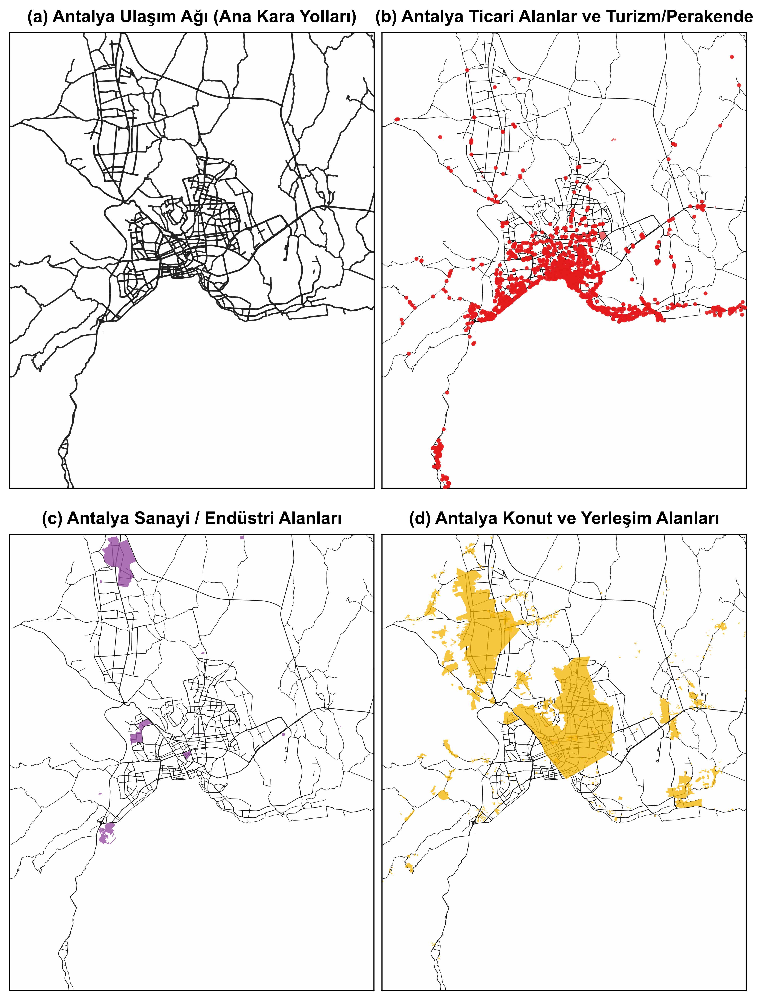

-> Başarılı! OSM tematik haritası kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_07_OSM_Antalya_kentsel_fonksiyon_alanlari.png

>>> [ERZURUM] OSM VEKTÖR FONKSİYON KATMANLARI HAZIRLANIYOR
-> 1/3 Ulaşım ağı (Ana yollar) okunuyor...
-> 2/3 Arazi kullanım poligonları okunuyor...
-> 3/3 Ticari ve turizm ilgi noktaları (POI) okunuyor...


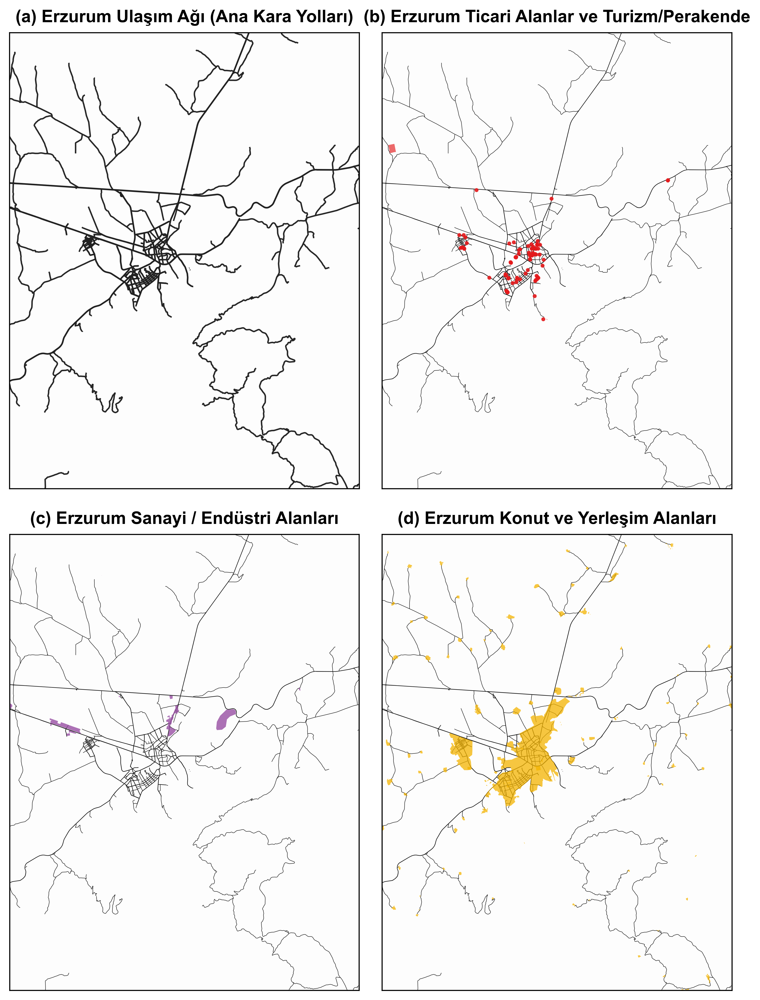

-> Başarılı! OSM tematik haritası kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_07_OSM_Erzurum_kentsel_fonksiyon_alanlari.png

TÜM İLLER İÇİN OSM VEKTÖR ANALİZLERİ BAŞARIYLA TAMAMLANDI!
Çıktı Dizini: C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer


In [1]:

"""Antalya ve Erzurum Kentsel Fonksiyon Alanlarının Açık Harita (OSM) Vektör Analizi
---------------------------------------------------------------------------------
Bu script;
1. Geofabrik Türkiye OSM Shapefile arşivinden Antalya ve Erzurum şehir merkezlerini
   kapsayan sınır kutularını keser.
2. Dört temel kentsel fonksiyon katmanını ayıklar ve filtreler:
   - (a) Ulaşım Ağı (Otoyol, ana/tali arterler)
   - (b) Ticari Alanlar ve Turizm/Perakende Noktaları (Poligonlar + POI'ler)
   - (c) Sanayi / Endüstriyel Tesis Alanları
   - (d) Konut / Yerleşim Alanları
3. Gece ışığı kaynaklarının kentsel fonksiyonlarla eşleştirilmesi için 2x2 yüksek
   çözünürlüklü tematik haritalar üretip kaydeder.
"""

# Gerekli modülleri içe aktarıyoruz
import os
import warnings
import geopandas as gpd
import matplotlib.pyplot as plt
from shapely.geometry import box
# Uyarıları kapatıyoruz
warnings.filterwarnings('ignore')

# =============================================================================
# 2. GLOBAL GRAFİK VE YAZI TİPİ AYARLARI (Rapor Standartları)
# =============================================================================
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': [ 'Arial', 'DejaVu Sans', 'Liberation Sans', 'Helvetica', 'sans-serif'],
    'mathtext.fontset': 'dejavusans',
    'mathtext.default': 'regular',
    'font.size': 13,
    'axes.labelsize': 13,
    'axes.titlesize': 13,
    'xtick.labelsize': 12,
    'ytick.labelsize': 12,
    'legend.fontsize': 12,
    'figure.titlesize': 15,
})

# =============================================================================
# 3. OSM KATMANLARINI ÇİZME FONKSİYONU
# =============================================================================
def plot_osm_functional_layers(osm_folder, bbox_coords, city_name, output_path):
    """OSM shapefile klasöründen ilgili sınır kutusundaki katmanları çeker ve 2x2 görselleştirir."""
    print(f"\n{'='*75}")
    print(f'>>> [{city_name.upper()}] OSM VEKTÖR FONKSİYON KATMANLARI HAZIRLANIYOR')
    print(f"{'='*75}")

    if not os.path.exists(osm_folder):
        print(f'[HATA] OSM veri klasörü bulunamadı -> {osm_folder}')
        return

    # Sınır Kutusu Geometrisinin Oluşturulması (min_lat, max_lat, min_lon, max_lon)
    min_lat, max_lat, min_lon, max_lon = bbox_coords
    bbox_geom = box(min_lon, min_lat, max_lon, max_lat)

    # Hedef Shapefile Dosya Yolları
    roads_path = os.path.join(osm_folder, 'gis_osm_roads_free_1.shp')
    landuse_path = os.path.join(osm_folder, 'gis_osm_landuse_a_free_1.shp')
    pois_path = os.path.join(osm_folder, 'gis_osm_pois_free_1.shp')

    # -------------------------------------------------------------------------
    # A) ULAŞIM AĞI (ROADS) OKUMA VE FİLTRELEME
    # -------------------------------------------------------------------------
    print('-> 1/3 Ulaşım ağı (Ana yollar) okunuyor...')
    if os.path.exists(roads_path):
        gdf_roads = gpd.read_file(roads_path, bbox=bbox_geom)
        main_roads = ['motorway', 'trunk', 'primary', 'secondary', 'tertiary']
        gdf_roads = gdf_roads[gdf_roads['fclass'].isin(main_roads)]
    else:
        print(f'[UYARI] Yol dosyası bulunamadı: {roads_path}')
        gdf_roads = gpd.GeoDataFrame()

    # -------------------------------------------------------------------------
    # B) ARAZİ KULLANIMI (LAND USE POLYGONS) OKUMA VE AYIKLAMA
    # -------------------------------------------------------------------------
    print('-> 2/3 Arazi kullanım poligonları okunuyor...')
    if os.path.exists(landuse_path):
        gdf_landuse = gpd.read_file(landuse_path, bbox=bbox_geom)
        gdf_comm_poly = gdf_landuse[gdf_landuse['fclass'].isin(['commercial', 'retail'])]
        gdf_indus = gdf_landuse[gdf_landuse['fclass'].isin(['industrial'])]
        gdf_resid = gdf_landuse[gdf_landuse['fclass'].isin(['residential'])]
    else:
        print(f'[UYARI] Arazi kullanım dosyası bulunamadı: {landuse_path}')
        gdf_comm_poly = gdf_indus = gdf_resid = gpd.GeoDataFrame()

    # -------------------------------------------------------------------------
    # C) TİCARİ VE TURİZM ODAKLI NOKTASAL VERİLER (POI POINTS)
    # -------------------------------------------------------------------------
    print('-> 3/3 Ticari ve turizm ilgi noktaları (POI) okunuyor...')
    if os.path.exists(pois_path):
        try:
            gdf_pois = gpd.read_file(pois_path, bbox=bbox_geom)
            comm_tags = ['supermarket', 'convenience', 'mall', 'department_store', 'clothing', 'hotel', 'motel',
                         'hostel', 'restaurant', 'cafe', 'bar', 'bank', 'commercial', 'retail']
            gdf_comm_points = gdf_pois[gdf_pois['fclass'].isin(comm_tags)]
        except Exception as e:
            print(f'POI okuma hatası: {e}')
            gdf_comm_points = gpd.GeoDataFrame()
    else:
        print(f'[UYARI] POI dosyası bulunamadı: {pois_path}')
        gdf_comm_points = gpd.GeoDataFrame()

    # -------------------------------------------------------------------------
    # D) 2x2 TEMATİK HARİTA ÇİZİMİ
    # -------------------------------------------------------------------------
    fig, axes = plt.subplots(2, 2, figsize=(10, 13), dpi=500, facecolor='white')

    # Tüm paneller için ortak arka plan ve alt referans katmanları
    for ax in axes.flat:
        ax.set_facecolor('#fdfdfd')
        ax.set_xlim(min_lon, max_lon)
        ax.set_ylim(min_lat, max_lat)
        ax.set_xticks([])
        ax.set_yticks([])
        # Kentsel doku omurgası için ince alt yollar
        if not gdf_roads.empty:
            gdf_roads.plot(ax=ax, color='#111111', linewidth=0.35, alpha=0.9, zorder=1)

    # === PANEL 1: ULAŞIM AĞI (Sol Üst) ===
    ax0 = axes[0, 0]
    if not gdf_roads.empty:
        gdf_roads.plot(ax=ax0, color='#222222', linewidth=1.1, alpha=0.95, zorder=2)
    ax0.set_title(f'(a) {city_name} Ulaşım Ağı (Ana Kara Yolları)', fontweight='bold', pad=8)

    # === PANEL 2: TİCARİ ALANLAR VE TURİZM/PERAKENDE (Sağ Üst) ===
    ax1 = axes[0, 1]
    if not gdf_comm_poly.empty:
        gdf_comm_poly.plot(ax=ax1, color='#E41A1C', alpha=0.65, edgecolor='none', zorder=2)
    if not gdf_comm_points.empty:
        gdf_comm_points.plot(ax=ax1, color='#E41A1C', markersize=4, alpha=0.85, marker='o', zorder=3)
    ax1.set_title(f'(b) {city_name} Ticari Alanlar ve Turizm/Perakende', fontweight='bold', pad=8)

    # === PANEL 3: SANAYİ / ENDÜSTRİ BÖLGELERİ (Sol Alt) ===
    ax2 = axes[1, 0]
    if not gdf_indus.empty:
        gdf_indus.plot(ax=ax2, color='#984EA3', alpha=0.80, edgecolor='none', zorder=2)
    ax2.set_title(f'(c) {city_name} Sanayi / Endüstri Alanları', fontweight='bold', pad=8)

    # === PANEL 4: KONUT VE YERLEŞİM ALANLARI (Sağ Alt) ===
    ax3 = axes[1, 1]
    if not gdf_resid.empty:
        gdf_resid.plot(ax=ax3, color='#F4B400', alpha=0.75, edgecolor='none', zorder=2)
    ax3.set_title(f'(d) {city_name} Konut ve Yerleşim Alanları', fontweight='bold', pad=8)

    plt.subplots_adjust(wspace=0.01, hspace=0.10)

    # -------------------------------------------------------------------------
    # E) HARİTAYI DİSKE KAYDETME
    # -------------------------------------------------------------------------
    os.makedirs(os.path.dirname(output_path), exist_ok=True)
    plt.savefig(output_path, dpi=500, bbox_inches='tight', facecolor='white')
    plt.show()
    plt.close(fig)  # Bellek temizliği
    print(f'-> Başarılı! OSM tematik haritası kaydedildi:\n   {output_path}')

# =============================================================================
# 4. ÇALIŞTIRMA BLOĞU (ANTALYA VE ERZURUM)
# =============================================================================
if __name__ == '__main__':
    # İşletim sistemine göre dizin tespiti
    if os.name == 'nt':  # Windows
        base_dir = r'E:\=PROJELER\=TUBITAK_3501_2024'
        osm_turkey_folder = (r'E:\=REMOTE_SENSING\=vectorData\turkey-260126-free.shp')
        target_output_dir = r'C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer'
    else:  # Linux / macOS
        base_dir = os.path.expanduser('~/=PROJELER/=TUBITAK_3501_2024')
        osm_turkey_folder = os.path.expanduser('~/vectorData/turkey-260126-free.shp')
        target_output_dir = os.path.expanduser('~/ATASAM/=3501_2024/==notebooks/=cikti/glimmer')

    # Şehir bazlı sınır kutuları (Min_Enlem, Max_Enlem, Min_Boylam, Max_Boylam)
    city_tasks = [
        {
            'name': 'Antalya',
            # Konyaaltı Sahil Şeridi, Muratpaşa ve Kepez Kentsel Çekirdeği
            'bbox': (36.70, 37.10, 30.50, 30.90),
        },
        {
            'name': 'Erzurum',
            # Yakutiye, Palandöken ve Aziziye Kentsel Çekirdeği
            'bbox': (39.70, 40.10, 41.10, 41.50),
        },
    ]

    for task in city_tasks:
        output_png = os.path.join(target_output_dir, f"SONUC_RAPORU_GIU_07_OSM_{task['name']}_kentsel_fonksiyon_alanlari.png")

        plot_osm_functional_layers(
            osm_folder=osm_turkey_folder,
            bbox_coords=task['bbox'],
            city_name=task['name'],
            output_path=output_png,
        )

    print(f"\n{'='*75}")
    print('TÜM İLLER İÇİN OSM VEKTÖR ANALİZLERİ BAŞARIYLA TAMAMLANDI!')
    print(f'Çıktı Dizini: {target_output_dir}')
    print(f"{'='*75}")



## **7.5.2 Kentsel Arazi Kullanımı (LULC) ve Kaynak Tespiti Analizi**

- Uydu görüntülerinden tespit edilen aydınlatma teknolojilerinin (HPS, WLED, RLED) kentsel mekândaki dağılımı, sosyoekonomik dinamiklerden ve kentsel fonksiyon alanlarından bağımsız değildir. Gece ışıklarının kontrol altına alınabilmesi ve ışık kirliliğine yönelik sürdürülebilir koruma politikalarının geliştirilebilmesi için; hangi aydınlatma türünün hangi kentsel işlevden (ulaşım, turizm, ticaret, sanayi veya konut) kaynaklandığının nicel olarak ayrıştırılması zorunludur.

- Bu doğrultuda, SDGSAT-1 Glimmer sınıflandırma haritaları ile OpenStreetMap (OSM) platformundan elde edilen yüksek çözünürlüklü vektör katmanları entegre edilerek, Antalya ve Erzurum illeri için çok katmanlı bir arazi kullanımı ve ışık kaynakları eşleştirme analizi gerçekleştirilmiştir.

- Metodolojik İş Akışı ve Hiyerarşik Modelleme:

  1. Açık kaynak vektör veri tabanında çizgisel olarak temsil edilen kara yolları ile noktasal (point) olarak temsil edilen ticari/turistik ilgi odakları (oteller, AVM'ler, restoranlar vb.); WGS84 coğrafi koordinat sisteminden yerel metrik projeksiyon sitemine (UTM) dönüştürülerek 20 metre yarıçapında (40 m genişlik) tamponlanmıştır (buffering). Bu işlem, çizgisel ve noktasal özniteliklerin 40 metrelik Glimmer piksel çözünürlüğü ile tam uyumlu fiziksel etki alanlarına dönüştürülmesini sağlamıştır.

  2. Farklı kentsel fonksiyonların aynı piksel üzerinde çakışması durumunda ortaya çıkabilecek karmaşıklığı önlemek amacıyla, kentsel aydınlatma yoğunluğunu temel alan katı bir hiyerarşik öncelik kuralı kurgulanmış ve vektör katmanlar tek bir LULC raster gridine dönüştürülmüştür. Öncelik Sırası: Ulaşım (Yollar) > Ticari/Turizm (POI + Poligon) > Sanayi > Konut > Diğer/Açık Alan (Karayolu ve kavşak armatürleri fiziksel olarak çevre arazi örtüsünün üzerinde yer almakta; ticari/turistik cephe ışıkları ise standart konut alanlarına kıyasla çok daha yüksek aydınlatma şiddeti üretmektedir).
 
  3. Üretilen LULC raster matrisi ile Glimmer lamba türü sınıflandırma haritası piksel bazında çakıştırılmıştır. Her bir aydınlatma teknolojisinin (i=HPS, WLED, RLED) kentsel fonksiyon alanları (j=Ulaşım, Ticaret, Sanayi, Konut, Diğer) içerisindeki yüzde dağılımını ifade eden Spektral Kompozisyon Oranı ($SCR_{LULC}$) hesaplanmıştır:
 
     $$SCR_{LULC}(\%)=(Piksel Sayısı_{(i,j)} / (Toplam Piksel Sayısı_{(i,j)})x100$$



>>> [ANTALYA] LULC ARAZİ KULLANIMI VE IŞIK KAYNAĞI EŞLEŞTİRMESİ
  -> OSM katmanları filtrelenerek okunuyor (Yollar, Poligonlar, POI)...
  -> Okunan Vektör Sayıları: 10,617 yol | 125 ticari alan | 6,155 POI | 98 sanayi | 3,691 konut
  -> Hiyerarşik rasterizasyon yapılıyor...

>>> [ERZURUM] LULC ARAZİ KULLANIMI VE IŞIK KAYNAĞI EŞLEŞTİRMESİ
  -> OSM katmanları filtrelenerek okunuyor (Yollar, Poligonlar, POI)...
  -> Okunan Vektör Sayıları: 6,945 yol | 21 ticari alan | 271 POI | 101 sanayi | 4,601 konut
  -> Hiyerarşik rasterizasyon yapılıyor...

=== LULC IŞIK KAYNAĞI TESPİTİ ÖZET TABLOSU ===
  Şehir Aydınlatma Türü  Toplam Piksel  Ulaşım Ağı  Ticari ve Turizm  Sanayi / Endüstri  Konut / Yerleşim  Diğer / Açık Alan
Antalya             HPS         347268       14.34              0.77               1.36             30.14              53.40
Antalya            WLED          39284        7.81              2.60               3.89             20.27              65.43
Antalya            RLED     

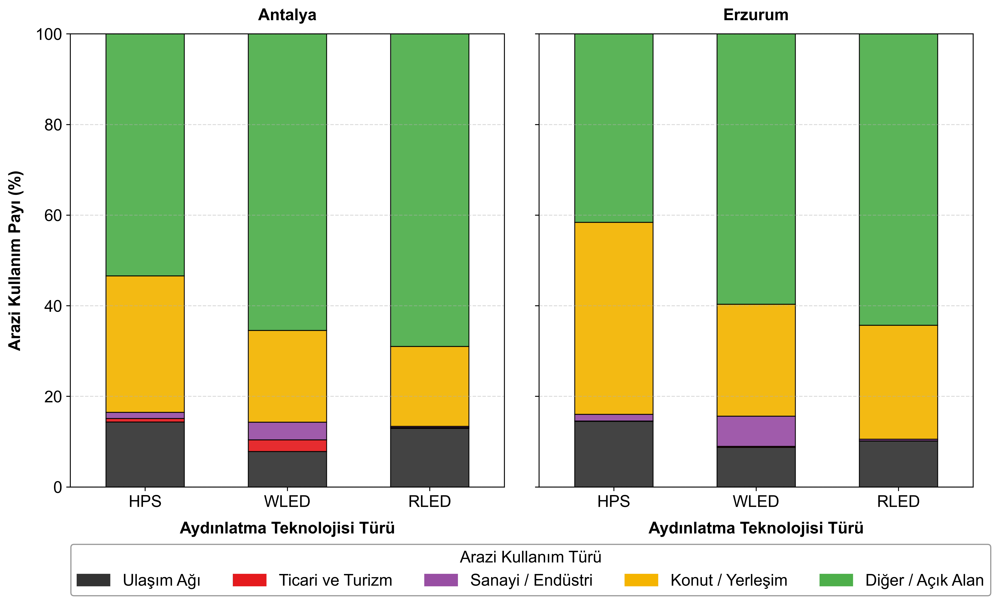

-> Başarılı! Kaynak tespiti grafiği kaydedildi:
   C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer\SONUC_RAPORU_GIU_08_OSM_LULC_kaynak_tespiti_grafigi.png

TÜM ŞEHİRLER İÇİN LULC KAYNAK TESPİTİ ANALİZİ TAMAMLANDI!
Çıktı Klasörü: C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer


In [1]:

"""Arazi Kullanımı / Kentsel Fonksiyon (LULC) ve Işık Kaynakları Eşleştirme Analizi
-------------------------------------------------------------------------------
Bu script;
1. Geofabrik OpenStreetMap (OSM) vektör verilerini (Yollar, Arazi Kullanım Poligonları ve POI Noktaları) okur.
2. Noktasal ticari/turizm tesislerini ve kara yollarını metrik UTM projeksiyonunda 20 metre tamponlar (buffer).
3. Vektör katmanlarını hiyerarşik öncelik sırasına göre 40 m'lik Glimmer raster ızgarasına dönüştürür (Rasterization):
   Öncelik Sırası: Yollar > Ticari/Turizm (POI + Poligon) > Sanayi > Konut > Diğer
4. Sınıflandırılmış Glimmer lamba türleri (HPS, WLED, RLED) ile arazi kullanım katmanını piksel bazında çakıştırır.
5. Hangi aydınlatma teknolojisinin hangi kentsel fonksiyondan (Ulaşım, Ticaret, Konut, Sanayi) kaynaklandığını hesaplar.
6. Sonuçları detaylı CSV tablosu ve 1x2 bar grafik olarak kaydeder.
"""

# Gerekli modülleri içe aktarıyoruz
import glob
import os
import warnings
import geopandas as gpd
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import rasterio
from rasterio import features
from shapely.geometry import box
# Uyarıları kapatıyoruz
warnings.filterwarnings('ignore')

# =============================================================================
# 2. GLOBAL GRAFİK VE YAZI TİPİ AYARLARI
# =============================================================================
plt.rcParams.update({
    'font.family': 'sans-serif',
    'font.sans-serif': ['Arial', 'DejaVu Sans', 'Liberation Sans', 'Helvetica', 'sans-serif'],
    'mathtext.fontset': 'dejavusans',
    'mathtext.default': 'regular',
    'font.size': 14,
    'axes.labelsize': 14,
    'axes.titlesize': 14,
    'xtick.labelsize': 14,
    'ytick.labelsize': 14,
    'legend.fontsize': 14,
    'figure.titlesize': 16,
})

# =============================================================================
# 3. SABİTLER VE ARAZİ KULLANIMI (LULC) SINIFLARI
# =============================================================================
LULC_CODES = {
    'Ulaşım Ağı': {'code': 10, 'color': '#333333'},  # Koyu Gri
    'Ticari ve Turizm': {'code': 20, 'color': '#E41A1C'},  # Kırmızı
    'Sanayi / Endüstri': {'code': 30, 'color': '#984EA3'},  # Mor
    'Konut / Yerleşim': {'code': 40, 'color': '#F4B400'},  # Altın Sarısı
    'Diğer / Açık Alan': {'code': 50, 'color': '#4DAF4A'},  # Yeşil
}

# =============================================================================
# 4. YARDIMCI VEKTÖR VE COĞRAFİ İŞLEM FONKSİYONLARI
# =============================================================================
def load_filtered_osm_with_poi(osm_folder, bbox_bounds):
    """OSM shapefile arşivinden sadece çalışma alanının sınır kutusu (bbox) içine düşen
    yolları, arazi poligonlarını ve ticari/turistik ilgi noktalarını (POI) okur.
    """
    print('  -> OSM katmanları filtrelenerek okunuyor (Yollar, Poligonlar, POI)...')
    bbox_geom = box(bbox_bounds.left, bbox_bounds.bottom, bbox_bounds.right, bbox_bounds.top)

    roads_path = os.path.join(osm_folder, 'gis_osm_roads_free_1.shp')
    landuse_path = os.path.join(osm_folder, 'gis_osm_landuse_a_free_1.shp')
    pois_path = os.path.join(osm_folder, 'gis_osm_pois_free_1.shp')

    # 1. Ulaşım Ağı (Ana Arterler)
    gdf_roads = gpd.read_file(roads_path, bbox=bbox_geom)
    main_roads = ['motorway', 'trunk', 'primary', 'secondary', 'tertiary']
    gdf_roads = gdf_roads[gdf_roads['fclass'].isin(main_roads)]

    # 2. Arazi Kullanımı Poligonları
    gdf_landuse = gpd.read_file(landuse_path, bbox=bbox_geom)
    gdf_comm = gdf_landuse[gdf_landuse['fclass'].isin(['commercial', 'retail'])]
    gdf_indus = gdf_landuse[gdf_landuse['fclass'].isin(['industrial'])]
    gdf_resid = gdf_landuse[gdf_landuse['fclass'].isin(['residential'])]

    # 3. Ticari ve Turistik İlgi Noktaları (POI)
    gdf_pois = gpd.read_file(pois_path, bbox=bbox_geom)
    comm_tags = ['supermarket', 'convenience', 'mall', 'department_store', 'clothing', 'hotel', 'motel',
                 'hostel', 'restaurant', 'cafe', 'bar', 'bank', 'commercial', 'retail']
    gdf_comm_points = gdf_pois[gdf_pois['fclass'].isin(comm_tags)]

    return gdf_roads, gdf_comm, gdf_indus, gdf_resid, gdf_comm_points

def buffer_geometry_utm(gdf, meters):
    """Derece (WGS84) cinsindeki vektör veriyi en uygun yerel metrik UTM projeksiyonuna
    dönüştürür, verilen metre kadar genişletir (buffer) ve tekrar WGS84'e çevirir.
    """
    if gdf.empty:
        return gdf
    utm_crs = gdf.estimate_utm_crs()
    gdf_proj = gdf.to_crs(utm_crs)
    gdf_proj['geometry'] = gdf_proj.geometry.buffer(meters)
    return gdf_proj.to_crs(epsg=4326)

def rasterize_hierarchical_lulc(shape, transform, roads, comm, indus, resid, pois):
    """Vektör katmanlarını hiyerarşik öncelik kuralına göre tek bir raster matrise basar.
    HİYERARŞİ ÖNCELİĞİ:
    1. Diğer / Açık Alan (Taban Değer: 50)
    2. Konut Alanları (40)
    3. Sanayi Alanları (30)
    4. Ticari Poligonlar (20)
    5. Ticari/Turizm POI Noktaları (20 - 20m tamponlu)
    6. Ulaşım Ağı (10 - 20m yol tamponlu - En üstte yer alır)
    """
    lulc_grid = np.full(shape, 50, dtype=np.uint8)  # 50: Diğer / Arka Plan

    # 1. Konut
    if not resid.empty:
        features.rasterize(((geom, 40) for geom in resid.geometry), out=lulc_grid, transform=transform)

    # 2. Sanayi
    if not indus.empty:
        features.rasterize(((geom, 30) for geom in indus.geometry), out=lulc_grid, transform=transform)

    # 3. Ticari Poligonlar
    if not comm.empty:
        features.rasterize(((geom, 20) for geom in comm.geometry), out=lulc_grid, transform=transform)

    # 4. Ticari POI Noktaları (20 m yarıçaplı dairesel tampon)
    if not pois.empty:
        pois_buffered = buffer_geometry_utm(pois, 20)
        features.rasterize(((geom, 20) for geom in pois_buffered.geometry), out=lulc_grid, transform=transform)

    # 5. Yollar (20 m yarıçap = 40 m yol genişliği tamponu)
    if not roads.empty:
        roads_buffered = buffer_geometry_utm(roads, 20)
        features.rasterize(((geom, 10) for geom in roads_buffered.geometry), out=lulc_grid, transform=transform)

    return lulc_grid

# =============================================================================
# 5. ÇAKIŞTIRMA VE KAYNAK TESPİTİ ANALİZ FONKSİYONU
# =============================================================================
def analyze_city_lulc_attribution(city_name, tif_path, osm_folder):
    """Belirli bir şehir için Glimmer sınıflandırma rasterı ile OSM arazi kullanımını
    piksel bazında çakıştırarak kaynak tespit istatistiklerini üretir.
    """
    print(f"\n{'='*75}")
    print(f'>>> [{city_name.upper()}] LULC ARAZİ KULLANIMI VE IŞIK KAYNAĞI EŞLEŞTİRMESİ')
    print(f"{'='*75}")

    if not os.path.exists(tif_path):
        print(f'[HATA] Sınıflandırılmış raster dosyası bulunamadı -> {tif_path}')
        return None

    with rasterio.open(tif_path) as src:
        light_data = src.read(1)
        transform = src.transform
        shape = light_data.shape
        bounds = src.bounds

    try:
        roads, comm, indus, resid, pois = load_filtered_osm_with_poi(osm_folder, bounds)
        print(f'  -> Okunan Vektör Sayıları: {len(roads):,} yol | {len(comm):,} ticari alan | {len(pois):,} POI | {len(indus):,} sanayi | {len(resid):,} konut')
    except Exception as e:
        print(f'[HATA] OSM katmanları okunurken sorun oluştu -> {e}')
        return None

    print('  -> Hiyerarşik rasterizasyon yapılıyor...')
    lulc_data = rasterize_hierarchical_lulc(shape, transform, roads, comm, indus, resid, pois)

    results = []

    # Işık Sınıfları: 2: HPS (Sodyum), 3: WLED (Beyaz LED), 4: RLED (Kırmızı LED)
    light_mapping = {
        2: 'HPS',
        3: 'WLED',
        4: 'RLED',
    }

    for light_class, light_name in light_mapping.items():
        mask = light_data == light_class
        total_pixels = np.sum(mask)

        if total_pixels == 0:
            continue

        lulc_values = lulc_data[mask]
        unique, counts = np.unique(lulc_values, return_counts=True)
        counts_dict = dict(zip(unique, counts))

        row = {'Şehir': city_name, 'Aydınlatma Türü': light_name, 'Toplam Piksel': total_pixels}

        # Her arazi kullanım sınıfının o aydınlatma içindeki yüzdesini hesapla
        for lulc_name, info in LULC_CODES.items():
            count = counts_dict.get(info['code'], 0)
            percent = (count / total_pixels) * 100.0
            row[lulc_name] = percent

        results.append(row)

    return pd.DataFrame(results)

# =============================================================================
# 6. GRAFİK ÇİZİM FONKSİYONU
# =============================================================================
def plot_lulc_attribution_turkish(df, output_path):
    """Antalya ve Erzurum için aydınlatma teknolojilerinin kentsel fonksiyon alanlarına
    göre dağılımını 1x2 yığılmış bar grafik olarak çizer.
    """
    cities = df['Şehir'].unique()
    fig, axes = plt.subplots(1, 2, figsize=(12, 7), sharey=True, dpi=500, facecolor='white')

    lulc_types = list(LULC_CODES.keys())
    colors = [LULC_CODES[l]['color'] for l in lulc_types]
    patches = [mpatches.Patch(color=LULC_CODES[l]['color'], label=l) for l in lulc_types]

    for idx, city in enumerate(cities):
        ax = axes[idx]
        subset = df[df['Şehir'] == city].set_index('Aydınlatma Türü')
        subset_plot = subset[lulc_types]

        subset_plot.plot(
            kind='bar',
            stacked=True,
            ax=ax,
            color=colors,
            edgecolor='black',
            linewidth=0.8,
            alpha=0.92,
            width=0.55,
            legend=False,
        )

        ax.set_title(f'{city}', fontweight='bold', pad=12)
        ax.set_xlabel('Aydınlatma Teknolojisi Türü', fontweight='bold', labelpad=10)
        ax.grid(axis='y', linestyle='--', alpha=0.45)
        ax.set_ylim(0, 100)
        ax.tick_params(axis='x', rotation=0, labelsize=14)
        ax.tick_params(axis='y', labelsize=14)

        # Sadece sol grafiğe Y ekseni etiketi ekle
        if idx == 0:
            ax.set_ylabel('Arazi Kullanım Payı (%)', fontweight='bold', labelpad=10)

    # Ortak Alt Lejant
    fig.legend(
        handles=patches,
        loc='lower center',
        bbox_to_anchor=(0.54, -0.05),
        ncol=5,
        frameon=True,
        facecolor='white',
        edgecolor='gray',
        title='Arazi Kullanım Türü',
        title_fontsize=14,
    )

    plt.tight_layout()
    plt.subplots_adjust(bottom=0.15, wspace=0.08)

    plt.savefig(output_path, dpi=500, bbox_inches='tight', facecolor='white')
    plt.show()
    plt.close(fig)  # Bellek temizliği
    print(f'-> Başarılı! Kaynak tespiti grafiği kaydedildi:\n   {output_path}')

# =============================================================================
# 7. ÇALIŞTIRMA BLOĞU (ANTALYA VE ERZURUM)
# =============================================================================
if __name__ == '__main__':
    # İşletim sistemine göre dizin tespiti
    if os.name == 'nt':  # Windows
        base_dir = r'E:\=PROJELER\=TUBITAK_3501_2024'
        osm_turkey_folder = (r'E:\=REMOTE_SENSING\=vectorData\turkey-260126-free.shp')
        target_output_dir = r'C:\Users\HP\YandexDisk\ATASAM\=3501_2024\==notebooks\=cikti\glimmer'
    else:  # Linux / macOS
        base_dir = os.path.expanduser('~/=PROJELER/=TUBITAK_3501_2024')
        osm_turkey_folder = os.path.expanduser('~/vectorData/turkey-260126-free.shp')
        target_output_dir = os.path.expanduser('~/ATASAM/=3501_2024/==notebooks/=cikti/glimmer')

    os.makedirs(target_output_dir, exist_ok=True)

    # Sınıflandırılmış GeoTIFF yolları
    ant_tif = os.path.join(target_output_dir, 'SONUC_RAPORU_GIU_04_Antalya_lamba_siniflandirma_zoom.tif')
    erz_tif = os.path.join(target_output_dir, 'SONUC_RAPORU_GIU_04_Erzurum_lamba_siniflandirma_zoom.tif')

    # Şehir Analiz Görevleri
    city_tasks = [
        {'name': 'Antalya', 'tif_path': ant_tif},
        {'name': 'Erzurum', 'tif_path': erz_tif},
    ]

    all_dfs = []
    for task in city_tasks:
        df_city = analyze_city_lulc_attribution(task['name'], task['tif_path'], osm_turkey_folder)
        if df_city is not None:
            all_dfs.append(df_city)

    if all_dfs:
        final_df = pd.concat(all_dfs, ignore_index=True)

        # 1. Sonuç Tablosunu Konsola Yazdır
        print('\n=== LULC IŞIK KAYNAĞI TESPİTİ ÖZET TABLOSU ===')
        print(final_df.to_string(index=False, float_format='%.2f'))

        # 2. CSV Olarak Kaydet
        csv_out = os.path.join(target_output_dir, 'SONUC_RAPORU_GIU_08_OSM_LULC_kaynak_tespiti_istatistikleri.csv')
        final_df.to_csv(csv_out, index=False, encoding='utf-8-sig')
        print(f'\n-> Detaylı CSV Tablosu Kaydedildi:\n   {csv_out}')

        # 3. Yığılmış Bar Grafiği Çiz ve Kaydet
        png_out = os.path.join(target_output_dir, 'SONUC_RAPORU_GIU_08_OSM_LULC_kaynak_tespiti_grafigi.png')
        plot_lulc_attribution_turkish(final_df, png_out)

    print(f"\n{'='*75}")
    print('TÜM ŞEHİRLER İÇİN LULC KAYNAK TESPİTİ ANALİZİ TAMAMLANDI!')
    print(f'Çıktı Klasörü: {target_output_dir}')
    print(f"{'='*75}")



## **7.6 Bölüm Özeti**

- Bu eğitim ve uygulama bölümünde, SDGSAT-1 uydusunun Glimmer sensöründen elde edilen çok bantlı (RGB) gece ışığı verileri işlenmiş; Türkiye Ulusal Gözlemevleri bünyesindeki Antalya TUG ve Erzurum DAG yerleşkeleri odak alınarak kapsamlı bir spektral ışık kirliliği ve kaynak tespiti metodolojisi uygulanmıştır. Bu kapsamda yürütülen temel aşamalar ve elde edilen çıktılar şunlardır:

  1. Veri Standardizasyonu ve Kalibrasyon:Ham SDGSAT-1 Glimmer görüntüleri WGS 84 (EPSG:4326) koordinat sistemine dönüştürülmüş; CBAS Sürüm 3.0 kalibrasyon katsayıları uygulanarak ham sayısal değerler (DN), gece ışığı ve astronomi standartlarına uygun fiziksel spektral radyans birimine ($nW/cm^2/sr$) çevrilmiştir. Mozaiklenen parçalı gridler, il sınırlarına göre kesilmiş ve LZW ile optimize edilmiştir.

  2. Zemin fotometrik ölçümleri ($mag/arcsec^2$) ile Glimmer logaritmik radyansı arasındaki korelasyonu test edilmiş ve Glimmer (40 m) ile VIIRS (500 m) arasında doğrulama analizi gerçekleştirilmiştir.
 
  3. Dinamik aydınlatma eşiklemesi ve spektral oranlar (B/G ve R/G) kullanılarak kentsel ışıklar HPS, WLED ve RLED sınıflarına ayrılmış; sınıflandırılmış tematik GeoTIFF katmanları üretilmiştir. TUG ve DAG çevresinde kurgulanan 0–10 km (Çekirdek), 10–25 km (Orta Kuşak) ve 25–50 km (Bölgesel) tampon halkalarında mesafeye bağlı spektral lamba kompozisyonunun değişimi modellenmiştir.
 
  4. Ters Kare Yasası ($1/d^2$) ve Rayleigh Saçılma Fiziği ($1/λ^4$) birleştirilerek her lamba türüne spektral saçılma katsayısı (WLED: 2.5, HPS: 1.0, RLED: 0.4) atanmıştır. Her iki gözlemevinin maruz kaldığı Göreceli Saçılma Etki İndeksi (RSI) ve kümülatif toplam risk skorları hesaplanmış, yapay gökyüzü parlaklığı haritalarla görselleştirilmiştir.
 
  5. OpenStreetMap (OSM) vektör veri tabanından ana kara yolları, ticari/turistik POI odakları, sanayi tesisleri ve konut poligonları çekilerek 20 m tamponlanmış; hiyerarşik öncelik kuralıyla 40 m'lik LULC raster gridine dönüştürülmüştür. Glimmer sınıflandırma matrisi ile LULC katmanı çakıştırılarak her bir aydınlatma teknolojisinin kentsel fonksiyon alanlarındaki Spektral Kompozisyon Oranı (SCR) nicel olarak ortaya konmuştur.
 
  6. Geliştirilen bu entegre uzaktan algılama ve CBS iş akışı; yalnızca gözlemevleri çevresindeki ışık kirliliğinin spektral şiddetini belirlemekle kalmayıp, kentsel dönüşüm sürecinde hangi aydınlatma altyapılarına (ulaşım, turizm, ticaret vb.) öncelikli müdahale edilmesi gerektiğini gösteren bilimsel ve uygulanabilir bir koruma çerçevesi sunmaktadır.



## **Yapay Zeka Kullanım Beyanı**

- Bu çalışmanın Python kodlarının geliştirilmesi, veri analiz algoritmalarının optimizasyonu, İngilizce-Türkçe akademik çeviriler ve raporlama süreçlerinde yapay zeka asistanından (Google Gemini) teknik ve dilsel destek alınmıştır. Çalışmanın bilimsel doğruluğu, veri bütünlüğü ve nihai raporlama sorumluluğu tamamen araştırmacılara aittir.



- **Kaynak:**

Kaba, K., Aydın, S., Türkmen, R. B., Polat, F., Aksoy, F., Nasıroğlu, İ., Yeşilyaprak, C., Kandırmaz, H. M. (2026a). Multispectral characterization of urban lighting transitions and atmospheric scattering impacts on dark-sky preserves using SDGSAT-1 glimmer imagery. Experimental Astronomy, 62, 13. https://doi.org/10.1007/s10686-026-10074-8
